This is the notebook used to analyse the results of the model-bouy comaparison made in the *model_bouy_comparison.ipynb* notebook

### Imports and function definitions

In [1]:
import numpy as np
import pandas as pd
import xarray as xr
import os
import pickle
import math
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib as mpl
from pykml.factory import KML_ElementMaker as KML
import lxml
from sklearn.metrics import mean_squared_error

In [2]:
def scatterplot_and_heatmaps(df, name_text, unit, alpha=0.01, bouy_variable_column='bouy_variable_value', model_varialbe_column='model_value'):
    fig, axs = plt.subplots(3, 1, figsize=(10, 15))
    axs[0].scatter(df[bouy_variable_column], df[model_varialbe_column], alpha=alpha)
    axs[0].plot([0, 1], [0, 1], color='black', transform=axs[0].transAxes, label='Identity line x=y') #Plot identity line
    axs[0].set_title('Scatterplot for ' + name_text)
    axs[0].set_xlabel(f"bouy measurement [{unit}] ({bouy_variable_column})")
    axs[0].set_ylabel(f"model measurement [{unit}] ({model_varialbe_column})")
    axs[0].legend()

    (h2d_h, h2d_xedg, h2d_yedg, h2d_img) = axs[1].hist2d(df[bouy_variable_column], df[model_varialbe_column], bins=100, norm=mpl.colors.LogNorm(clip=True))
    axs[1].plot([0, 1], [0, 1], color='black', transform=axs[1].transAxes, label='Identity line x=y') #Plot identity line
    axs[1].set_title('Heatmap for ' + name_text + ', log scaled colormap')
    axs[1].set_xlabel(f"bouy measurement [{unit}] ({bouy_variable_column})")
    axs[1].set_ylabel(f"model measurement [{unit}] ({model_varialbe_column})")
    fig.colorbar(h2d_img, ax=axs[1], label='Count colormap')
    axs[1].legend()

    hist = h2d_h.copy().T
    with np.errstate(divide='ignore', invalid='ignore'):  # suppress division by zero warnings
        hist *= 1 / hist.sum(axis=0, keepdims=True)
        
    #Remove nans, to remove white columns
    hist[np.isnan(hist)] = 0

    pcm = axs[2].pcolormesh(h2d_xedg, h2d_yedg, hist, norm=mpl.colors.LogNorm(clip=True))
    axs[2].plot([0, 1], [0, 1], color='black', transform=axs[2].transAxes, label='Identity line x=y') #Plot identity line
    axs[2].set_title('Heatmap for ' + name_text + ', normalized columns, log scaled colormap')
    axs[2].set_xlabel(f"bouy measurement [{unit}] ({bouy_variable_column})")
    axs[2].set_ylabel(f"model measurement [{unit}] ({model_varialbe_column})")
    fig.colorbar(pcm, ax=axs[2], label='Frequency colormap')
    axs[2].legend()

    display(fig)
    plt.close()

In [3]:
#entries with 0 as buoy_value
#Head limits the length of the output
def print_zero_bouy_value_occurence(df, head=None):
    df_zero = df[df['bouy_variable_value'] == 0]
    print(df_zero.value_counts(subset=['bouy_file_name', 'bouy_variable_name'])[:head])

In [4]:
#to adjust the wind speed according to the wind profile power law
#found at https://en.wikipedia.org/wiki/Wind_profile_power_law
#using exponent parameter of 0.11
def wspd_power_law(row):
    #Duplicate bouy_variable_value if it is not the wind speed
    if row['bouy_variable_name'] != 'WSPD':
        return row['bouy_variable_value']
    
    #If the height is 0 assume 10m
    if row['bouy_depth'] == 0:
        return row['bouy_variable_value']
    
    return row['bouy_variable_value'] * (10/(-1*row['bouy_depth']))**0.11

In [5]:
#Returns only a scalar value from the correlation, and not the whole matrix
def two_var_df_corr(df):
    return df.corr().iloc[0,1]

#Returns the list of correlation for bouy and model values for file, variable_name pairs sorted after correlation
def corr_list(df, group_by=['bouy_file_name', 'bouy_variable_name'], bouy_variable_column='bouy_variable_value', model_variable_column='model_value'):
    return df.groupby(group_by)[[bouy_variable_column, model_variable_column]].apply(two_var_df_corr).sort_values().rename(bouy_variable_column+'_corr')

#Plot a histogram over the distribution of correlations
def corr_hist(corr_series, name, xlim=None):
    fig, ax = plt.subplots(1, 1, figsize=(10, 7))
    ax.hist(corr_series, bins=30)
    ax.set_title('Histogram of correlation occurences for ' + name)
    ax.set_xlabel("Correlation")
    ax.set_ylabel("File,variable name pair occurence count")
    if xlim is not None:
        ax.set_xlim(xlim)

    display(fig)
    plt.close()

#Make dataframe with correlation and unique depths for finename,variable name groupby
def correlation_df(df):
    #See unique bouy depths
    interp_unique_depth = df.groupby(['bouy_file_name', 'bouy_variable_name']).agg(
        unique_depths=('bouy_depth', lambda x: tuple(np.unique(x))),
        nunique_depths=('bouy_depth', 'nunique'),
        )
    #Correlation columns
    corr_interp = pd.DataFrame(corr_list(df, bouy_variable_column='bouy_variable_value').rename('correlation'))
    corr_interp_depth_adjusted = pd.DataFrame(corr_list(df, bouy_variable_column='bouy_variable_value_depth_adjusted').rename('correlation_depth_adjusted'))
    #create the dataframe
    return pd.concat([corr_interp, corr_interp_depth_adjusted, interp_unique_depth], axis=1)

In [6]:
def unitfunc(var_name):
    if var_name == 'WSPD':
        return 'm/s'
    elif var_name in ['VAVH', 'VHM0']:
        return 'm'
    return None

#plot the scatterplot for the worst and the best in regards to correlation
def scatterplot_worst_and_best(result_df, corr_list, n_worst=6, n_best=2, bouy_variable_column='bouy_variable_value',):
    for type, corr_list_subsection in [
        (f'The {n_worst} files with worst correlation', corr_list.iloc[:n_worst]),
        (f'The {n_best} files with best correlation', corr_list.iloc[-n_best:])]:
        print('--------------------', type, '--------------------',)
        for (file_name, variable_name),corr in corr_list_subsection.items():
            df_filtered = result_df[(result_df['bouy_file_name'] == file_name) & (result_df['bouy_variable_name'] == variable_name)]
            print("The correlation for ", variable_name, 'in', file_name, 'is', corr)
            #display(df_filtered)
            scatterplot_and_heatmaps(df_filtered, file_name + ' ' + variable_name, unitfunc(variable_name), alpha=1, bouy_variable_column=bouy_variable_column)

### Setup variables

#### Era5 model

In [7]:
#Read result_df with pickle
read_folder_era5 = './model_bouy_comparison_era5/'
result_df_fn = 'result_dfs'

with open(os.path.join(read_folder_era5, result_df_fn),'rb') as f_r:
    result_df_sel, result_df_interp = pickle.load(f_r)

In [8]:
#Show 0 valued entries
print_zero_bouy_value_occurence(result_df_sel, head=10)
print_zero_bouy_value_occurence(result_df_interp, head=10)

Series([], dtype: int64)
Series([], dtype: int64)


In [9]:
#Remove any 0-valued entries
result_df_sel = result_df_sel[~(result_df_sel['bouy_variable_value'] == 0)]
result_df_interp = result_df_interp[~(result_df_interp['bouy_variable_value'] == 0)]

#Add column for height adjusted wind speed
result_df_sel['bouy_variable_value_depth_adjusted'] = result_df_sel.apply(wspd_power_law, axis=1)
result_df_interp['bouy_variable_value_depth_adjusted'] = result_df_interp.apply(wspd_power_law, axis=1)

#Make subsets containing only wind data, used to compare with the copernicus wind model
result_df_sel_wspd = result_df_sel[
    (result_df_sel['bouy_variable_name'] == 'WSPD')
    ]
result_df_interp_wspd = result_df_interp[
    (result_df_interp['bouy_variable_name'] == 'WSPD')
    ]

In [10]:
result_df_sel

,bouy_file_name,bouy_longitude,bouy_latitude,bouy_time,bouy_depth,bouy_variable_name,bouy_variable_value,model_value,model_longitude,model_latitude,model_time,bouy_variable_value_depth_adjusted
0,GL_TS_MO_T5N180W.nc,180.00,5.000000,2021-01-01 00:00:00.000000000,-4.0,WSPD,7.205,7.559315,180.00,5.00,2021-01-01 00:00:00,7.969066
1,GL_TS_MO_T5N180W.nc,180.00,5.000000,2021-01-01 00:10:00.000000000,-4.0,WSPD,6.203,7.559315,180.00,5.00,2021-01-01 00:00:00,6.860807
2,GL_TS_MO_T5N180W.nc,180.00,5.000000,2021-01-01 00:20:00.000000256,-4.0,WSPD,6.864,7.559315,180.00,5.00,2021-01-01 00:00:00,7.591904
3,GL_TS_MO_T5N180W.nc,180.00,5.000000,2021-01-01 00:30:00.000000000,-4.0,WSPD,6.384,7.178011,180.00,5.00,2021-01-01 01:00:00,7.061001
4,GL_TS_MO_T5N180W.nc,180.00,5.000000,2021-01-01 00:40:00.000000000,-4.0,WSPD,7.075,7.178011,180.00,5.00,2021-01-01 01:00:00,7.825280
...,...,...,...,...,...,...,...,...,...,...,...,...
4151,NO_TS_MO_TWEms.nc,6.35,54.166668,2021-09-23 23:41:00.000000000,-14.0,WSPD,10.100,12.150875,6.25,54.25,2021-09-24 00:00:00,9.733013
4152,NO_TS_MO_TWEms.nc,6.35,54.166668,2021-09-24 00:40:59.999999744,-14.0,WSPD,10.300,12.499408,6.25,54.25,2021-09-24 01:00:00,9.925746
4153,NO_TS_MO_TWEms.nc,6.35,54.166668,2021-09-24 01:41:00.000000000,-14.0,WSPD,10.200,12.042102,6.25,54.25,2021-09-24 02:00:00,9.829380
4154,NO_TS_MO_TWEms.nc,6.35,54.166668,2021-09-24 02:41:00.000000000,-14.0,WSPD,10.100,11.639090,6.25,54.25,2021-09-24 03:00:00,9.733013


In [11]:
result_df_interp

,bouy_file_name,bouy_longitude,bouy_latitude,bouy_time,bouy_depth,bouy_variable_name,bouy_variable_value,model_value,model_longitude,model_latitude,model_time,bouy_variable_value_depth_adjusted
0,GL_TS_MO_T5N180W.nc,180.00,5.000000,2021-01-01 00:00:00.000000000,-4.0,WSPD,7.205,7.559315,180.00,5.000000,2021-01-01 00:00:00.000000000,7.969066
1,GL_TS_MO_T5N180W.nc,180.00,5.000000,2021-01-01 00:10:00.000000000,-4.0,WSPD,6.203,7.491707,180.00,5.000000,2021-01-01 00:10:00.000000000,6.860807
2,GL_TS_MO_T5N180W.nc,180.00,5.000000,2021-01-01 00:20:00.000000256,-4.0,WSPD,6.864,7.425665,180.00,5.000000,2021-01-01 00:20:00.000000256,7.591904
3,GL_TS_MO_T5N180W.nc,180.00,5.000000,2021-01-01 00:30:00.000000000,-4.0,WSPD,6.384,7.361232,180.00,5.000000,2021-01-01 00:30:00.000000000,7.061001
4,GL_TS_MO_T5N180W.nc,180.00,5.000000,2021-01-01 00:40:00.000000000,-4.0,WSPD,7.075,7.298450,180.00,5.000000,2021-01-01 00:40:00.000000000,7.825280
...,...,...,...,...,...,...,...,...,...,...,...,...
4151,NO_TS_MO_TWEms.nc,6.35,54.166668,2021-09-23 23:41:00.000000000,-14.0,WSPD,10.100,12.080588,6.35,54.166668,2021-09-23 23:41:00.000000000,9.733013
4152,NO_TS_MO_TWEms.nc,6.35,54.166668,2021-09-24 00:40:59.999999744,-14.0,WSPD,10.300,12.327274,6.35,54.166668,2021-09-24 00:40:59.999999744,9.925746
4153,NO_TS_MO_TWEms.nc,6.35,54.166668,2021-09-24 01:41:00.000000000,-14.0,WSPD,10.200,12.148483,6.35,54.166668,2021-09-24 01:41:00.000000000,9.829380
4154,NO_TS_MO_TWEms.nc,6.35,54.166668,2021-09-24 02:41:00.000000000,-14.0,WSPD,10.100,11.769300,6.35,54.166668,2021-09-24 02:41:00.000000000,9.733013


#### Copernicus wind model

In [12]:
#Load result from copernicus wind model 
read_folder_copernicus = './model_bouy_comparison_wspd_copernicus/'
result_df_fn = 'result_dfs'

with open(os.path.join(read_folder_copernicus, result_df_fn),'rb') as f_r:
    coper_wspd_df_sel, coper_wspd_df_interp = pickle.load(f_r)

coper_wspd_df_sel['bouy_variable_value_depth_adjusted'] = coper_wspd_df_sel.apply(wspd_power_law, axis=1)
coper_wspd_df_interp['bouy_variable_value_depth_adjusted'] = coper_wspd_df_interp.apply(wspd_power_law, axis=1)

In [13]:
coper_wspd_df_sel

,bouy_file_name,bouy_longitude,bouy_latitude,bouy_time,bouy_depth,bouy_variable_name,bouy_variable_value,model_value,model_longitude,model_latitude,model_time,bouy_variable_value_depth_adjusted
0,GL_TS_MO_41047.nc,-71.494003,27.514000,2021-01-01 00:00:00.000000000,-4.1,WSPD,7.599,8.273409,-71.4375,27.5625,2021-01-01 00:00:00,8.382050
1,GL_TS_MO_41047.nc,-71.494003,27.514000,2021-01-01 00:10:00.000000000,-4.1,WSPD,7.399,8.273409,-71.4375,27.5625,2021-01-01 00:00:00,8.161441
2,GL_TS_MO_41047.nc,-71.494003,27.514000,2021-01-01 00:20:00.000000256,-4.1,WSPD,7.199,8.273409,-71.4375,27.5625,2021-01-01 00:00:00,7.940831
3,GL_TS_MO_41047.nc,-71.494003,27.514000,2021-01-01 00:30:00.000000000,-4.1,WSPD,7.499,8.420213,-71.4375,27.5625,2021-01-01 01:00:00,8.271745
4,GL_TS_MO_41047.nc,-71.494003,27.514000,2021-01-01 00:40:00.000000000,-4.1,WSPD,7.999,8.420213,-71.4375,27.5625,2021-01-01 01:00:00,8.823268
...,...,...,...,...,...,...,...,...,...,...,...,...
4151,NO_TS_MO_TWEms.nc,6.350000,54.166668,2021-09-23 23:41:00.000000000,-14.0,WSPD,10.100,9.750082,6.3125,54.1875,2021-09-24 00:00:00,9.733013
4152,NO_TS_MO_TWEms.nc,6.350000,54.166668,2021-09-24 00:40:59.999999744,-14.0,WSPD,10.300,9.391102,6.3125,54.1875,2021-09-24 01:00:00,9.925746
4153,NO_TS_MO_TWEms.nc,6.350000,54.166668,2021-09-24 01:41:00.000000000,-14.0,WSPD,10.200,9.220553,6.3125,54.1875,2021-09-24 02:00:00,9.829380
4154,NO_TS_MO_TWEms.nc,6.350000,54.166668,2021-09-24 02:41:00.000000000,-14.0,WSPD,10.100,9.010355,6.3125,54.1875,2021-09-24 03:00:00,9.733013


### Select vs interpolate

In [14]:
sel_v_interp_index = ['bouy_file_name', 'bouy_time', 'bouy_variable_name']
sel_v_interp_columns = ['bouy_depth', 'bouy_variable_value', 'bouy_variable_value_depth_adjusted', 'model_value']

for sel_df, interp_df, name in [(result_df_sel, result_df_interp, "ERA5"), (coper_wspd_df_sel, coper_wspd_df_interp, "copernicus wind")]:
    print(f"\nFor the {name} model")
    sel_df_reindexed = sel_df.set_index(sel_v_interp_index)[sel_v_interp_columns]
    sel_df_reindexed = sel_df_reindexed.rename(columns={c:('sel_' + c) for c in sel_df_reindexed.columns})

    interp_df_reindexed = interp_df.set_index(sel_v_interp_index)[sel_v_interp_columns]
    interp_df_reindexed = interp_df_reindexed.rename(columns={c:('interp_' + c) for c in interp_df_reindexed.columns})

    #Merge the two dataframes
    sel_interp_df = pd.concat([
        #renaming the columns
        sel_df_reindexed,
        interp_df_reindexed,
        ], axis=1).dropna()
    #display(sel_interp_df)

    print('Size of select data:', sel_df_reindexed.shape[0],
        '\nSize of interp data:', interp_df_reindexed.shape[0])


    for var in set(['VAVH', 'VHM0', 'WSPD']).intersection(sel_interp_df.index.unique(level='bouy_variable_name')):
        print('\nFor: ', var)
        var_sel_interp_df = sel_interp_df.xs(var, level='bouy_variable_name')
        print(
            f"sel correlation {two_var_df_corr(var_sel_interp_df[['sel_bouy_variable_value', 'sel_model_value']])}" +
            (f"\nsel correlation height adjusted {two_var_df_corr(var_sel_interp_df[['sel_bouy_variable_value_depth_adjusted', 'sel_model_value']])}" if var == 'WSPD' else "") +
            f"\ninterp correlation {two_var_df_corr(var_sel_interp_df[['interp_bouy_variable_value', 'interp_model_value']])}" +
            (f"\ninterp correlation height adjusted {two_var_df_corr(var_sel_interp_df[['interp_bouy_variable_value_depth_adjusted', 'interp_model_value']])}" if var == 'WSPD' else "") +
            f"\ndatapoints: {var_sel_interp_df.shape[0]}"
            )



For the ERA5 model
Size of select data: 8887233 
Size of interp data: 5061758

For:  WSPD
sel correlation 0.5983812146185858
sel correlation height adjusted 0.5567817686761187
interp correlation 0.5998636515059885
interp correlation height adjusted 0.557830780010003
datapoints: 1796513

For:  VHM0
sel correlation 0.9550227622338472
interp correlation 0.9599113780385096
datapoints: 1818992

For:  VAVH
sel correlation 0.950555561959979
interp correlation 0.9579535493747077
datapoints: 1446253

For the copernicus wind model
Size of select data: 7162866 
Size of interp data: 7162866

For:  WSPD
sel correlation 0.8456064160307608
sel correlation height adjusted 0.8393327417652777
interp correlation 0.8489913062916324
interp correlation height adjusted 0.8459645605067424
datapoints: 7162866


In [15]:
#Merge the two dataframes based on common index, then to the same
row_var_list = ['bouy_variable_value', 'bouy_variable_value_depth_adjusted', 'model_value']
index_list = ['bouy_file_name', 'bouy_time']

#For select
result_df_sel_wspd_reindexed = result_df_sel_wspd.set_index(index_list)[row_var_list].rename(columns={'model_value':'model_value_era5'})

coper_wspd_df_sel_reindexed = coper_wspd_df_sel.set_index(index_list)[row_var_list].rename(columns={'model_value':'model_value_copernicus'})

sel_wspd_row_wise_merged = pd.concat([
    result_df_sel_wspd_reindexed,
    coper_wspd_df_sel_reindexed['model_value_copernicus'],
], axis=1).dropna().reset_index()

display(sel_wspd_row_wise_merged)

#For interpolate
result_df_interp_wspd_reindexed = result_df_interp_wspd.set_index(index_list)[row_var_list].rename(columns={'model_value':'model_value_era5'})

coper_wspd_df_interp_reindexed = coper_wspd_df_interp.set_index(index_list)[row_var_list].rename(columns={'model_value':'model_value_copernicus'})

interp_wspd_row_wise_merged = pd.concat([
    result_df_interp_wspd_reindexed,
    coper_wspd_df_interp_reindexed['model_value_copernicus'],
], axis=1).dropna().reset_index()

display(interp_wspd_row_wise_merged)

,bouy_file_name,bouy_time,bouy_variable_value,bouy_variable_value_depth_adjusted,model_value_era5,model_value_copernicus
0,GL_TS_MO_T0N165E.nc,2021-01-01 00:40:00.000000000,7.403,8.188063,6.550497,6.391127
1,GL_TS_MO_T0N165E.nc,2021-01-01 00:50:00.000000000,7.522,8.319682,6.550497,6.391127
2,GL_TS_MO_T0N165E.nc,2021-01-01 01:00:00.000000000,7.472,8.264380,6.550497,6.391127
3,GL_TS_MO_T0N165E.nc,2021-01-01 01:09:59.999999744,7.482,8.275441,6.550497,6.391127
4,GL_TS_MO_T0N165E.nc,2021-01-01 01:20:00.000000000,6.747,7.462496,6.550497,6.391127
...,...,...,...,...,...,...
1579326,NO_TS_MO_TWEms.nc,2021-09-23 23:41:00.000000000,10.100,9.733013,12.150875,9.750082
1579327,NO_TS_MO_TWEms.nc,2021-09-24 00:40:59.999999744,10.300,9.925746,12.499408,9.391102
1579328,NO_TS_MO_TWEms.nc,2021-09-24 01:41:00.000000000,10.200,9.829380,12.042102,9.220553
1579329,NO_TS_MO_TWEms.nc,2021-09-24 02:41:00.000000000,10.100,9.733013,11.639090,9.010355


,bouy_file_name,bouy_time,bouy_variable_value,bouy_variable_value_depth_adjusted,model_value_era5,model_value_copernicus
0,GL_TS_MO_T0N165E.nc,2021-01-01 00:40:00.000000000,7.403,8.188063,6.390694,6.230379
1,GL_TS_MO_T0N165E.nc,2021-01-01 00:50:00.000000000,7.522,8.319682,6.470542,6.222161
2,GL_TS_MO_T0N165E.nc,2021-01-01 01:00:00.000000000,7.472,8.264380,6.550497,6.215651
3,GL_TS_MO_T0N165E.nc,2021-01-01 01:09:59.999999744,7.482,8.275441,6.566740,6.222366
4,GL_TS_MO_T0N165E.nc,2021-01-01 01:20:00.000000000,6.747,7.462496,6.583305,6.233825
...,...,...,...,...,...,...
1579326,NO_TS_MO_TWEms.nc,2021-09-23 23:41:00.000000000,10.100,9.733013,12.080588,9.729408
1579327,NO_TS_MO_TWEms.nc,2021-09-24 00:40:59.999999744,10.300,9.925746,12.327274,9.365592
1579328,NO_TS_MO_TWEms.nc,2021-09-24 01:41:00.000000000,10.200,9.829380,12.148483,9.133949
1579329,NO_TS_MO_TWEms.nc,2021-09-24 02:41:00.000000000,10.100,9.733013,11.769300,8.953312


In [16]:
print("Correlation for the wind for the part of the data that is common for both models")
for desc, df in [('select', sel_wspd_row_wise_merged), ('interpolate', interp_wspd_row_wise_merged)]:
    print(
        f"Using {desc}\n",
        f"correlation era5 model {two_var_df_corr(df[['bouy_variable_value', 'model_value_era5']])}\n",
        f"correlation era5 model, height adjusted bouy values {two_var_df_corr(df[['bouy_variable_value_depth_adjusted', 'model_value_era5']])}\n",
        f"correlation copernicus model {two_var_df_corr(df[['bouy_variable_value', 'model_value_copernicus']])}\n",
        f"correlation copernicus model, height adjusted bouy values {two_var_df_corr(df[['bouy_variable_value_depth_adjusted', 'model_value_copernicus']])}\n",
        f"datapoints: {var_sel_interp_df.shape[0]}\n"
        )

Correlation for the wind for the part of the data that is common for both models
Using select
 correlation era5 model 0.6276279078449002
 correlation era5 model, height adjusted bouy values 0.5988134210774657
 correlation copernicus model 0.8403863383969278
 correlation copernicus model, height adjusted bouy values 0.8246110757704547
 datapoints: 7162866

Using interpolate
 correlation era5 model 0.6294944922632012
 correlation era5 model, height adjusted bouy values 0.6003094946035461
 correlation copernicus model 0.8449521947977495
 correlation copernicus model, height adjusted bouy values 0.8340257353923203
 datapoints: 7162866



### Plots of correlation wind speed

#### ERA5

In [17]:
result_df_sel_wspd_corr = corr_list(result_df_sel_wspd)
result_df_sel_wspd_corr

bouy_file_name          bouy_variable_name
GL_TS_MO_14043.nc       WSPD                 -0.673752
BO_TS_MO_Asko.nc        WSPD                 -0.560041
BS_TS_MO_SPOT0776.nc    WSPD                 -0.162226
BS_TS_MO_UGSB.nc        WSPD                 -0.069621
BS_TS_MO_URSS.nc        WSPD                 -0.029214
                                                ...   
NO_TS_MO_Westhinder.nc  WSPD                  0.866898
GL_TS_MO_T8N165E.nc     WSPD                  0.874936
GL_TS_MO_23009.nc       WSPD                  0.885932
NO_TS_MO_DarsserS.nc    WSPD                  0.904472
NO_TS_MO_Sleipner-A.nc  WSPD                  0.908984
Name: bouy_variable_value_corr, Length: 117, dtype: float64

In [18]:
result_df_interp_wspd_corr = corr_list(result_df_interp_wspd)
result_df_interp_wspd_corr

bouy_file_name          bouy_variable_name
GL_TS_MO_14043.nc       WSPD                 -0.673752
BO_TS_MO_Asko.nc        WSPD                 -0.581883
BS_TS_MO_SPOT0776.nc    WSPD                 -0.157043
BS_TS_MO_UGSB.nc        WSPD                 -0.066532
BS_TS_MO_URSS.nc        WSPD                  0.005000
                                                ...   
NO_TS_MO_Westhinder.nc  WSPD                  0.869184
GL_TS_MO_T8N165E.nc     WSPD                  0.876380
GL_TS_MO_23009.nc       WSPD                  0.885187
NO_TS_MO_DarsserS.nc    WSPD                  0.899504
NO_TS_MO_Sleipner-A.nc  WSPD                  0.911377
Name: bouy_variable_value_corr, Length: 117, dtype: float64

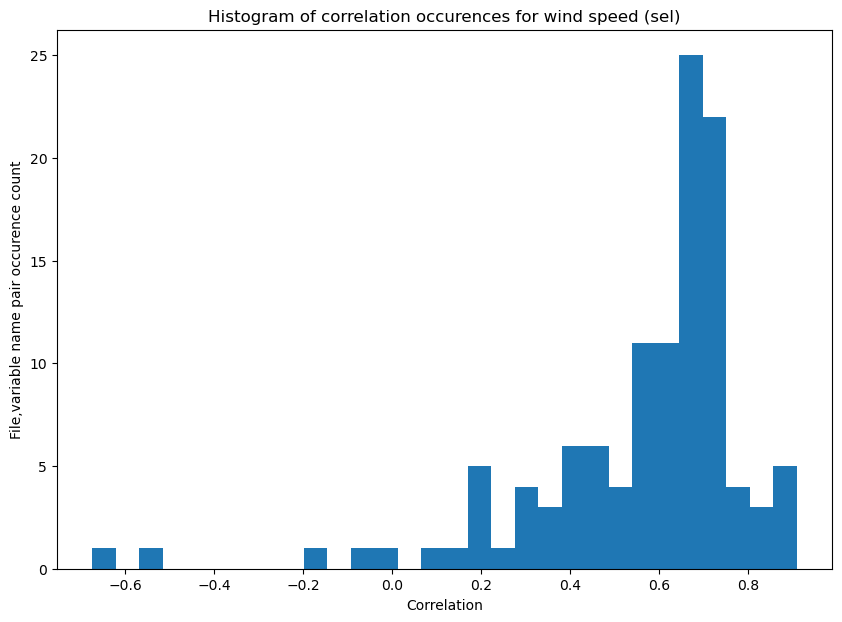

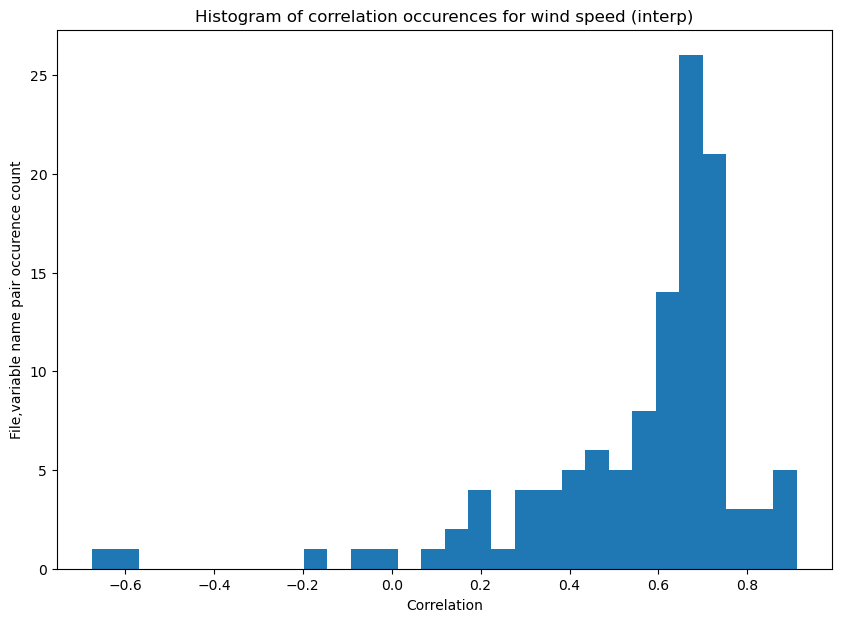

In [19]:
corr_hist(result_df_sel_wspd_corr, "wind speed (sel)")
corr_hist(result_df_interp_wspd_corr, "wind speed (interp)")

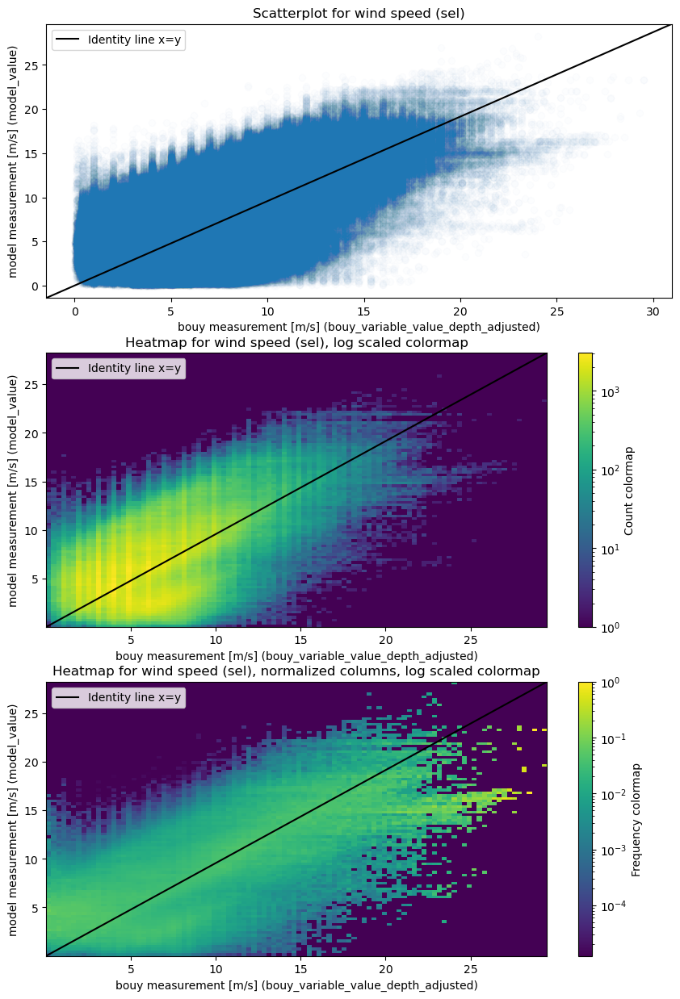

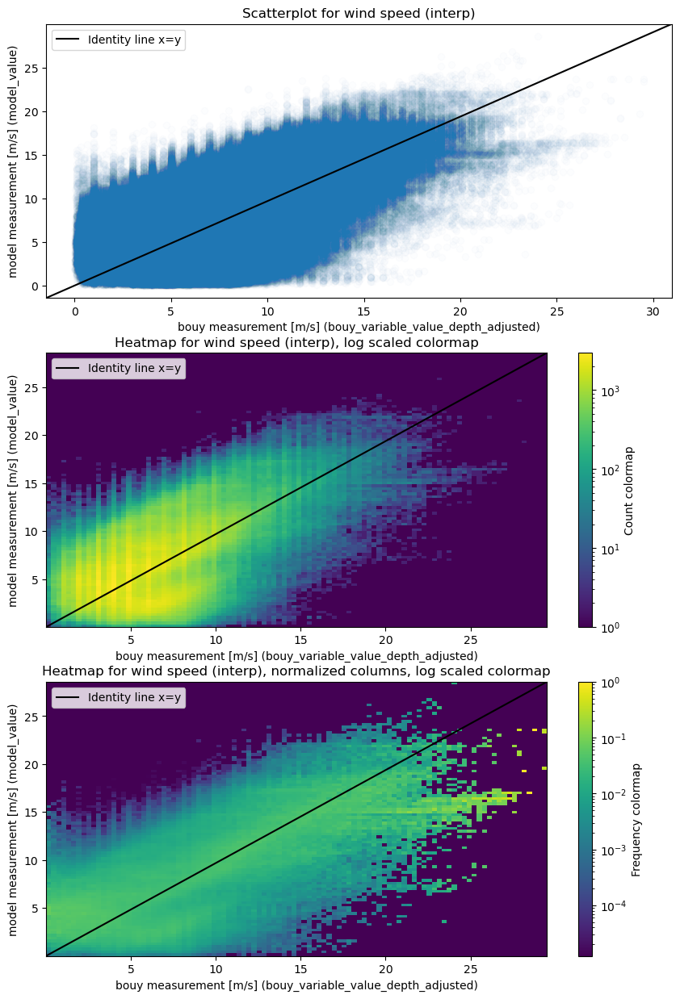

In [20]:
scatterplot_and_heatmaps(result_df_sel_wspd, "wind speed (sel)", "m/s", bouy_variable_column='bouy_variable_value_depth_adjusted')
scatterplot_and_heatmaps(result_df_interp_wspd, "wind speed (interp)", "m/s", bouy_variable_column='bouy_variable_value_depth_adjusted')

Worst and best files for WSPD using sel
-------------------- The 6 files with worst correlation --------------------
The correlation for  WSPD in GL_TS_MO_14043.nc is -0.6737519543108944


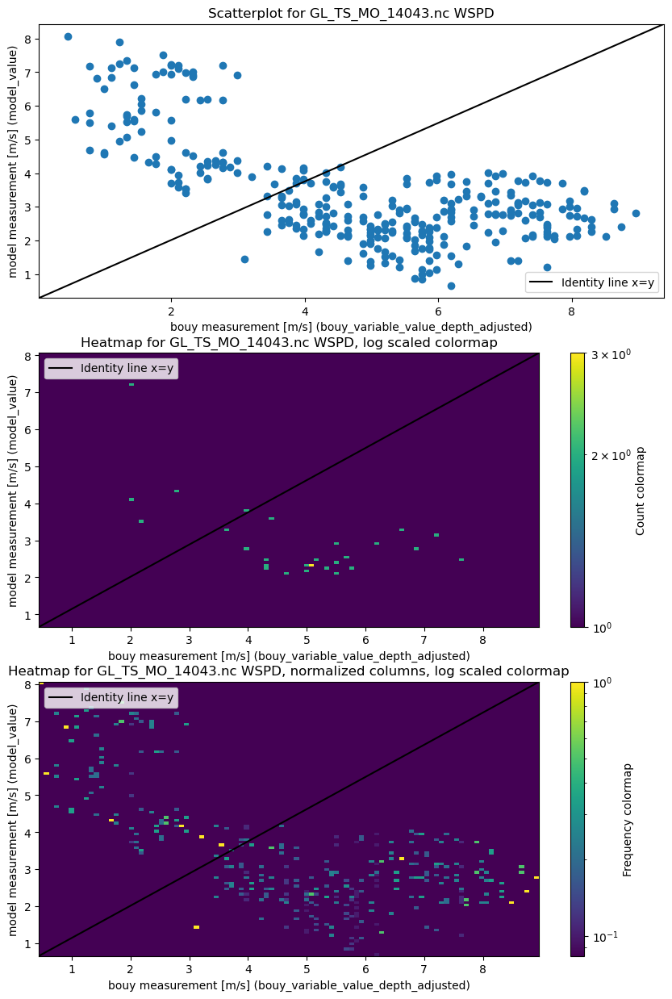

The correlation for  WSPD in BO_TS_MO_Asko.nc is -0.5600406017097075


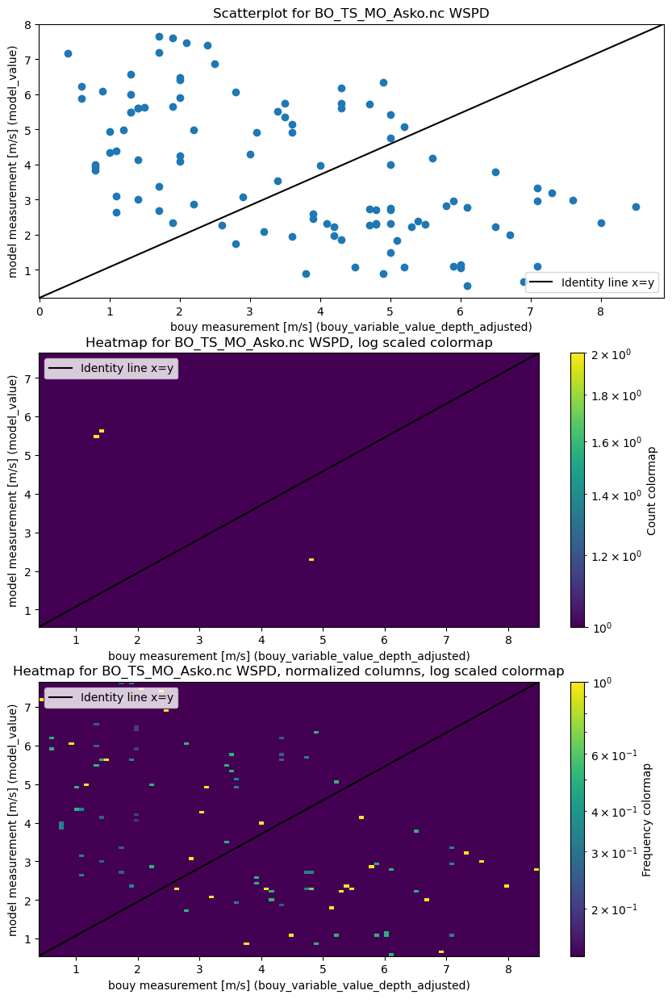

The correlation for  WSPD in BS_TS_MO_SPOT0776.nc is -0.16222570968025188


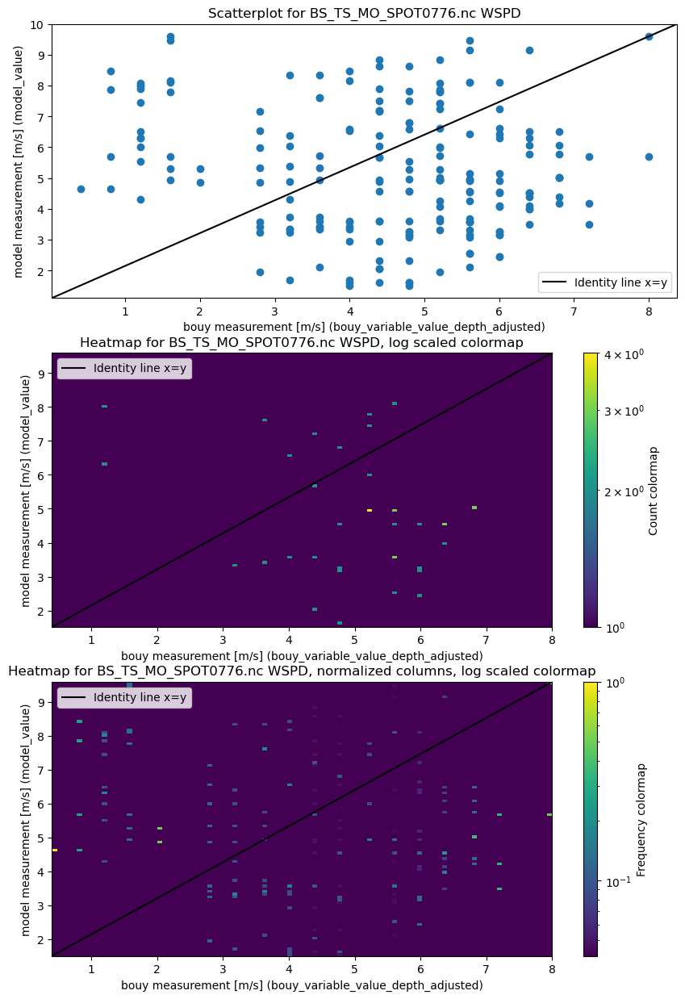

The correlation for  WSPD in BS_TS_MO_UGSB.nc is -0.06962138879593303


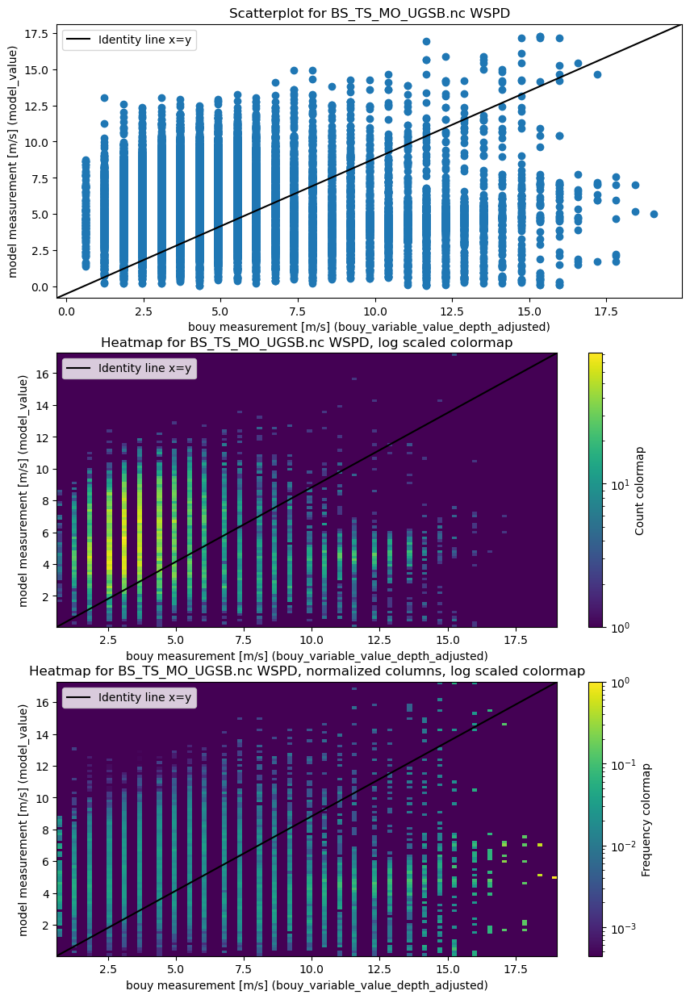

The correlation for  WSPD in BS_TS_MO_URSS.nc is -0.02921414507181052


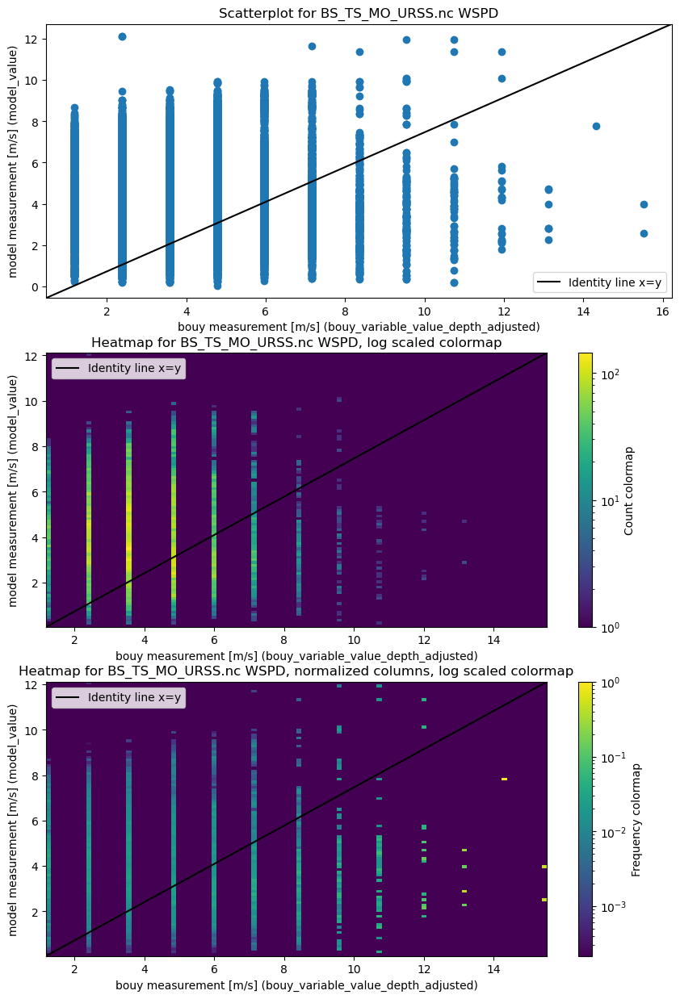

The correlation for  WSPD in BS_TS_MO_SPOT0773.nc is 0.10827958087642067


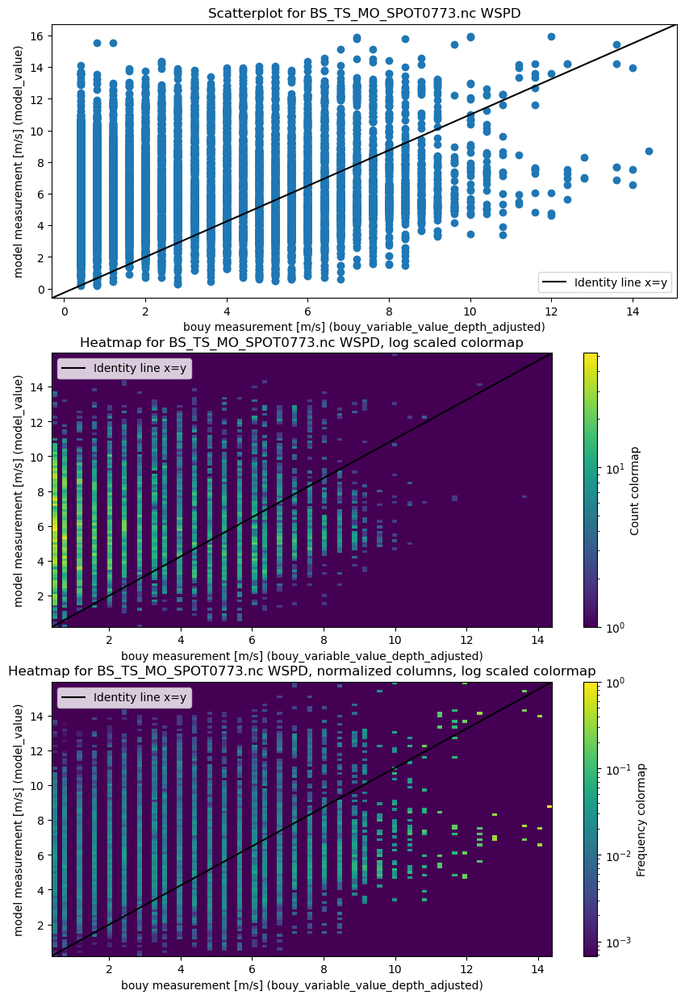

-------------------- The 2 files with best correlation --------------------
The correlation for  WSPD in NO_TS_MO_DarsserS.nc is 0.9044720877702355


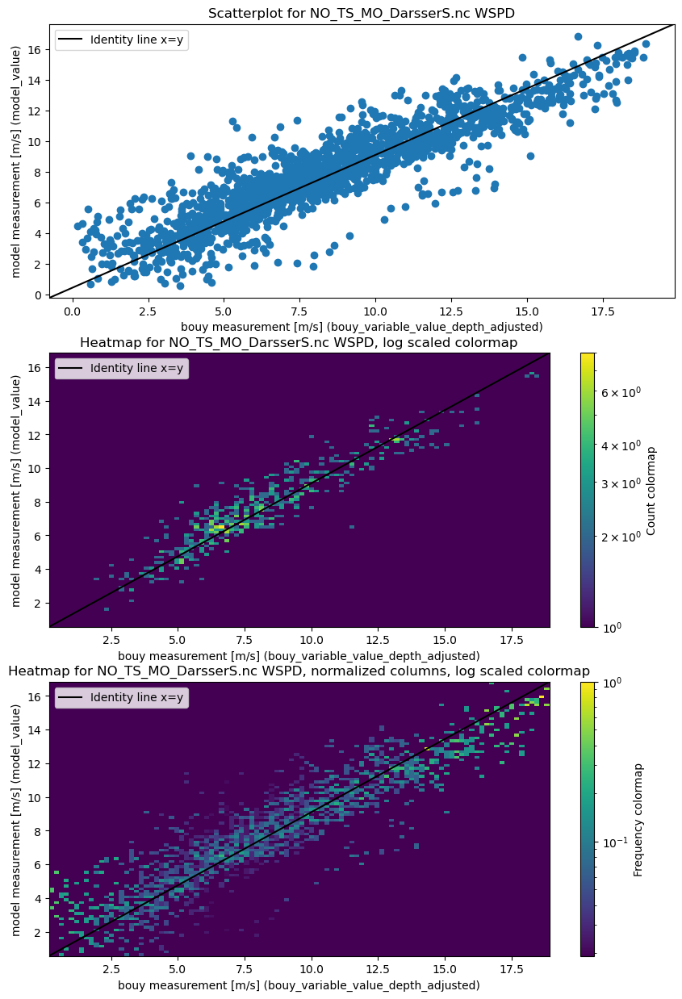

The correlation for  WSPD in NO_TS_MO_Sleipner-A.nc is 0.908983838270864


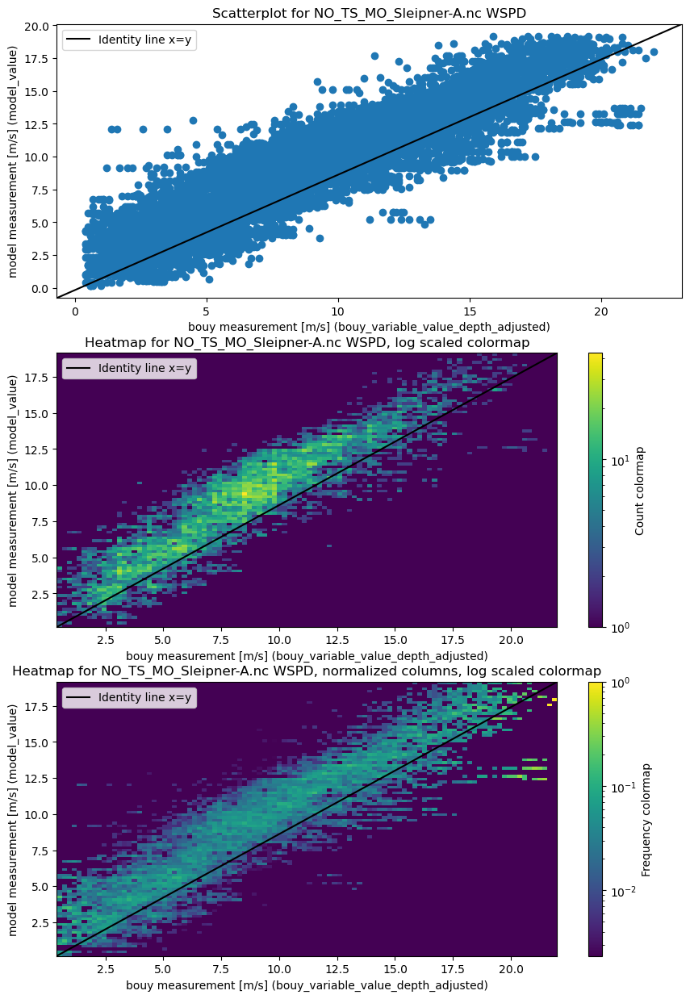

In [21]:
print("Worst and best files for WSPD using sel")
scatterplot_worst_and_best(result_df_sel_wspd, result_df_sel_wspd_corr, bouy_variable_column='bouy_variable_value_depth_adjusted')

Worst and best files for WSPD using interp
-------------------- The 6 files with worst correlation --------------------
The correlation for  WSPD in GL_TS_MO_14043.nc is -0.6737519543108944


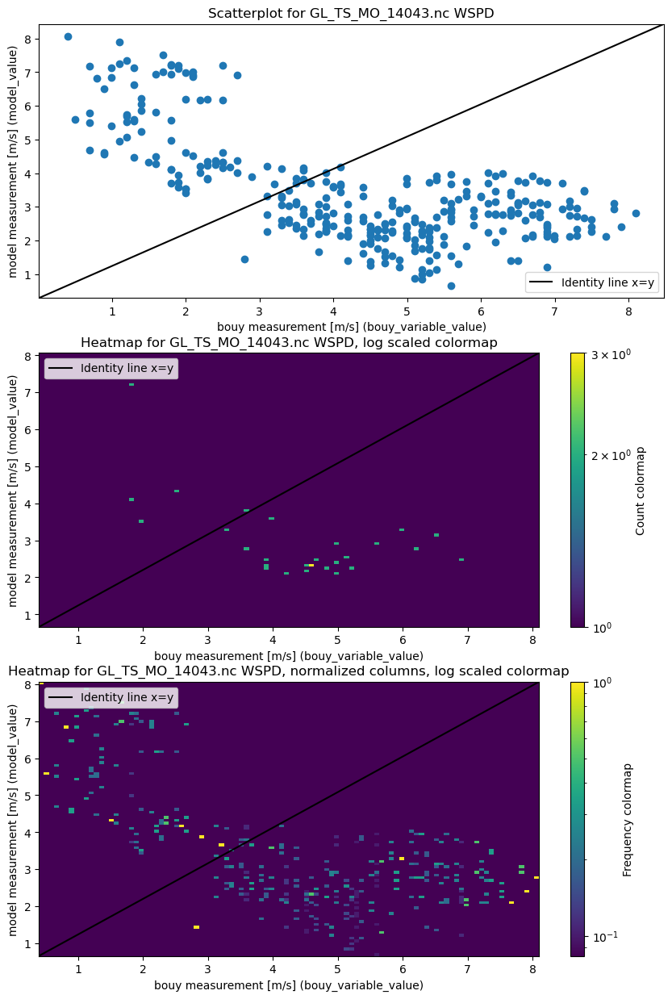

The correlation for  WSPD in BO_TS_MO_Asko.nc is -0.5818826025288167


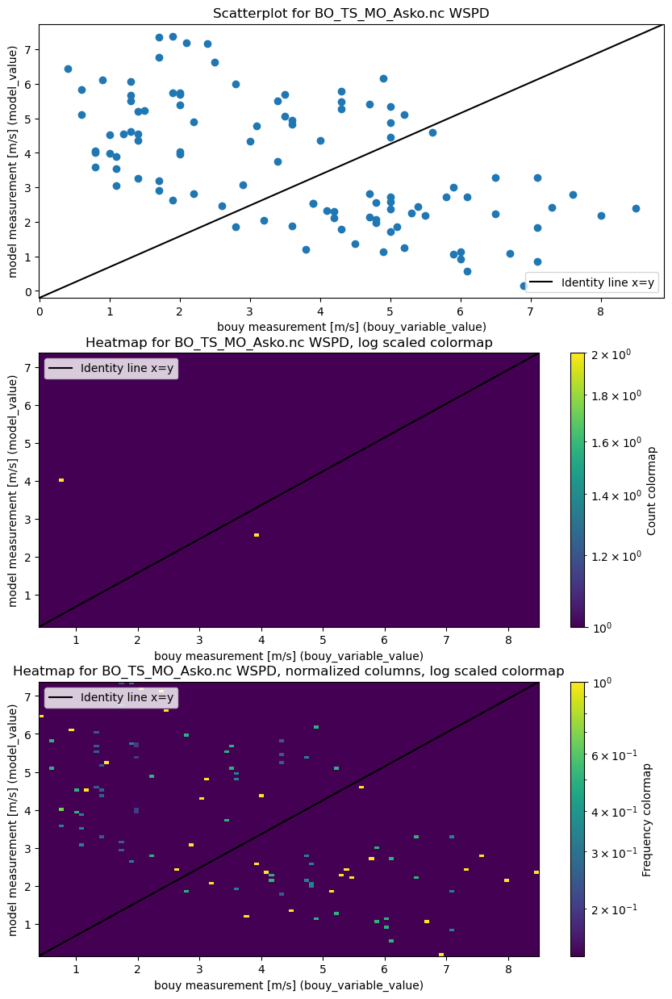

The correlation for  WSPD in BS_TS_MO_SPOT0776.nc is -0.15704250048233254


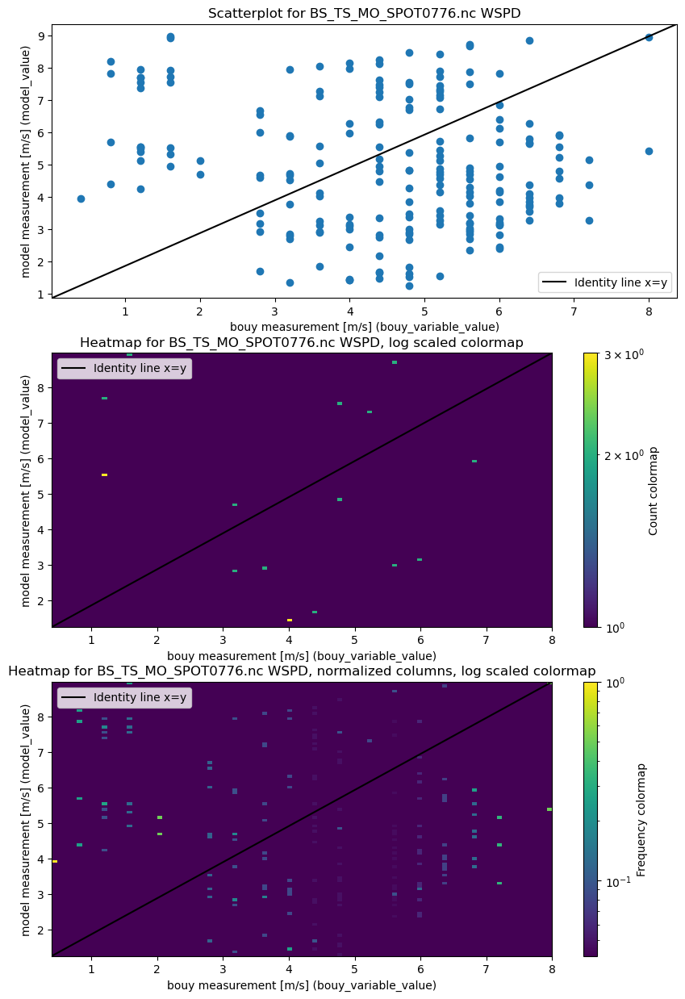

The correlation for  WSPD in BS_TS_MO_UGSB.nc is -0.06653241230654845


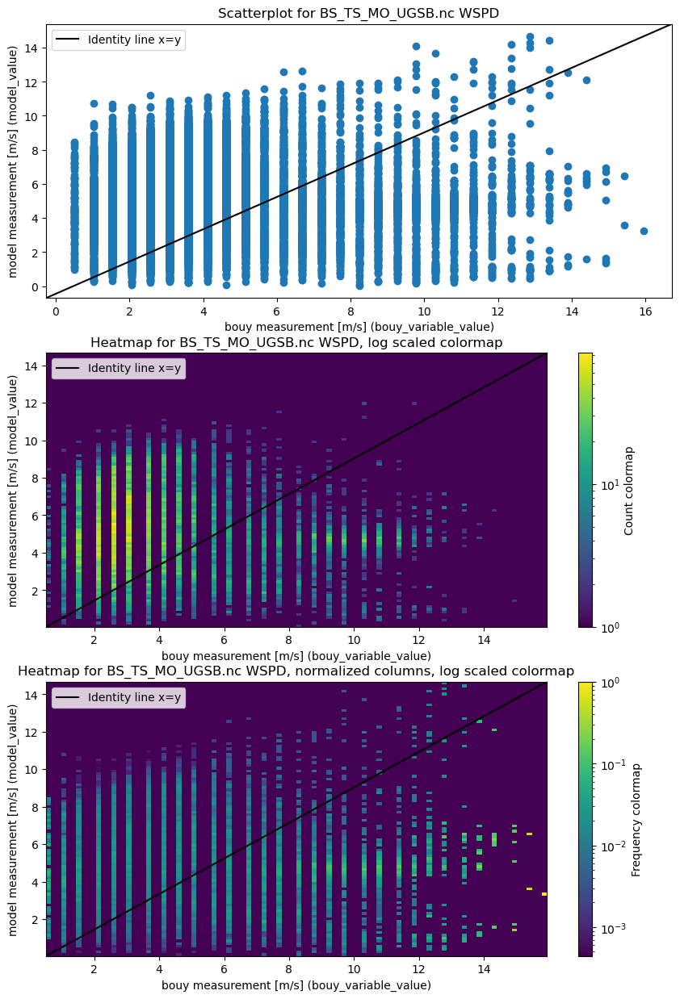

The correlation for  WSPD in BS_TS_MO_URSS.nc is 0.004999831953560702


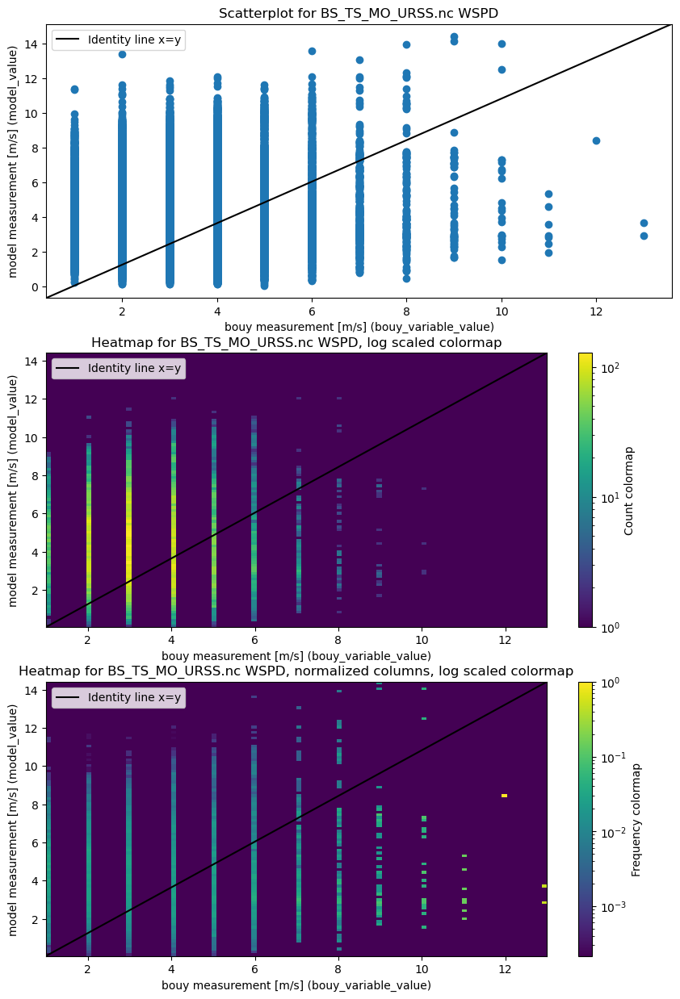

The correlation for  WSPD in BS_TS_MO_SPOT0773.nc is 0.07634557804418818


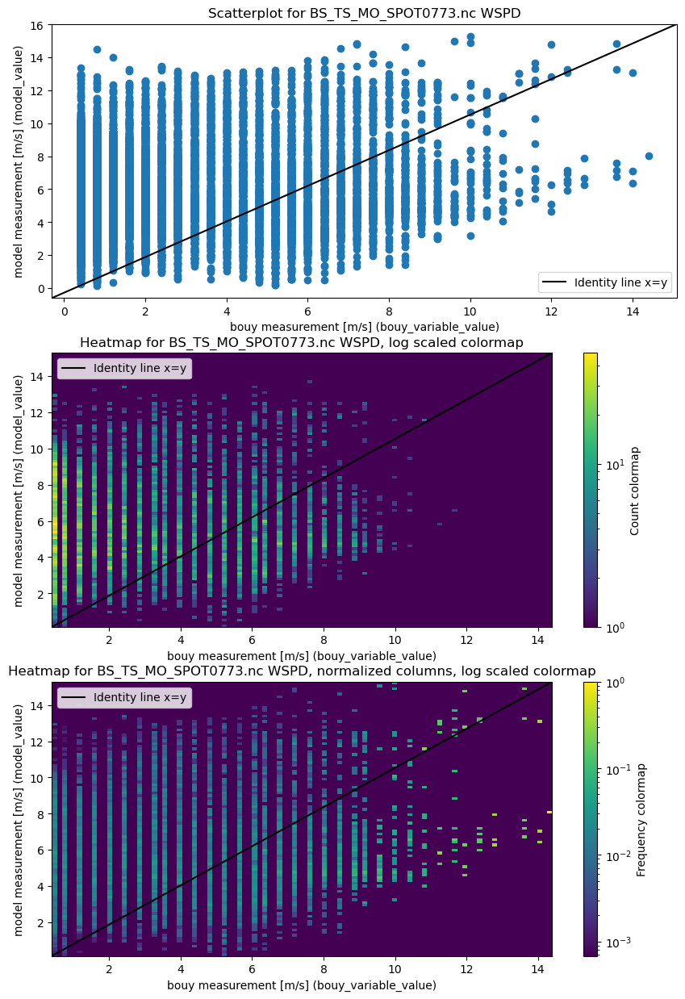

-------------------- The 2 files with best correlation --------------------
The correlation for  WSPD in NO_TS_MO_DarsserS.nc is 0.8995044322982123


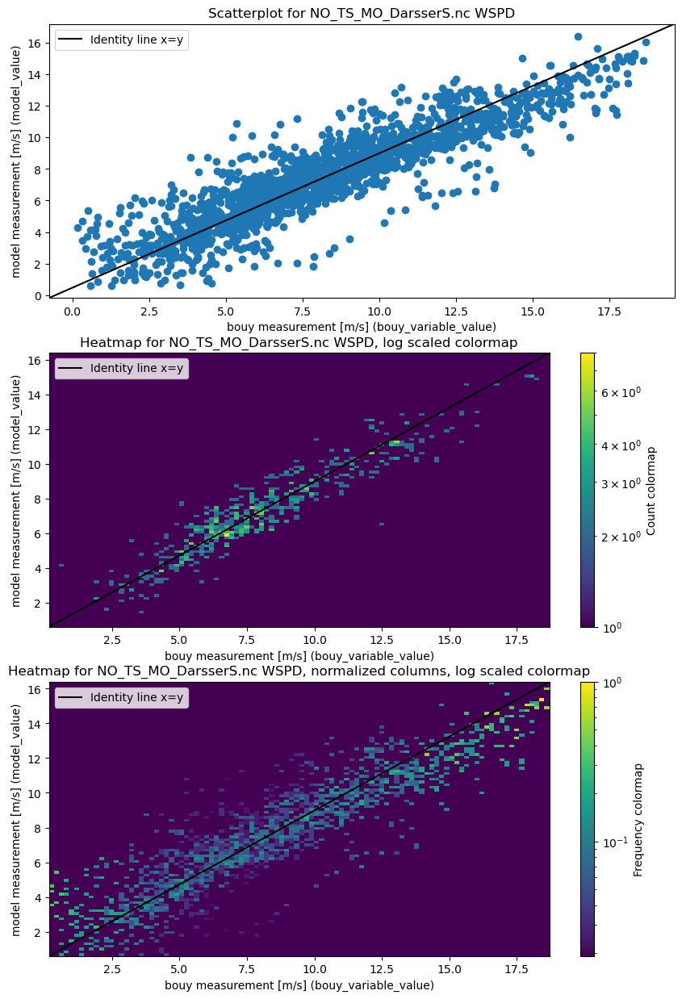

The correlation for  WSPD in NO_TS_MO_Sleipner-A.nc is 0.9113767033792816


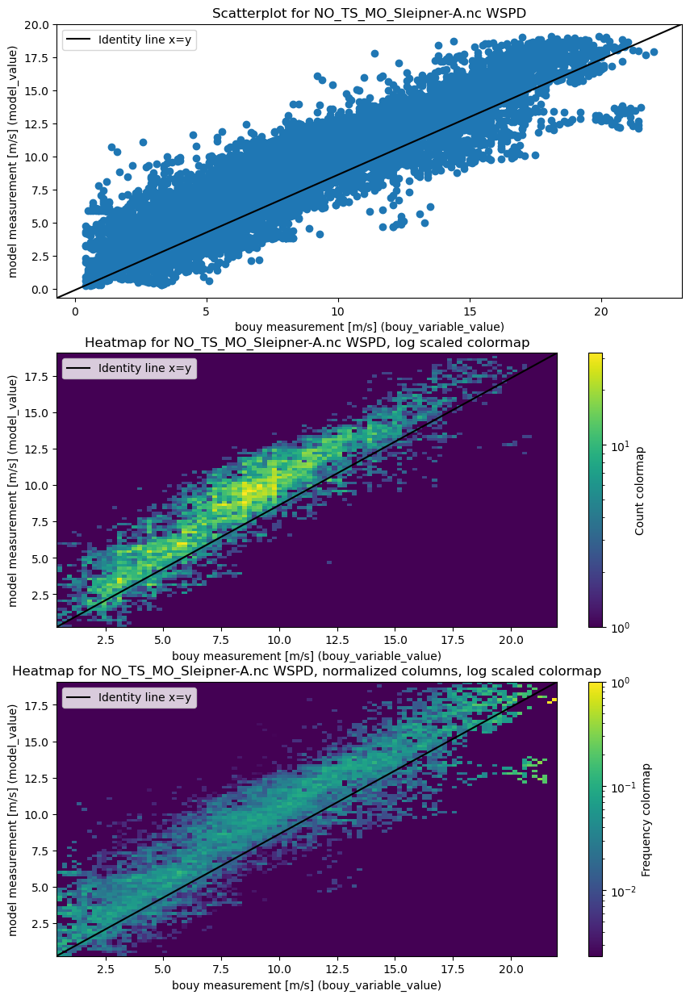

In [22]:
print("Worst and best files for WSPD using interp")
scatterplot_worst_and_best(result_df_interp_wspd, result_df_interp_wspd_corr)

#### Copernicus wind speed model

In [23]:
result_df_sel_coper_wspd_corr = corr_list(coper_wspd_df_sel)
display(result_df_sel_coper_wspd_corr)
result_df_interp_coper_wspd_corr = corr_list(coper_wspd_df_interp)
display(result_df_interp_coper_wspd_corr)

bouy_file_name        bouy_variable_name
GL_TS_MO_2300453.nc   WSPD                  0.129218
GL_TS_MO_46146.nc     WSPD                  0.147279
BS_TS_MO_SPOT0776.nc  WSPD                  0.271339
GL_TS_MO_T5N165E.nc   WSPD                  0.273648
GL_TS_MO_13010.nc     WSPD                  0.328744
                                              ...   
GL_TS_MO_46073.nc     WSPD                  0.954940
NO_TS_MO_6200081.nc   WSPD                  0.957625
GL_TS_MO_46035.nc     WSPD                  0.958018
GL_TS_MO_46070.nc     WSPD                  0.961098
GL_TS_MO_48400.nc     WSPD                  0.964035
Name: bouy_variable_value_corr, Length: 353, dtype: float64

bouy_file_name        bouy_variable_name
GL_TS_MO_2300453.nc   WSPD                  0.128948
GL_TS_MO_46146.nc     WSPD                  0.154410
GL_TS_MO_T5N165E.nc   WSPD                  0.273898
BS_TS_MO_SPOT0776.nc  WSPD                  0.279207
GL_TS_MO_13010.nc     WSPD                  0.321713
                                              ...   
GL_TS_MO_46073.nc     WSPD                  0.955536
NO_TS_MO_6200081.nc   WSPD                  0.957729
GL_TS_MO_46035.nc     WSPD                  0.959023
GL_TS_MO_46070.nc     WSPD                  0.961202
GL_TS_MO_48400.nc     WSPD                  0.964428
Name: bouy_variable_value_corr, Length: 353, dtype: float64

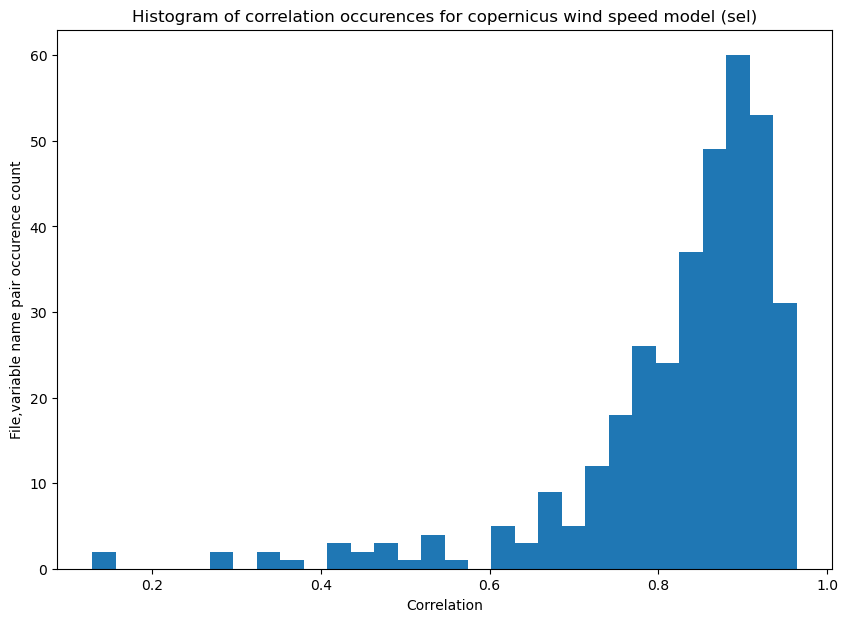

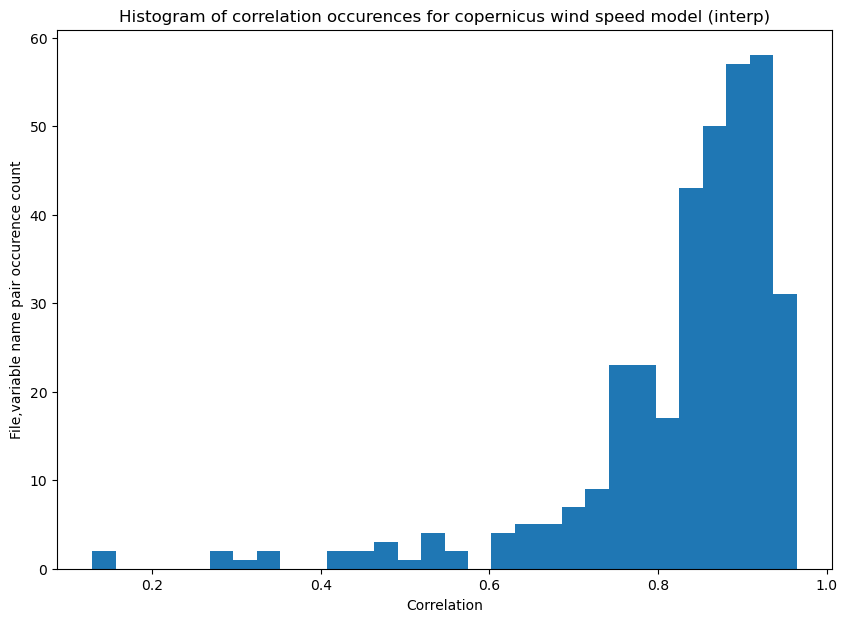

In [24]:
corr_hist(result_df_sel_coper_wspd_corr, "copernicus wind speed model (sel)")
corr_hist(result_df_interp_coper_wspd_corr, "copernicus wind speed model (interp)")

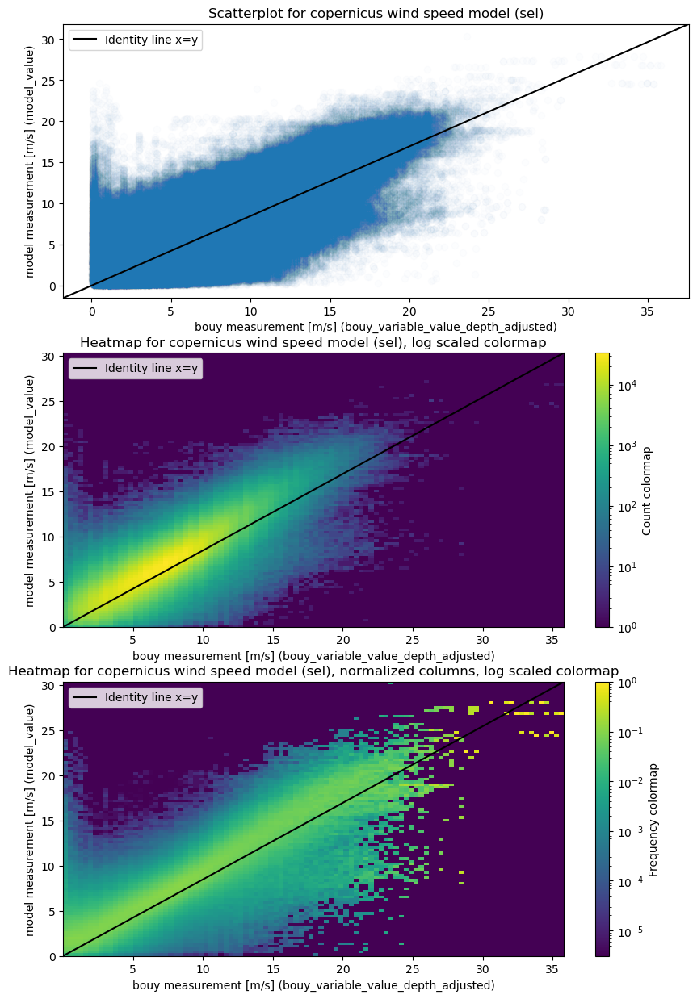

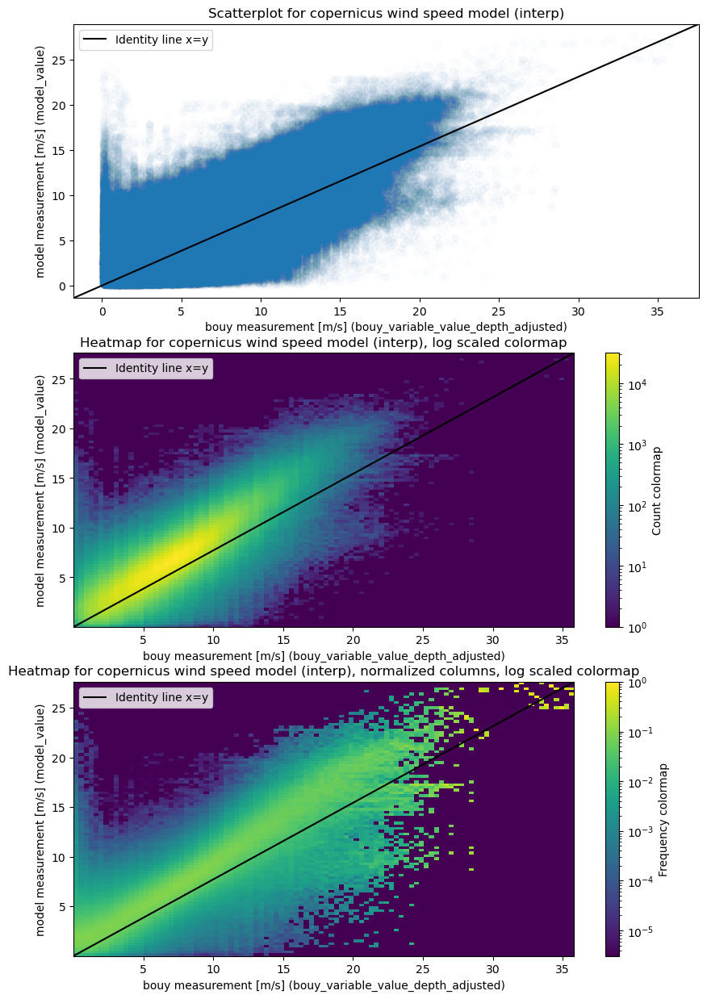

In [25]:
scatterplot_and_heatmaps(coper_wspd_df_sel, "copernicus wind speed model (sel)", "m/s", bouy_variable_column='bouy_variable_value_depth_adjusted')
scatterplot_and_heatmaps(coper_wspd_df_interp, "copernicus wind speed model (interp)", "m/s", bouy_variable_column='bouy_variable_value_depth_adjusted')

Worst and best files for WSPD using interp
-------------------- The 6 files with worst correlation --------------------
The correlation for  WSPD in GL_TS_MO_2300453.nc is 0.12921782997774278


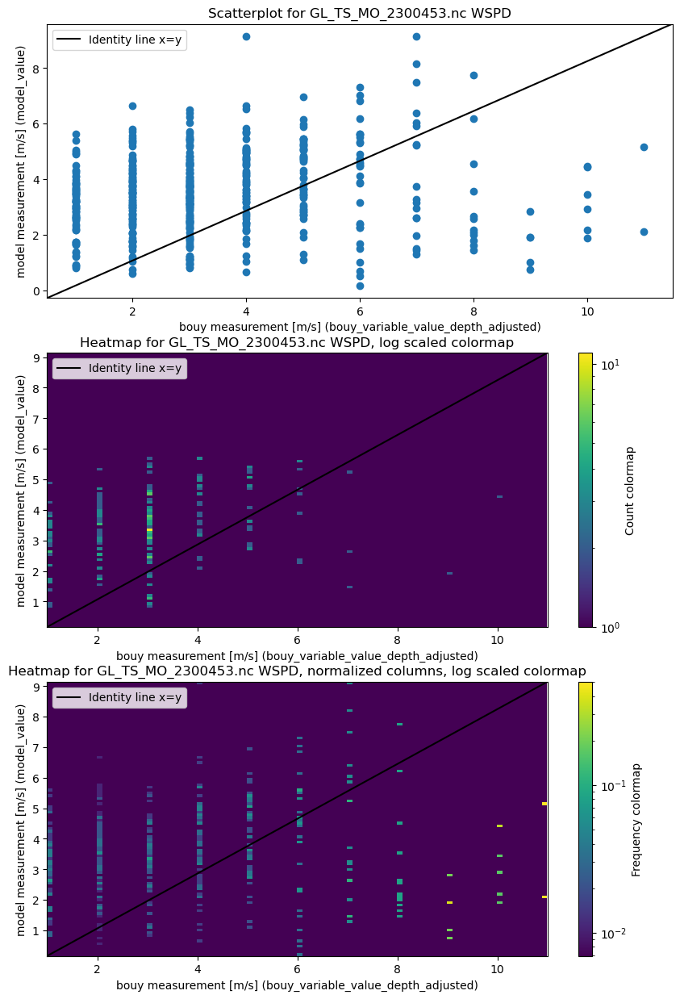

The correlation for  WSPD in GL_TS_MO_46146.nc is 0.14727873435618247


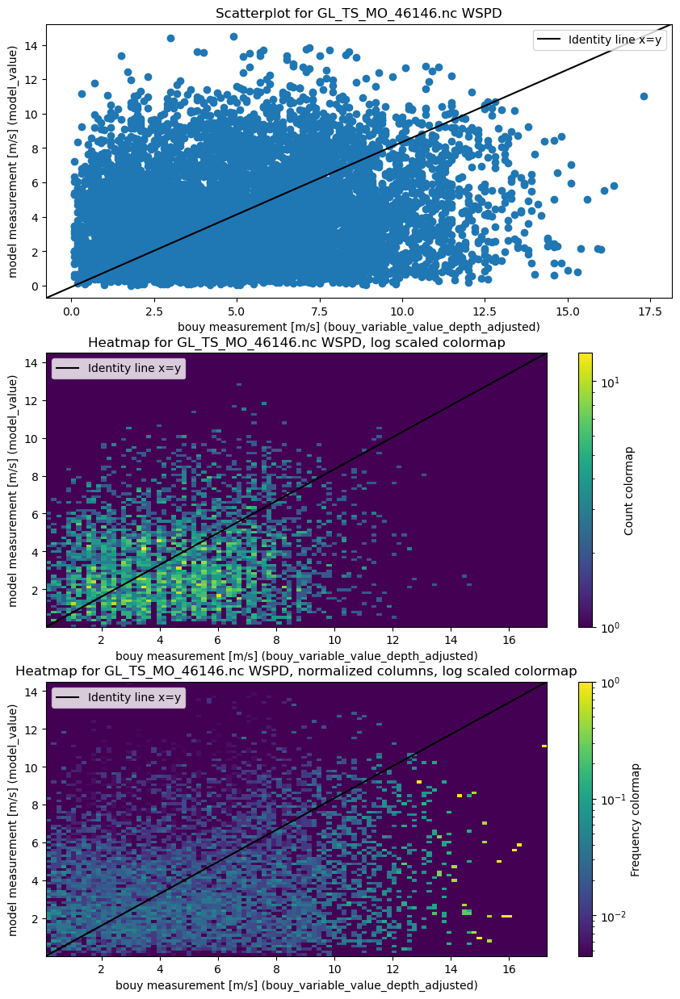

The correlation for  WSPD in BS_TS_MO_SPOT0776.nc is 0.27133909795266997


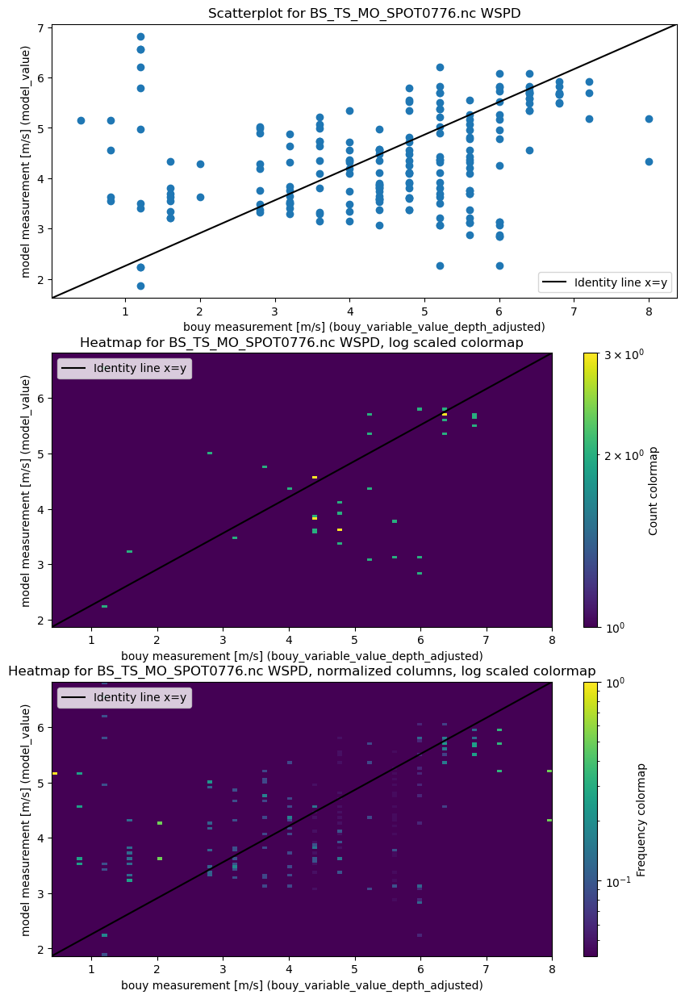

The correlation for  WSPD in GL_TS_MO_T5N165E.nc is 0.27364819753823916


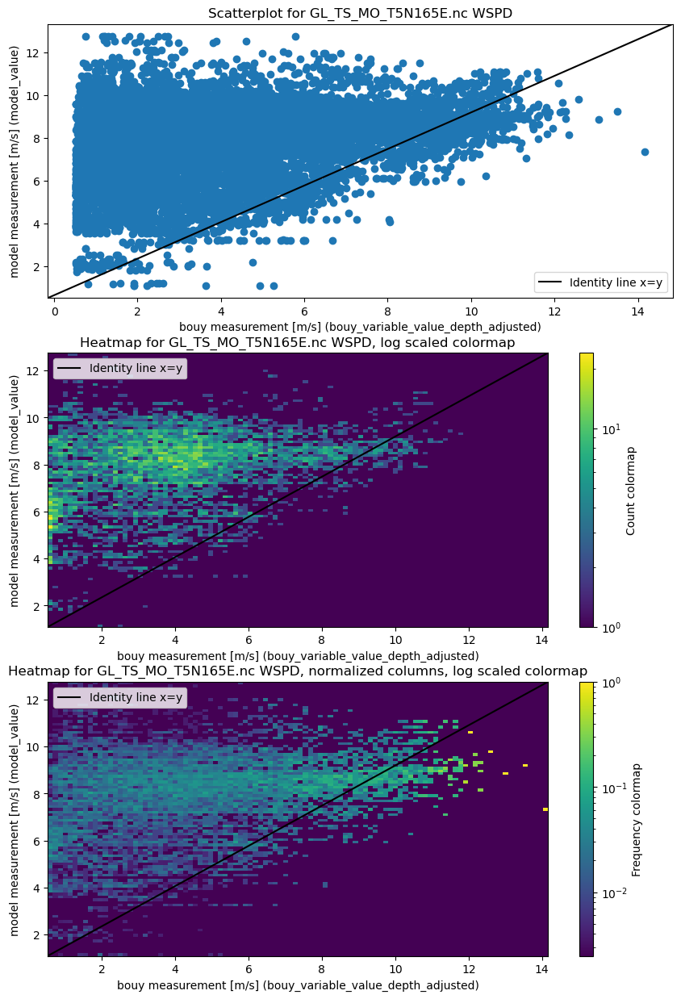

The correlation for  WSPD in GL_TS_MO_13010.nc is 0.3287444833412858


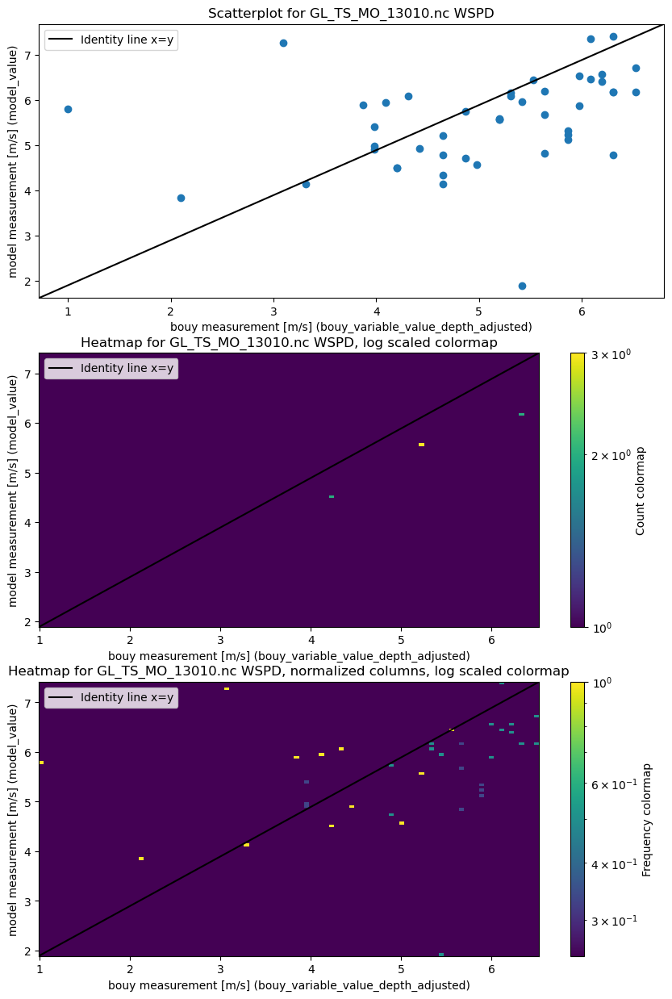

The correlation for  WSPD in BS_TS_MO_URSS.nc is 0.3362210412871585


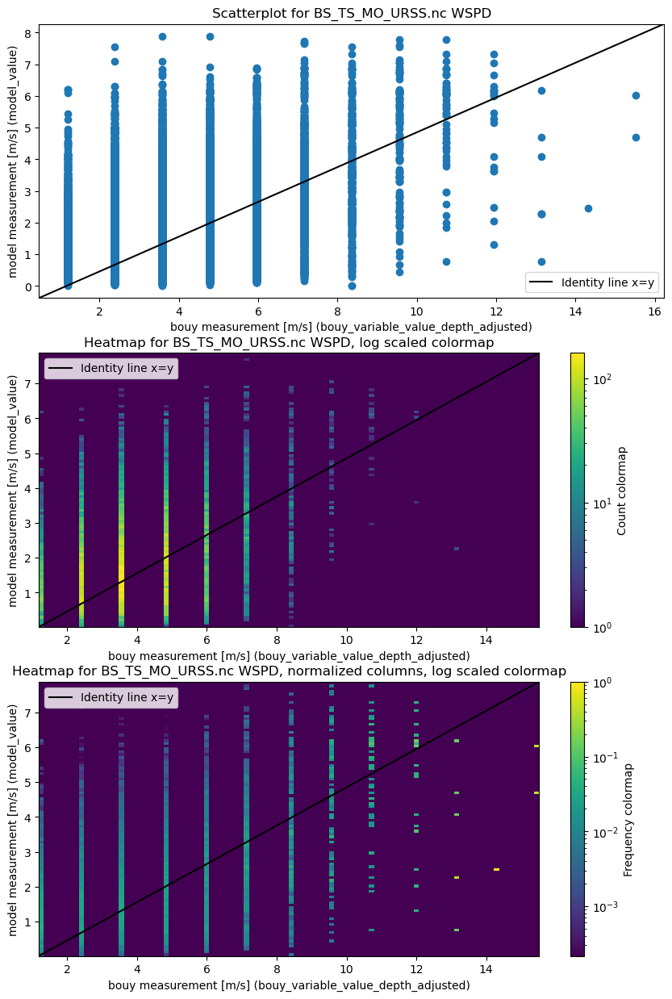

-------------------- The 2 files with best correlation --------------------
The correlation for  WSPD in GL_TS_MO_46070.nc is 0.9610977000219753


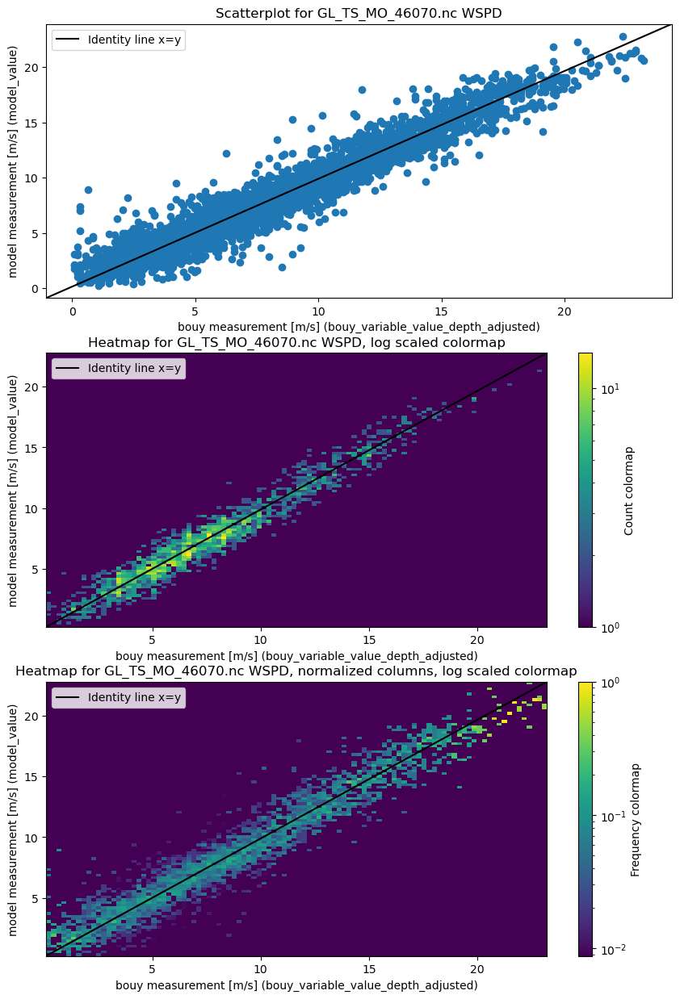

The correlation for  WSPD in GL_TS_MO_48400.nc is 0.9640353250950906


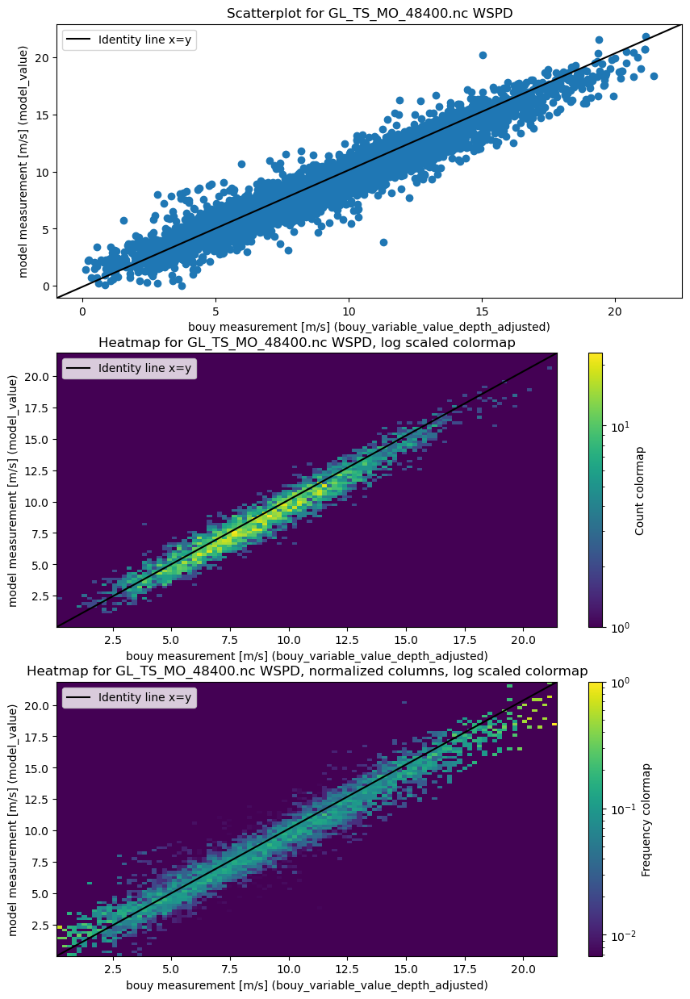

In [26]:
print("Worst and best files for WSPD using interp")
scatterplot_worst_and_best(coper_wspd_df_sel, result_df_sel_coper_wspd_corr, bouy_variable_column='bouy_variable_value_depth_adjusted')

Worst and best files for WSPD using interp
-------------------- The 6 files with worst correlation --------------------
The correlation for  WSPD in GL_TS_MO_2300453.nc is 0.1289480107182705


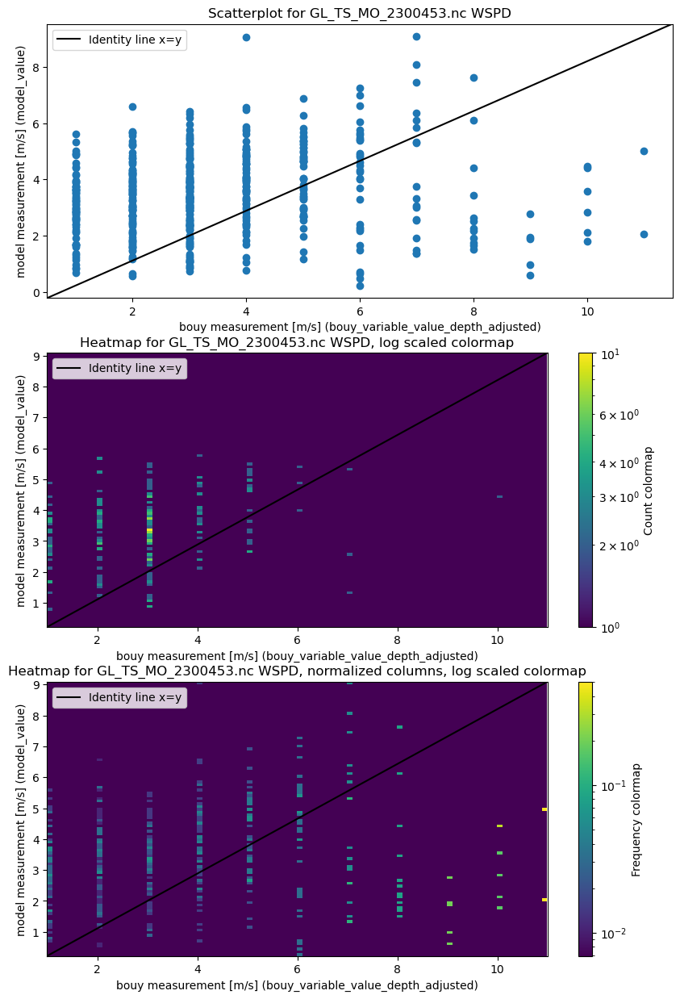

The correlation for  WSPD in GL_TS_MO_46146.nc is 0.15441037015025194


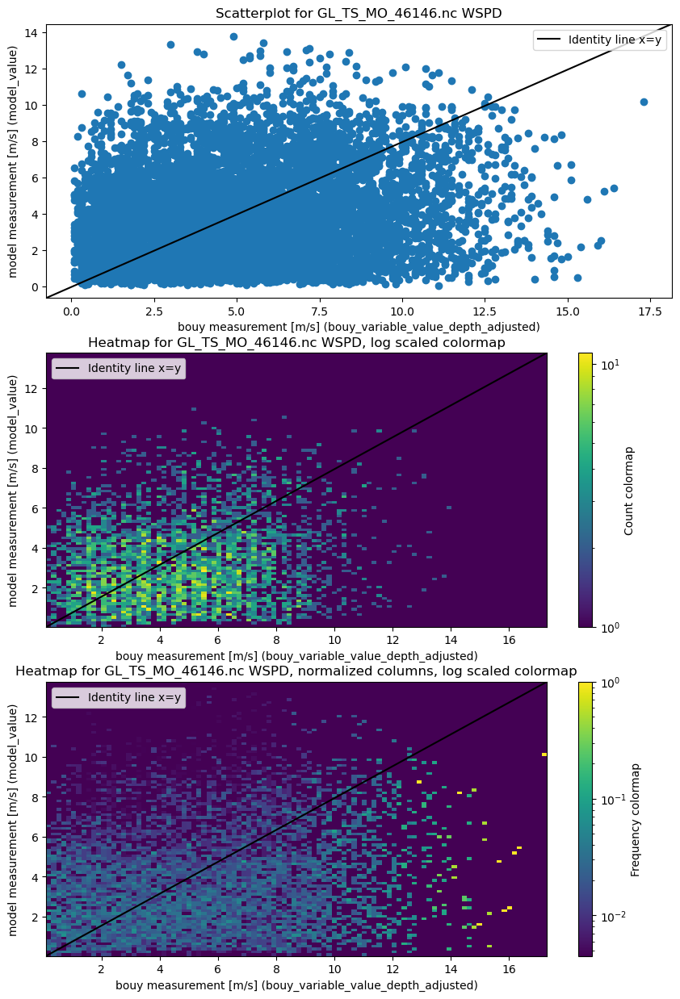

The correlation for  WSPD in GL_TS_MO_T5N165E.nc is 0.2738983727571295


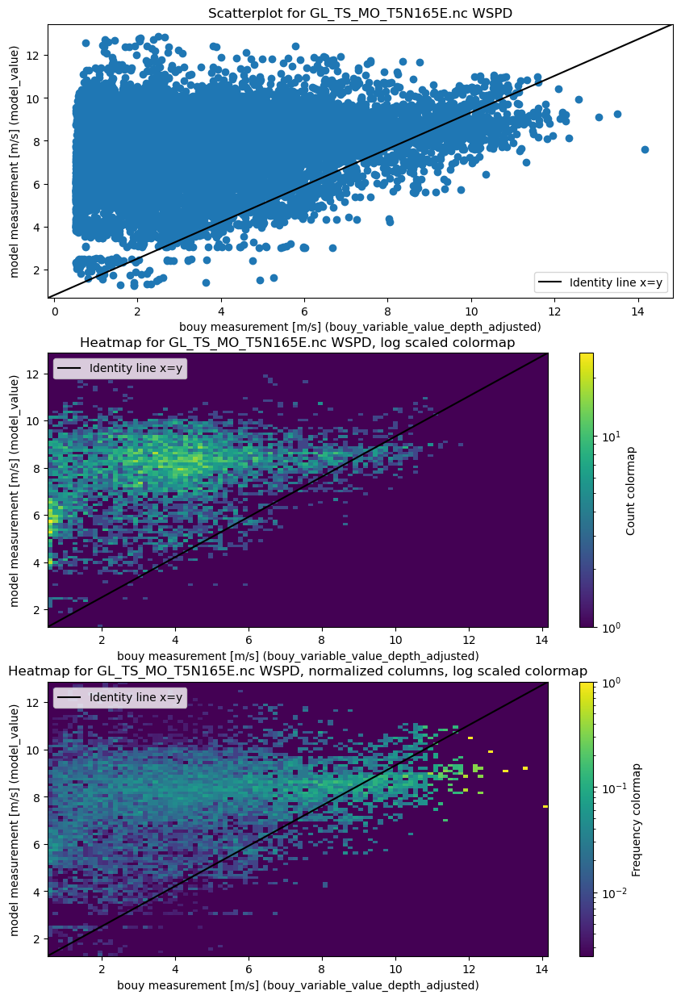

The correlation for  WSPD in BS_TS_MO_SPOT0776.nc is 0.2792070168125883


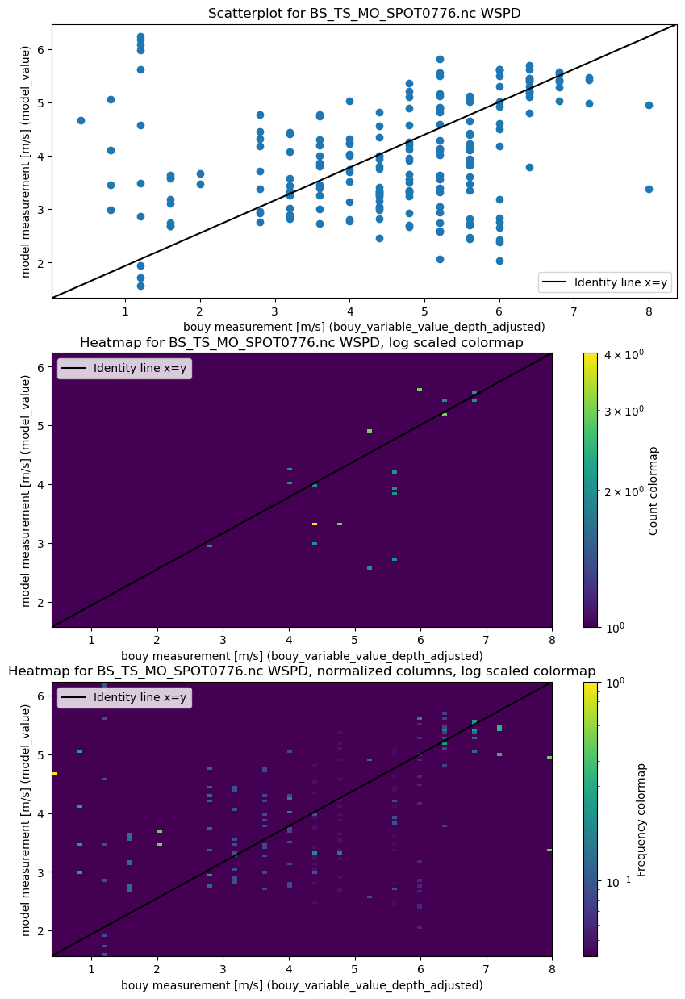

The correlation for  WSPD in GL_TS_MO_13010.nc is 0.32171330042440643


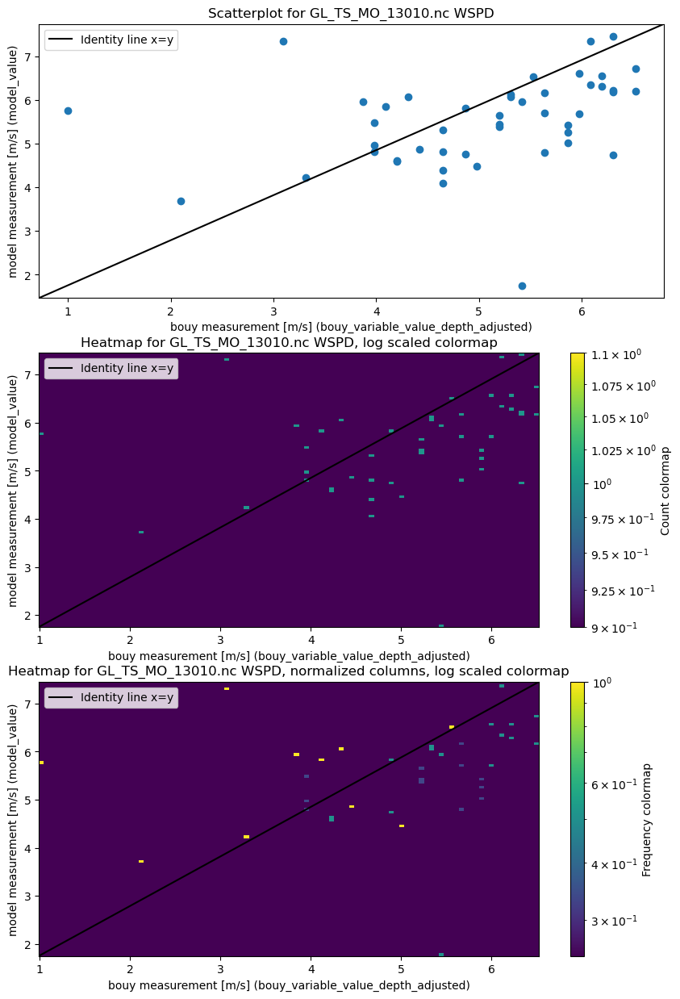

The correlation for  WSPD in BS_TS_MO_URSS.nc is 0.3335160559599


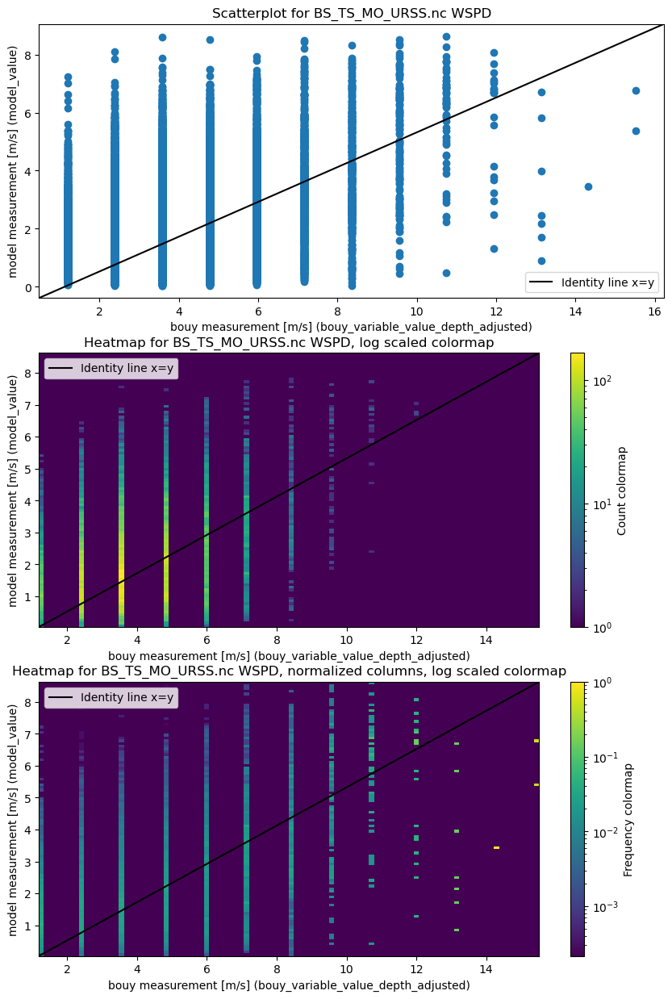

-------------------- The 2 files with best correlation --------------------
The correlation for  WSPD in GL_TS_MO_46070.nc is 0.9612016879306561


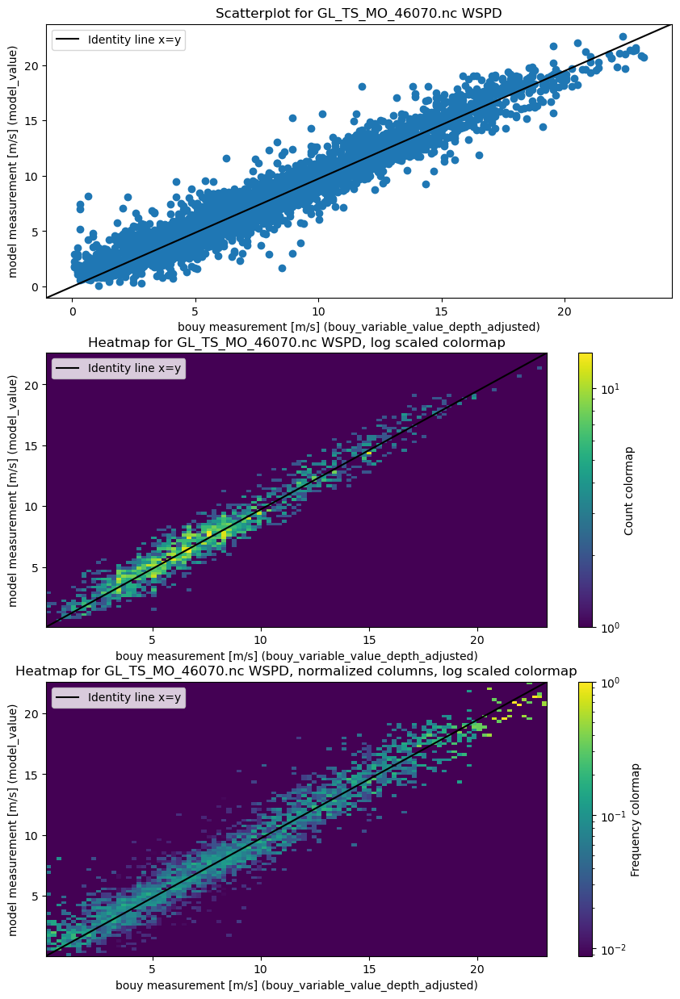

The correlation for  WSPD in GL_TS_MO_48400.nc is 0.9644283850204157


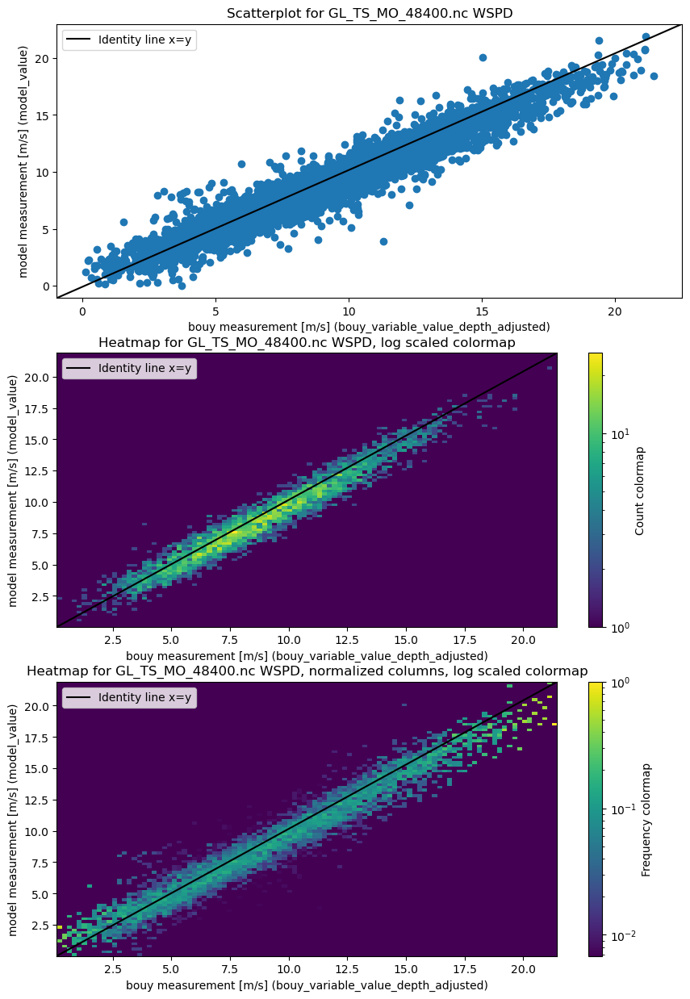

In [27]:
print("Worst and best files for WSPD using interp")
scatterplot_worst_and_best(coper_wspd_df_interp, result_df_interp_coper_wspd_corr, bouy_variable_column='bouy_variable_value_depth_adjusted')

#### Both models

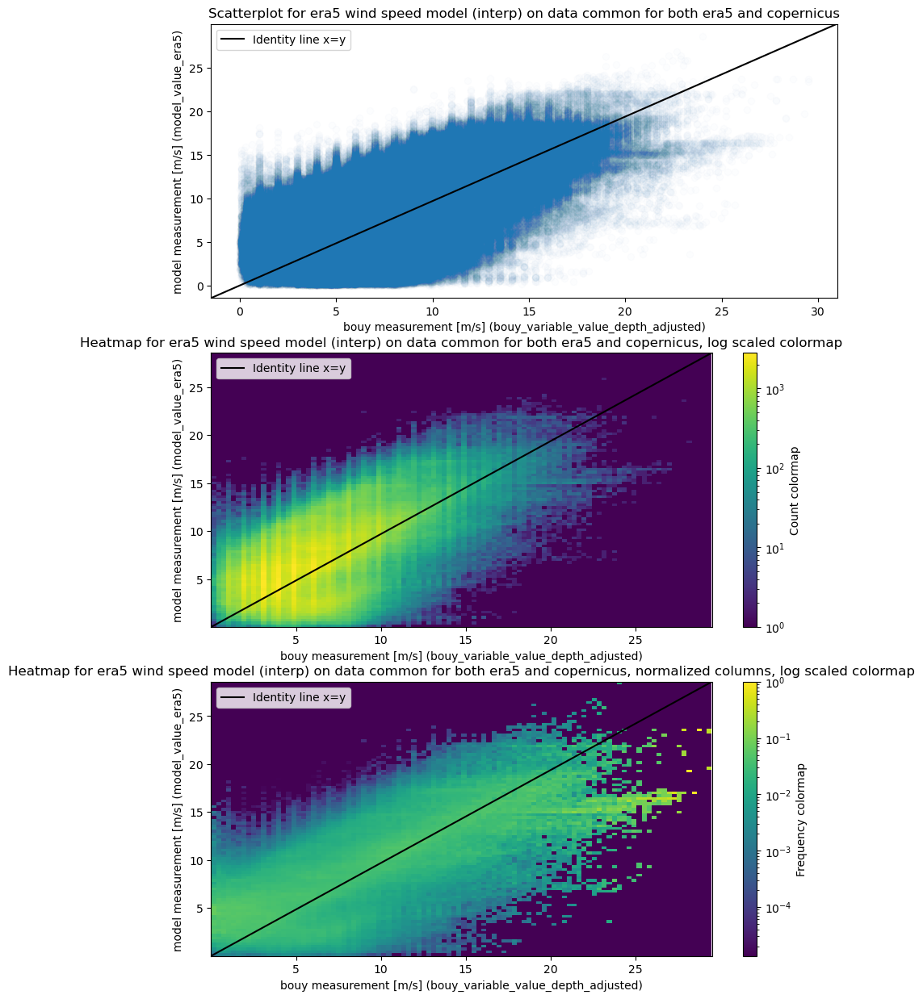

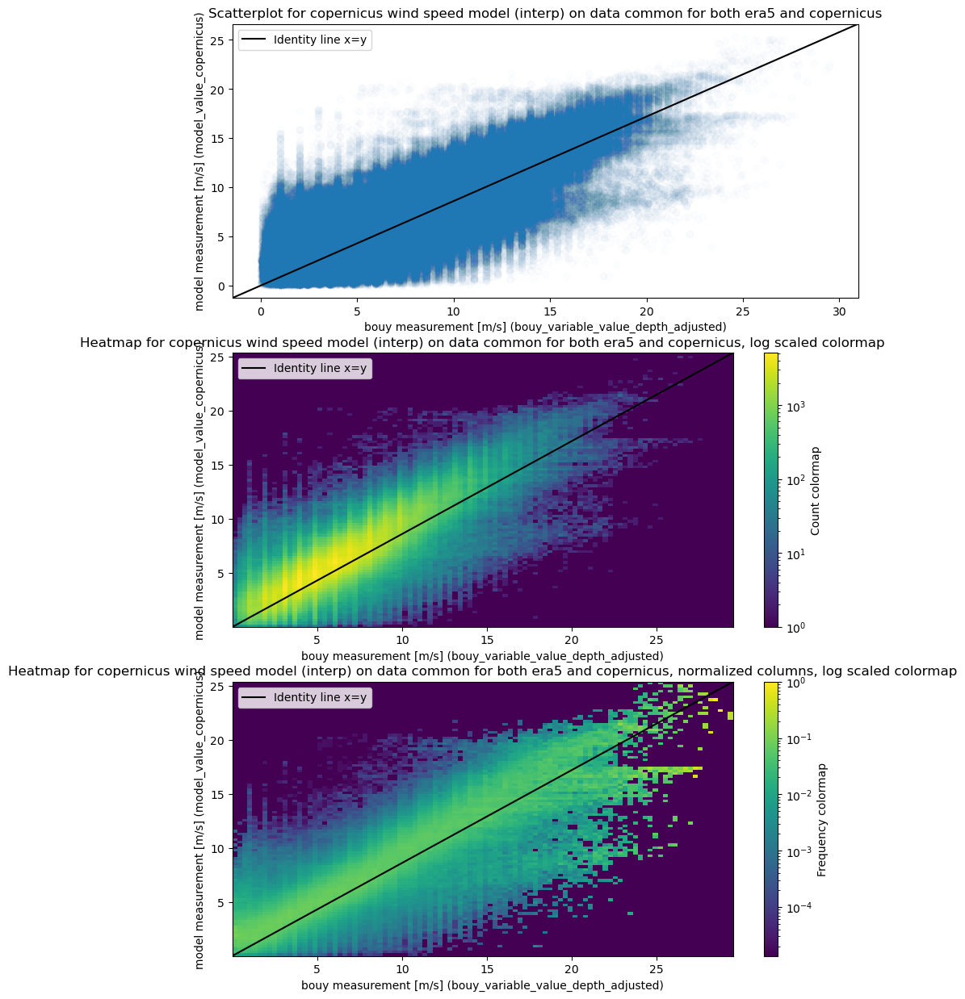

In [28]:
interp_wspd_row_wise_merged_corr_era5 = corr_list(interp_wspd_row_wise_merged, group_by=['bouy_file_name'], bouy_variable_column='bouy_variable_value_depth_adjusted', model_variable_column='model_value_era5')
interp_wspd_row_wise_merged_corr_coper = corr_list(interp_wspd_row_wise_merged, group_by=['bouy_file_name'], bouy_variable_column='bouy_variable_value_depth_adjusted', model_variable_column='model_value_copernicus')

#corr_hist(interp_wspd_row_wise_merged_corr_era5, "era5 wind speed (interp) on data common for both era5 and copernicus", xlim=[0,1])
#corr_hist(interp_wspd_row_wise_merged_corr_coper, "copernicus wind speed (interp) on data common for both era5 and copernicus", xlim=[0,1])

scatterplot_and_heatmaps(interp_wspd_row_wise_merged, "era5 wind speed model (interp) on data common for both era5 and copernicus", "m/s", bouy_variable_column='bouy_variable_value_depth_adjusted', model_varialbe_column='model_value_era5')
scatterplot_and_heatmaps(interp_wspd_row_wise_merged, "copernicus wind speed model (interp) on data common for both era5 and copernicus", "m/s", bouy_variable_column='bouy_variable_value_depth_adjusted', model_varialbe_column='model_value_copernicus')

### Plots of correlation wave height

In [29]:
result_df_sel_VAVH = result_df_sel[
    (result_df_sel['bouy_variable_name'] == 'VAVH')
    ]
result_df_sel_VHM0 = result_df_sel[
    (result_df_sel['bouy_variable_name'] == 'VHM0')
    ]
result_df_sel_swh = pd.concat([result_df_sel_VAVH, result_df_sel_VHM0], axis=0)

result_df_sel_VAVH_corr = corr_list(result_df_sel_VAVH)
result_df_sel_VHM0_corr = corr_list(result_df_sel_VHM0)
result_df_sel_swh_corr = corr_list(result_df_sel_swh)

In [30]:
result_df_interp_VAVH = result_df_interp[
    (result_df_interp['bouy_variable_name'] == 'VAVH')
    ]
result_df_interp_VHM0 = result_df_interp[
    (result_df_interp['bouy_variable_name'] == 'VHM0')
    ]
result_df_interp_swh = pd.concat([result_df_interp_VAVH, result_df_interp_VHM0], axis=0)

result_df_interp_VAVH_corr = corr_list(result_df_interp_VAVH)
result_df_interp_VHM0_corr = corr_list(result_df_interp_VHM0)
result_df_interp_swh_corr = corr_list(result_df_interp_swh)

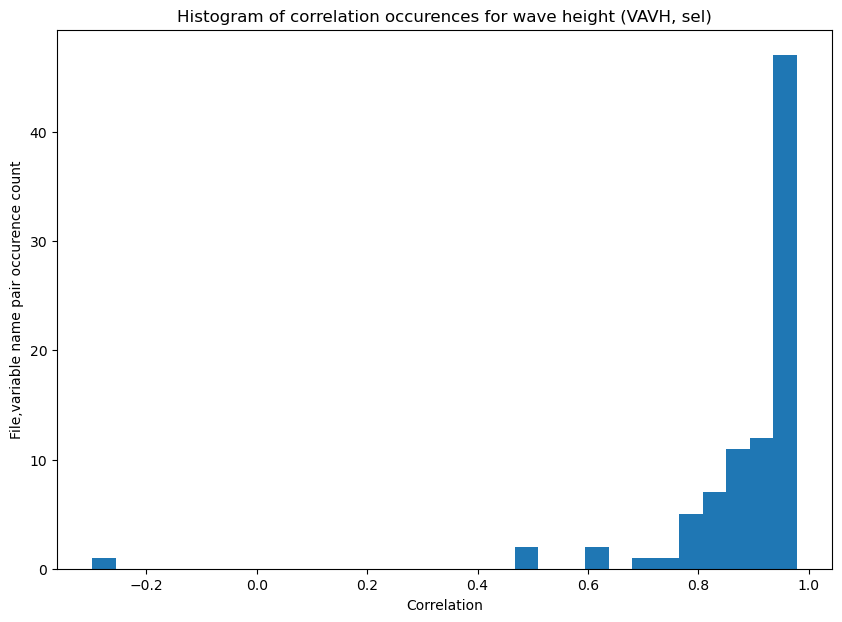

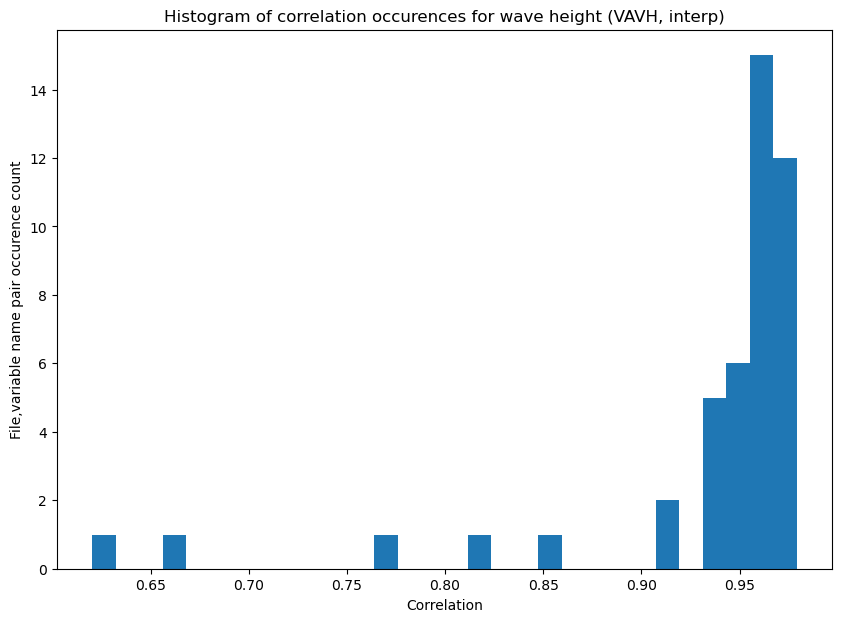

In [31]:
corr_hist(result_df_sel_VAVH_corr, "wave height (VAVH, sel)")
corr_hist(result_df_interp_VAVH_corr, "wave height (VAVH, interp)")

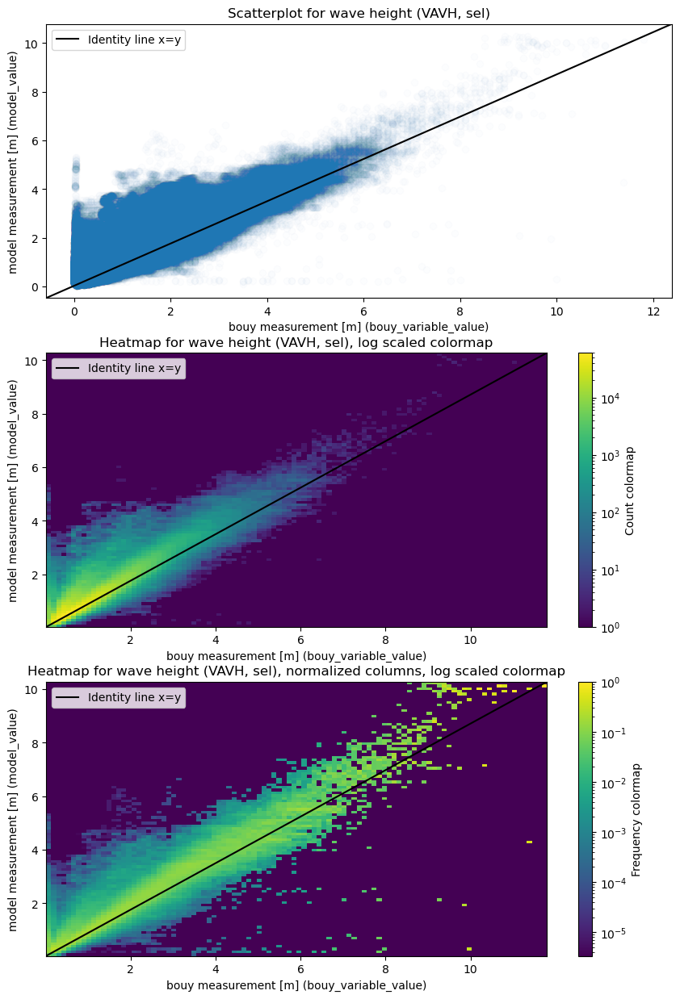

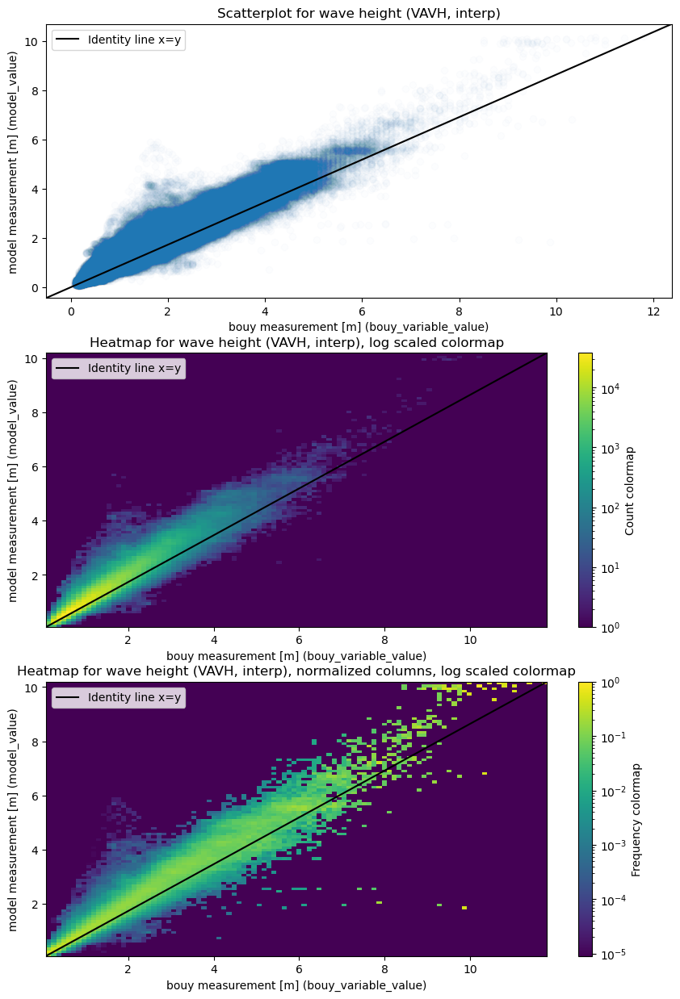

In [32]:
scatterplot_and_heatmaps(result_df_sel_VAVH, "wave height (VAVH, sel)", "m")
scatterplot_and_heatmaps(result_df_interp_VAVH, "wave height (VAVH, interp)", "m")


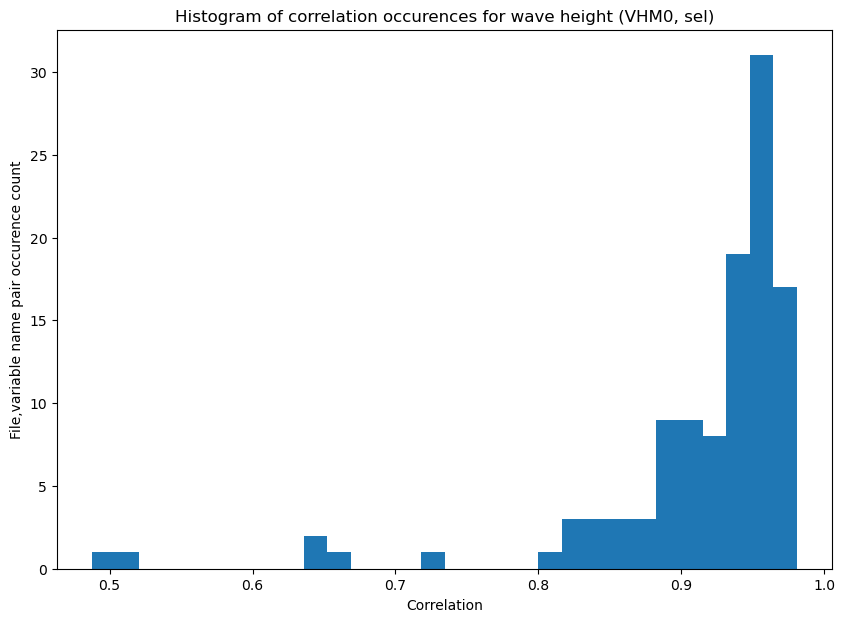

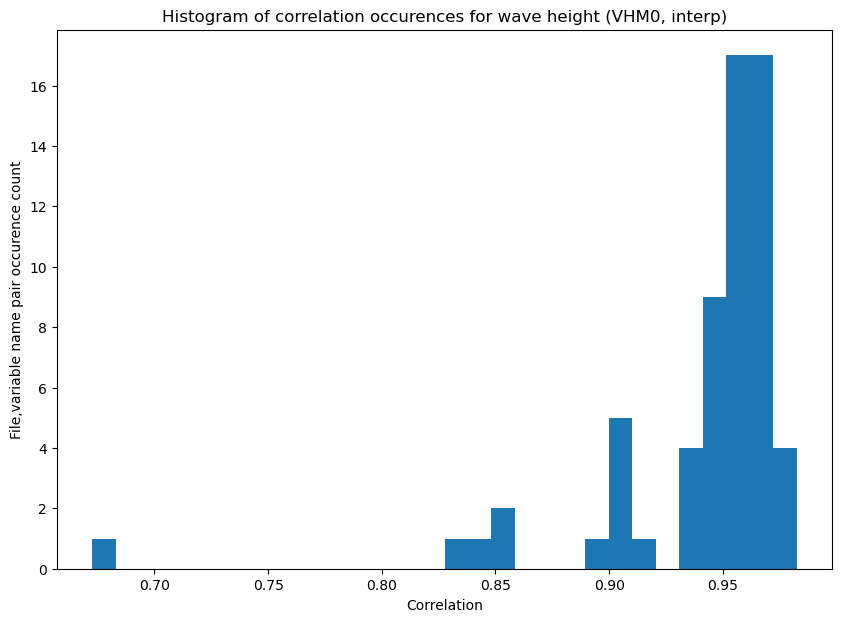

In [33]:
corr_hist(result_df_sel_VHM0_corr, "wave height (VHM0, sel)")
corr_hist(result_df_interp_VHM0_corr, "wave height (VHM0, interp)")

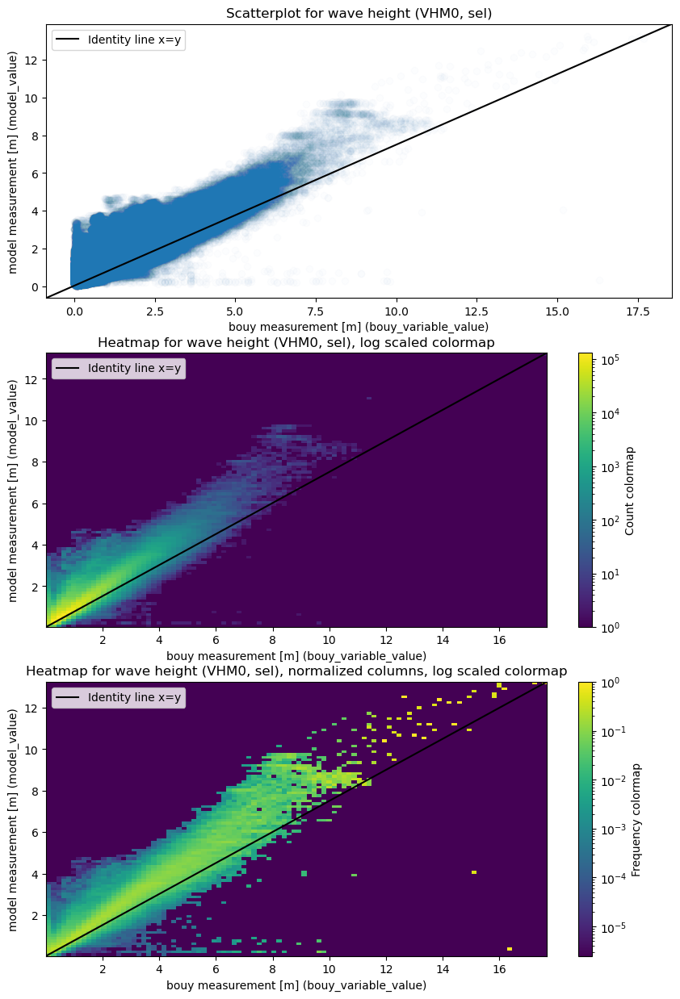

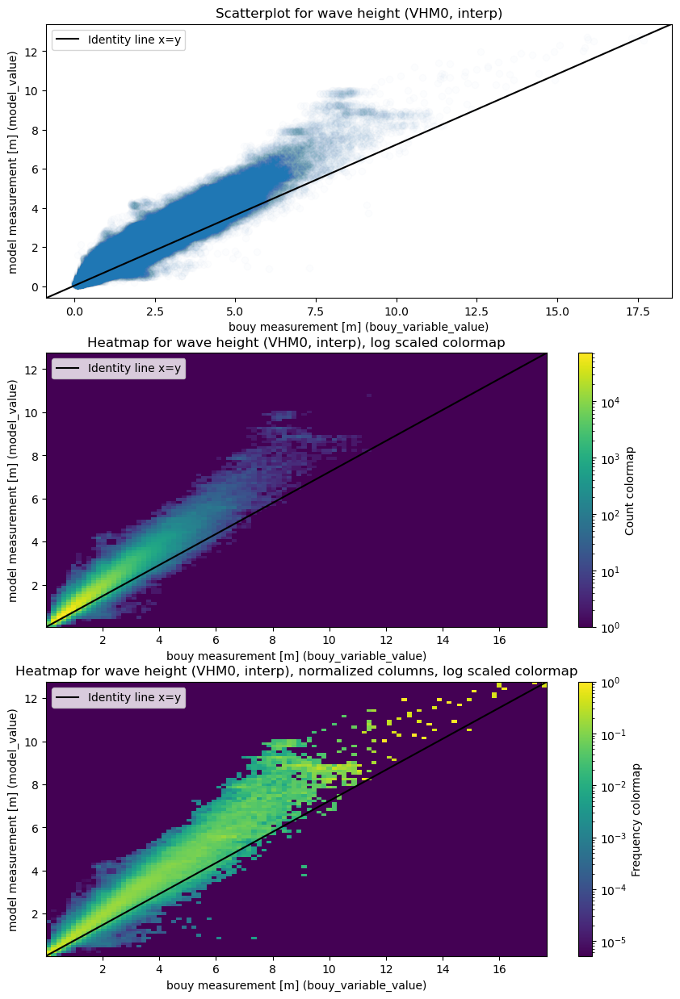

In [34]:
scatterplot_and_heatmaps(result_df_sel_VHM0, "wave height (VHM0, sel)", "m")
scatterplot_and_heatmaps(result_df_interp_VHM0, "wave height (VHM0, interp)", "m")

Worst and best files for wave height using sel
-------------------- The 6 files with worst correlation --------------------
The correlation for  VAVH in GL_TS_MO_55037.nc is -0.2981309141167539


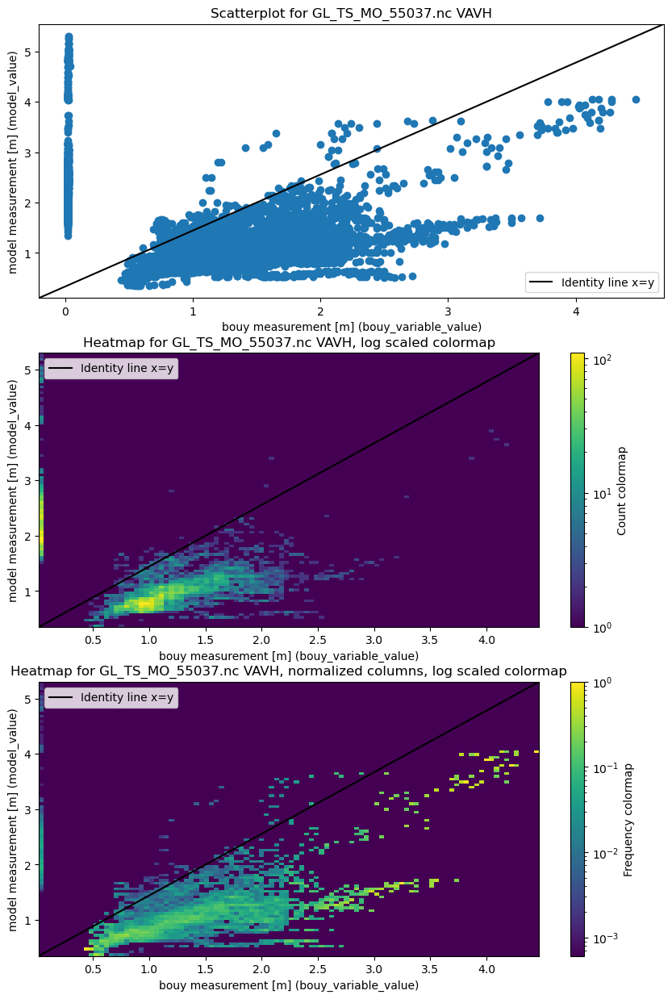

The correlation for  VHM0 in NO_TS_MO_Uithuizerwad2.nc is 0.48783978458048866


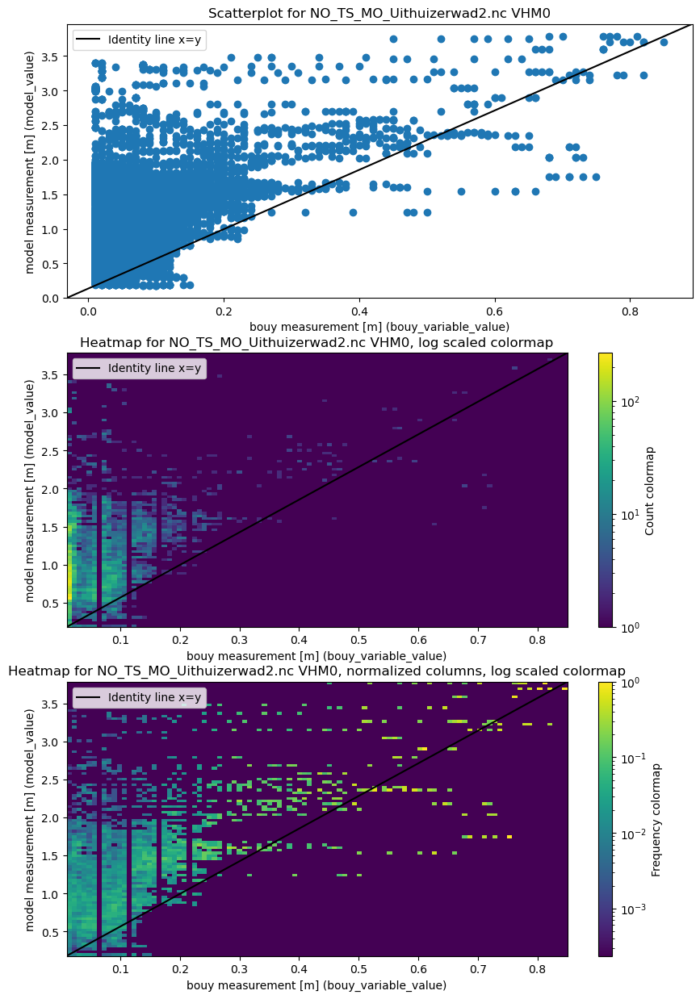

The correlation for  VAVH in NO_TS_MO_Uithuizerwad2.nc is 0.4917648878320483


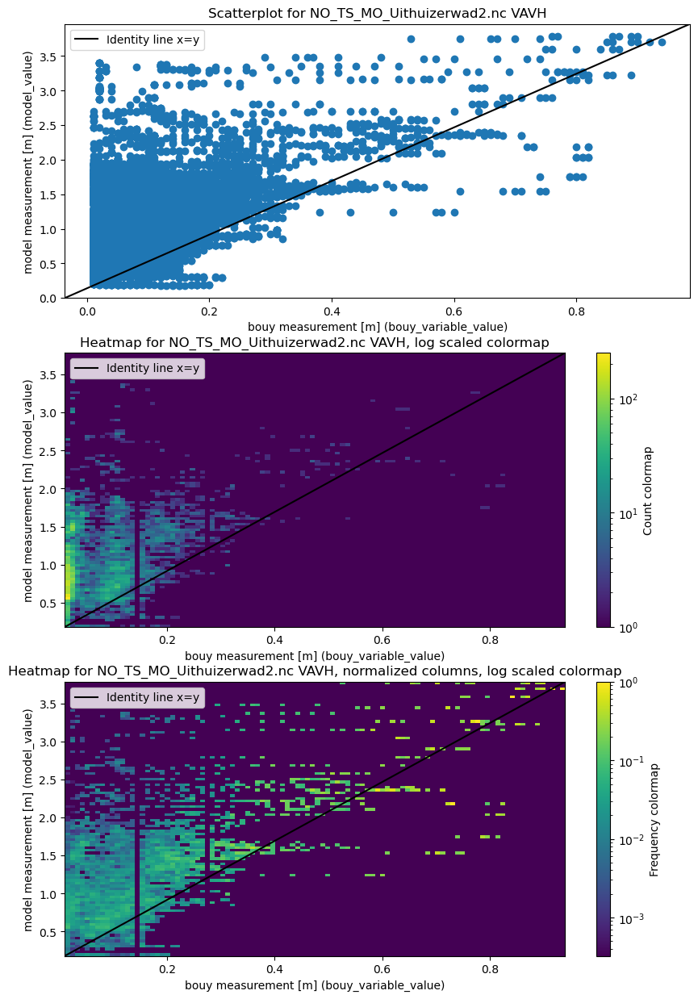

The correlation for  VAVH in NO_TS_MO_Uithuizerwad3.nc is 0.5079522157317851


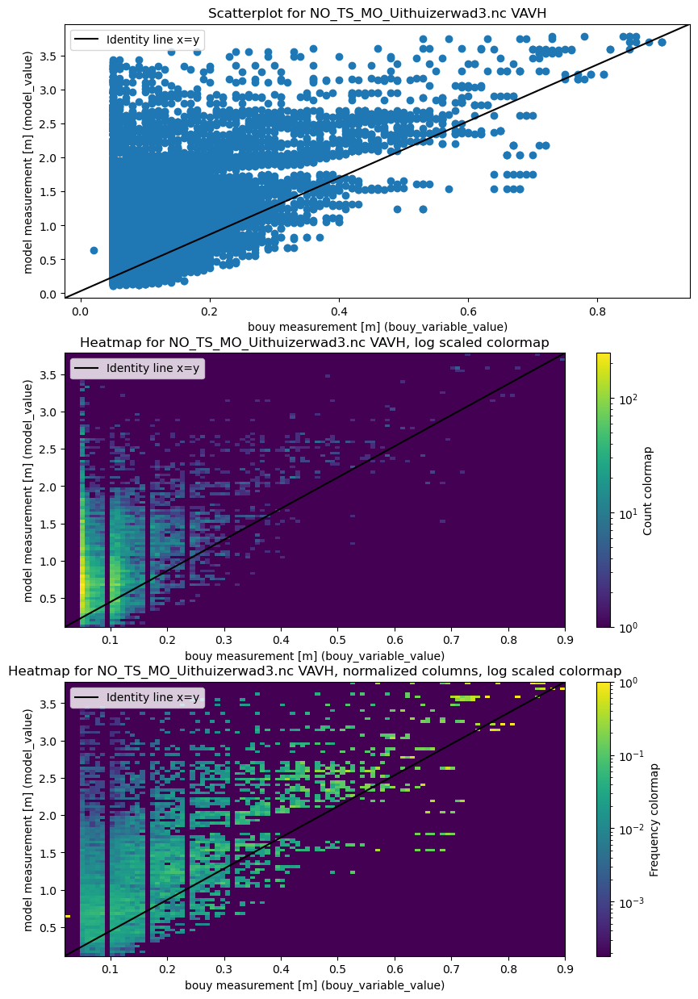

The correlation for  VHM0 in NO_TS_MO_Uithuizerwad3.nc is 0.5117467406498113


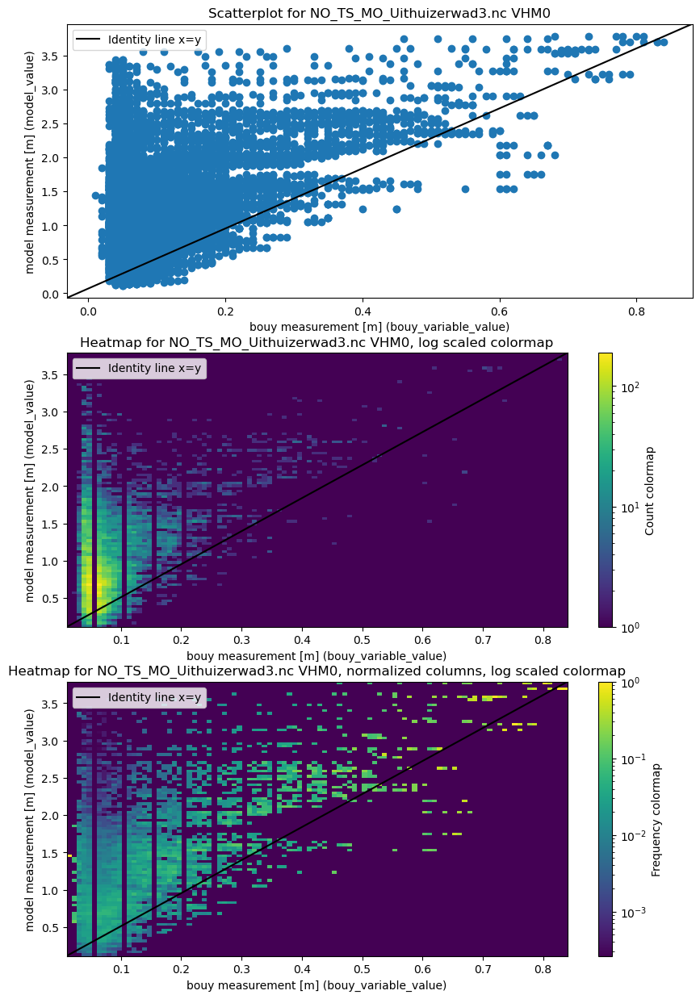

The correlation for  VAVH in GL_TS_MO_55481.nc is 0.5991432462174276


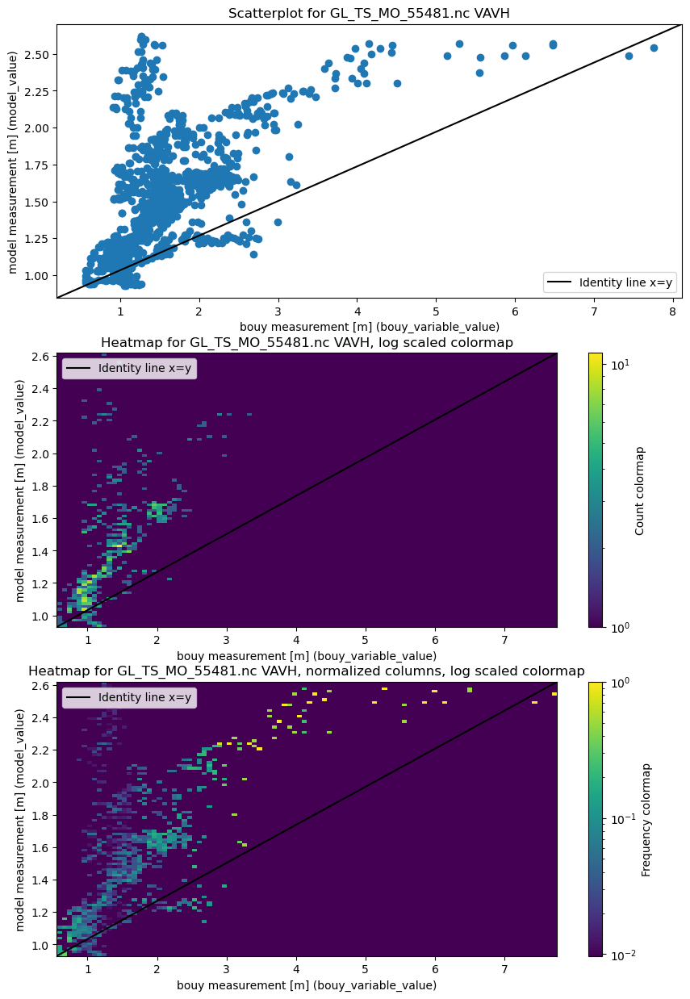

-------------------- The 2 files with best correlation --------------------
The correlation for  VHM0 in NO_TS_MO_A122.nc is 0.9791558574370103


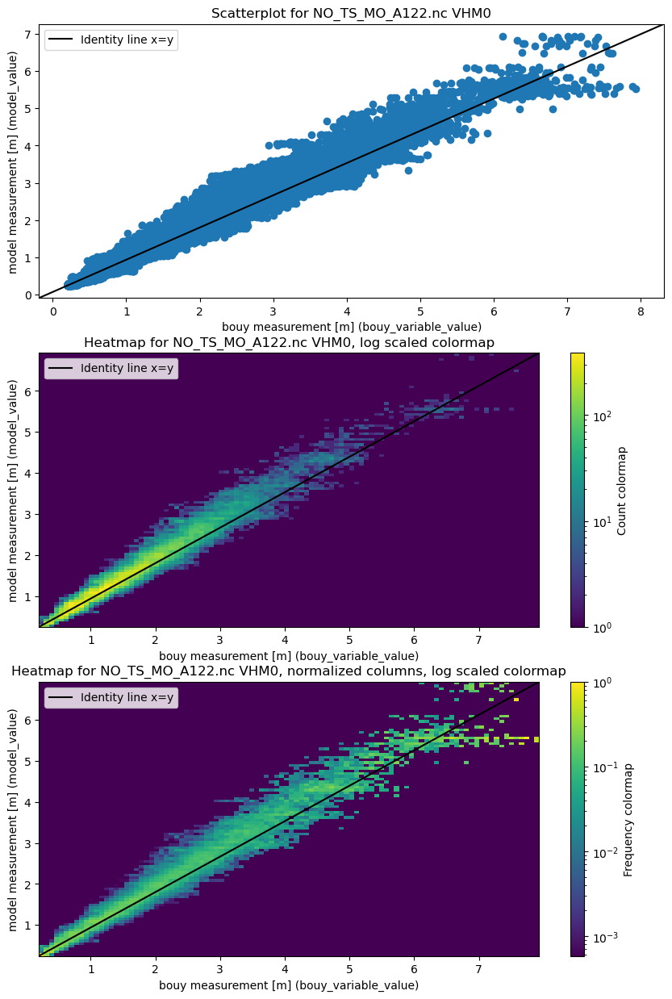

The correlation for  VHM0 in GL_TS_MO_46070.nc is 0.9808859098359011


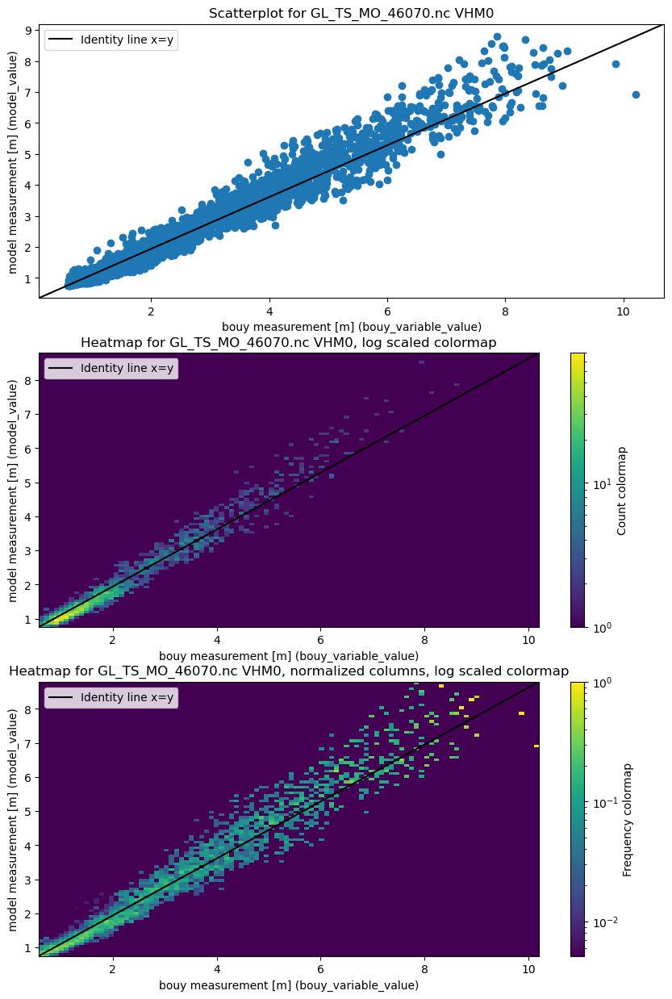

In [35]:
print("Worst and best files for wave height using sel")
scatterplot_worst_and_best(result_df_sel_swh, result_df_sel_swh_corr)

Worst and best files for wave height using interp
-------------------- The 6 files with worst correlation --------------------
The correlation for  VAVH in GL_TS_MO_55481.nc is 0.6203373498462287


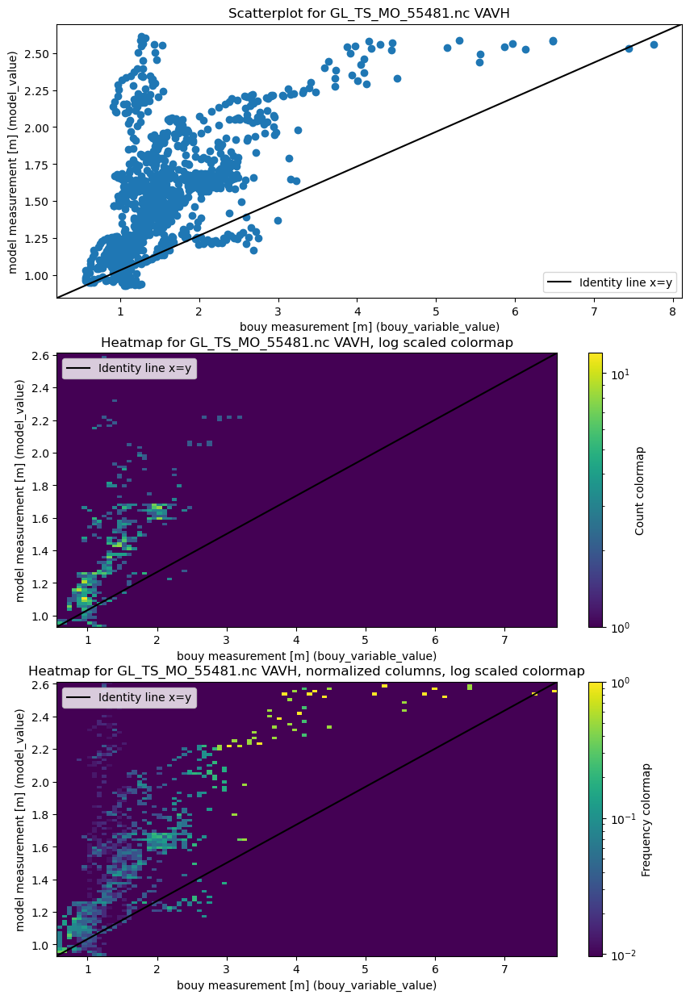

The correlation for  VAVH in GL_TS_MO_55058.nc is 0.664273342647588


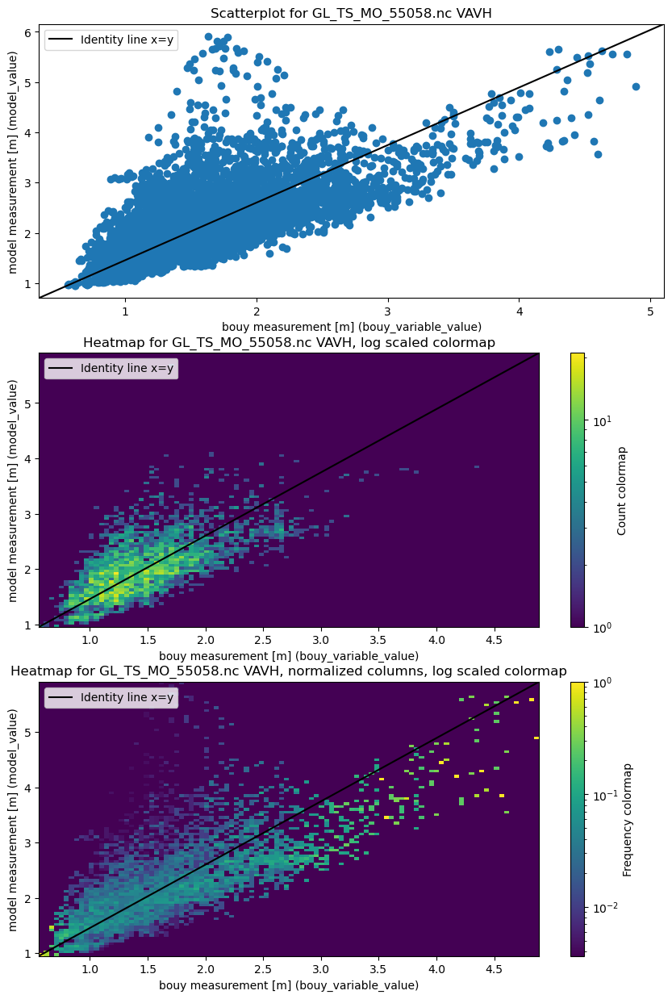

The correlation for  VHM0 in GL_TS_MO_52201.nc is 0.6726431425795871


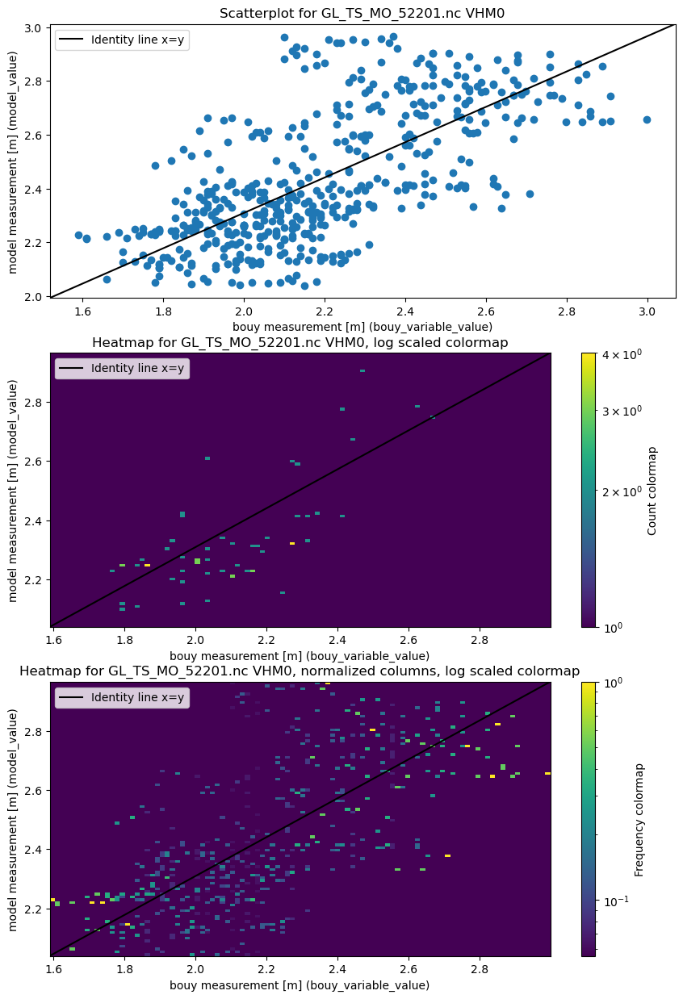

The correlation for  VAVH in GL_TS_MO_53048.nc is 0.7706663566447192


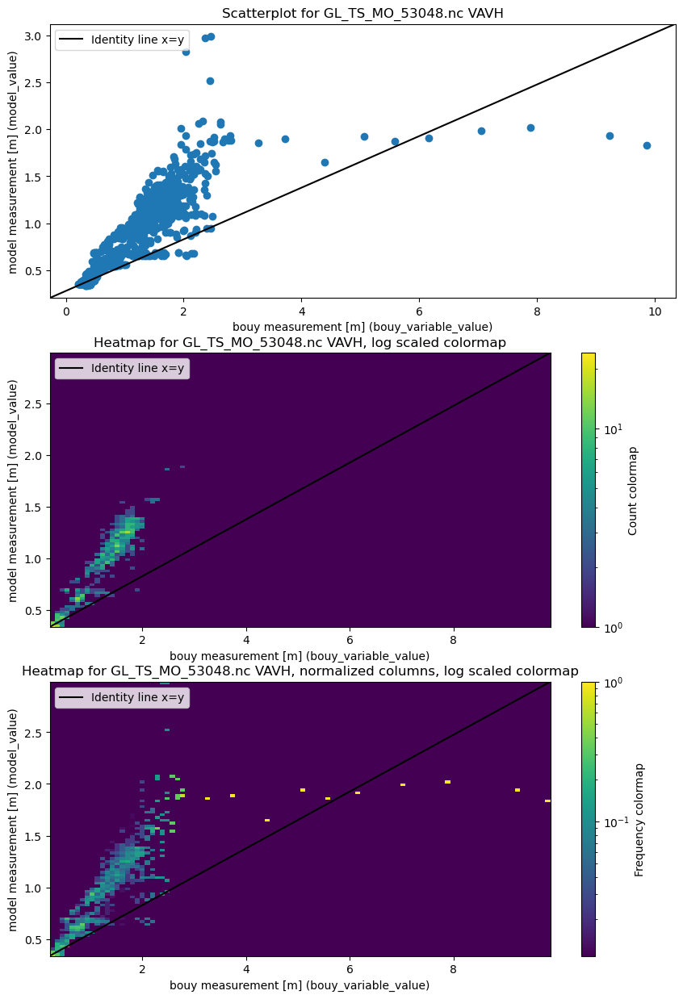

The correlation for  VAVH in GL_TS_MO_55020.nc is 0.8119370707385698


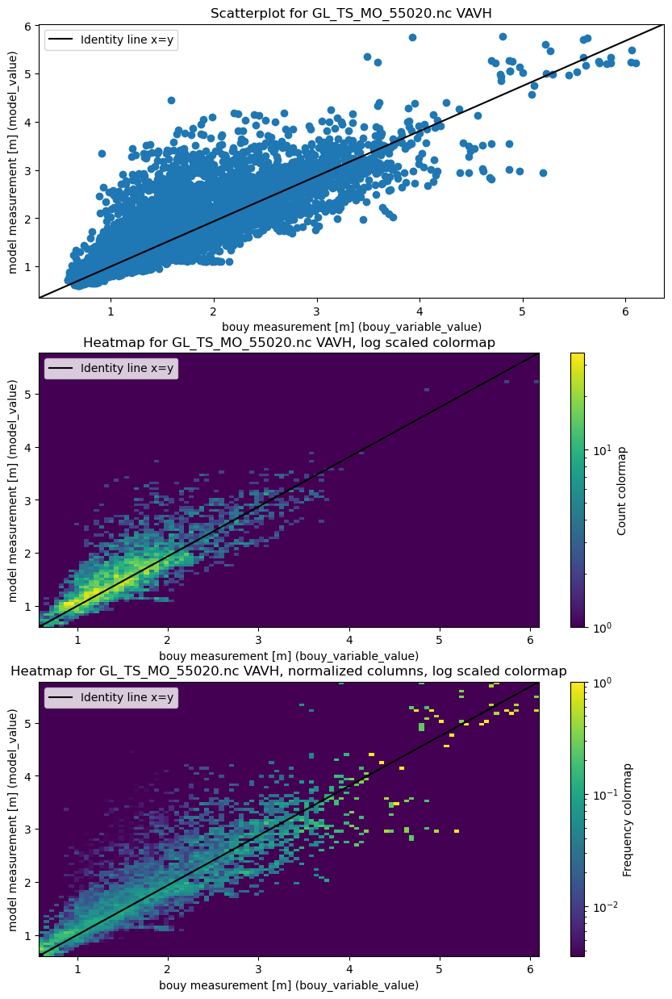

The correlation for  VHM0 in GL_TS_MO_Tantabiddi01.nc is 0.8319053624937038


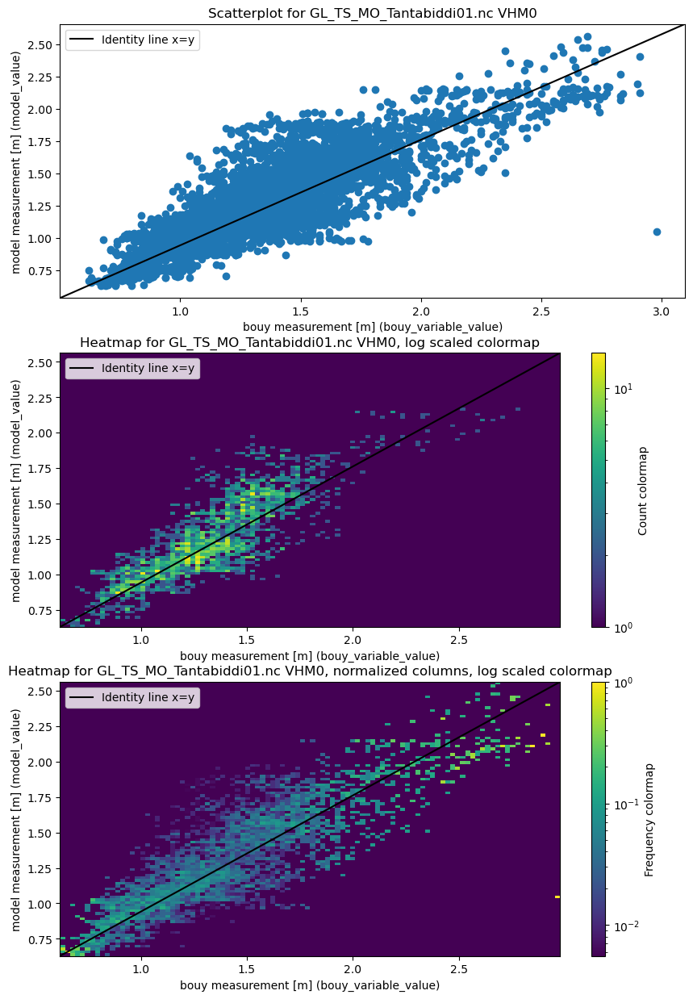

-------------------- The 2 files with best correlation --------------------
The correlation for  VHM0 in NO_TS_MO_A122.nc is 0.9798068714715275


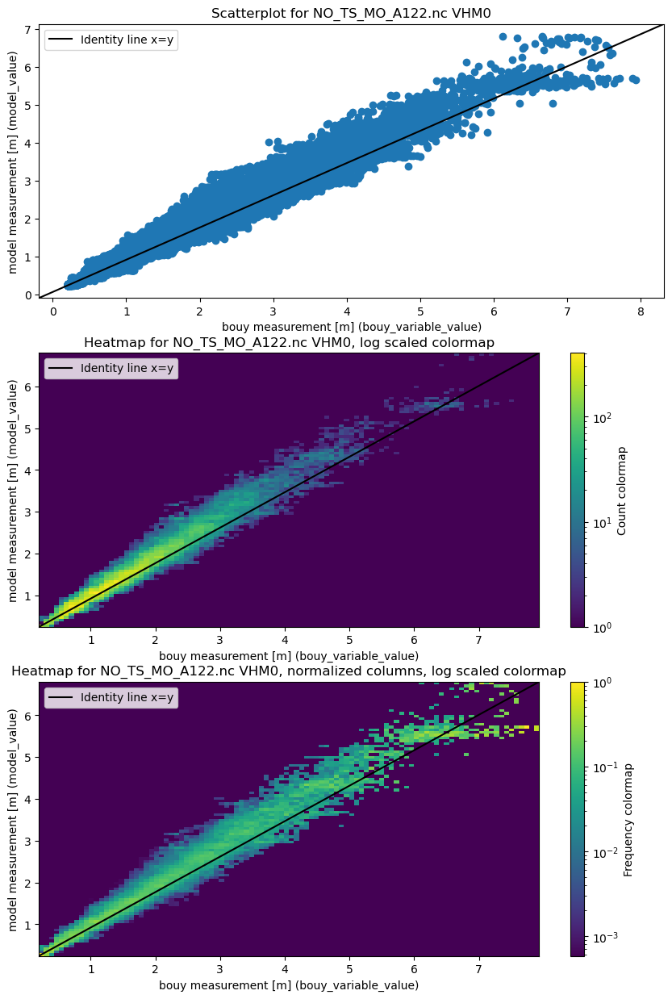

The correlation for  VHM0 in GL_TS_MO_46070.nc is 0.9825302882485113


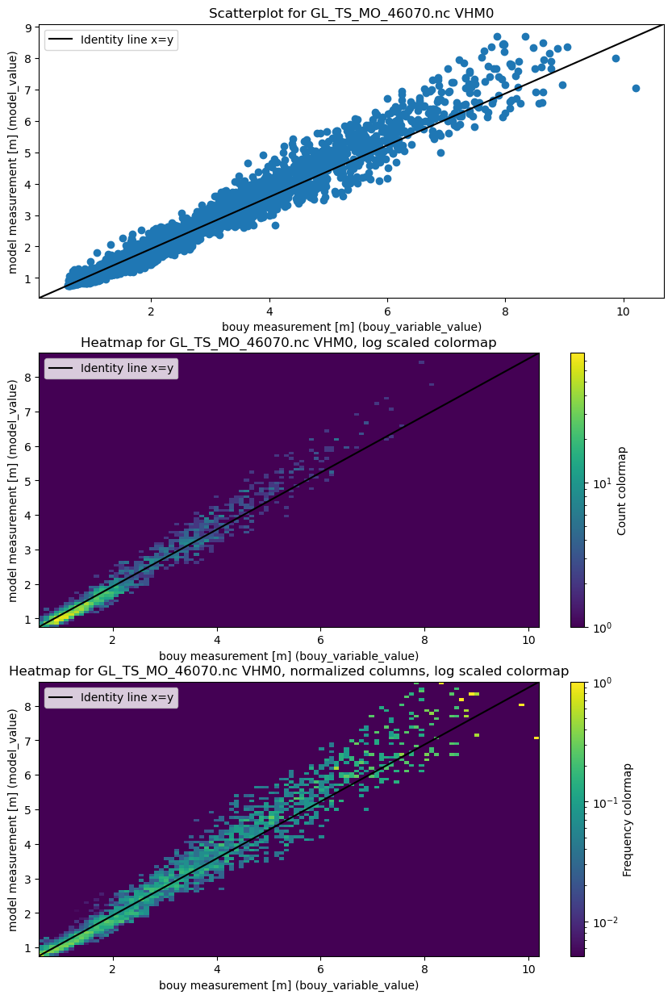

In [36]:
print("Worst and best files for wave height using interp")
scatterplot_worst_and_best(result_df_interp_swh, result_df_interp_swh_corr)

### Correlation depth analysis

In [37]:
#Create correlation dataframes
corr_df_sel = correlation_df(result_df_sel)
corr_df_sel = corr_df_sel.rename(columns={c:('sel_' + c) for c in corr_df_sel.columns})

corr_df_interp = correlation_df(result_df_interp)
corr_df_interp = corr_df_interp.rename(columns={c:('interp_' + c) for c in corr_df_interp.columns})

In [38]:
print("See worst and best select correlation")
with pd.option_context('display.max_rows', None):
    sort_corr_sel = corr_df_sel.sort_values('sel_correlation')
    print('Head')
    display(sort_corr_sel.head(20))
    print('Tail')
    display(sort_corr_sel.tail(20))

See worst and best select correlation
Head


,,sel_correlation,sel_correlation_depth_adjusted,sel_unique_depths,sel_nunique_depths
bouy_file_name,bouy_variable_name,,,,
GL_TS_MO_14043.nc,WSPD,-0.673752,-0.673752,"(-4.0,)",1
BO_TS_MO_Asko.nc,WSPD,-0.560041,-0.560041,"(0.0,)",1
GL_TS_MO_55037.nc,VAVH,-0.298131,-0.298131,"(0.0,)",1
BS_TS_MO_SPOT0776.nc,WSPD,-0.162226,-0.162226,"(0.0,)",1
BS_TS_MO_UGSB.nc,WSPD,-0.069621,-0.069621,"(-2.0,)",1
BS_TS_MO_URSS.nc,WSPD,-0.029214,-0.029214,"(-2.0,)",1
BS_TS_MO_SPOT0773.nc,WSPD,0.108280,0.108280,"(0.0,)",1
GL_TS_MO_53040.nc,WSPD,0.158299,0.158299,"(-3.1,)",1
GL_TS_MO_T5S165E.nc,WSPD,0.171518,0.171518,"(-4.0,)",1


Tail


sel_correlation  \
bouy_file_name             bouy_variable_name                    
GL_TS_MO_6100294.nc        VHM0                       0.967144   
NO_TS_MO_FINO1.nc          VHM0                       0.967168   
NO_TS_MO_FINO1WR.nc        VHM0                       0.967229   
NO_TS_MO_NOO.nc            VHM0                       0.967883   
GL_TS_MO_GoodrichBank01.nc VHM0                       0.968211   
NO_TS_MO_J61.nc            VHM0                       0.968235   
                           VAVH                       0.968676   
GL_TS_MO_56014.nc          VAVH                       0.969800   
NO_TS_MO_Butendiek.nc      VHM0                       0.970020   
                           VAVH                       0.970664   
NO_TS_MO_6200130.nc        VAVH                       0.971223   
NO_TS_MO_6200146.nc        VAVH                       0.972119   
NO_TS_MO_Heimdal.nc        VHM0                       0.974877   
NO_TS_MO_6300112.nc        VAVH                       0.977342   
NO_TS_MO_A121.nc           VAVH                       0.978013   
NO_TS_MO_6300110.nc        VAVH                       0.978385   
NO_TS_MO_A122.nc           VAVH                       0.978431   
NO_TS_MO_A121.nc           VHM0                       0.978586   
NO_TS_MO_A122.nc           VHM0                       0.979156   
GL_TS_MO_46070.nc          VHM0                       0.980886   

                                               sel_correlation_depth_adjusted  \
bouy_file_name             bouy_variable_name                                   
GL_TS_MO_6100294.nc        VHM0                                      0.967144   
NO_TS_MO_FINO1.nc          VHM0                                      0.967168   
NO_TS_MO_FINO1WR.nc        VHM0                                      0.967229   
NO_TS_MO_NOO.nc            VHM0                                      0.967883   
GL_TS_MO_GoodrichBank01.nc VHM0                                      0.968211   
NO_TS_MO_J61.nc            VHM0                                      0.968235   
                           VAVH                                      0.968676   
GL_TS_MO_56014.nc          VAVH                                      0.969800   
NO_TS_MO_Butendiek.nc      VHM0                                      0.970020   
                           VAVH                                      0.970664   
NO_TS_MO_6200130.nc        VAVH                                      0.971223   
NO_TS_MO_6200146.nc        VAVH                                      0.972119   
NO_TS_MO_Heimdal.nc        VHM0                                      0.974877   
NO_TS_MO_6300112.nc        VAVH                                      0.977342   
NO_TS_MO_A121.nc           VAVH                                      0.978013   
NO_TS_MO_6300110.nc        VAVH                                      0.978385   
NO_TS_MO_A122.nc           VAVH                                      0.978431   
NO_TS_MO_A121.nc           VHM0                                      0.978586   
NO_TS_MO_A122.nc           VHM0                                      0.979156   
GL_TS_MO_46070.nc          VHM0                                      0.980886   

                                              sel_unique_depths  \
bouy_file_name             bouy_variable_name                     
GL_TS_MO_6100294.nc        VHM0                          (0.0,)   
NO_TS_MO_FINO1.nc          VHM0                          (0.0,)   
NO_TS_MO_FINO1WR.nc        VHM0                          (0.0,)   
NO_TS_MO_NOO.nc            VHM0                          (0.0,)   
GL_TS_MO_GoodrichBank01.nc VHM0                          (0.0,)   
NO_TS_MO_J61.nc            VHM0                          (0.0,)   
                           VAVH                          (0.0,)   
GL_TS_MO_56014.nc          VAVH                          (0.0,)   
NO_TS_MO_Butendiek.nc      VHM0                          (0.0,)   
                           VAVH                          (0.0,)   
NO_TS_M

In [39]:
print("See worst and best interpolate correlation")
with pd.option_context('display.max_rows', None):
    sort_corr_interp = corr_df_interp.sort_values('interp_correlation')
    print('Head')
    display(sort_corr_interp.head(20))
    print('Tail')
    display(sort_corr_interp.tail(20))

See worst and best interpolate correlation
Head


,,interp_correlation,interp_correlation_depth_adjusted,interp_unique_depths,interp_nunique_depths
bouy_file_name,bouy_variable_name,,,,
GL_TS_MO_14043.nc,WSPD,-0.673752,-0.673752,"(-4.0,)",1
BO_TS_MO_Asko.nc,WSPD,-0.581883,-0.581883,"(0.0,)",1
BS_TS_MO_SPOT0776.nc,WSPD,-0.157043,-0.157043,"(0.0,)",1
BS_TS_MO_UGSB.nc,WSPD,-0.066532,-0.066532,"(-2.0,)",1
BS_TS_MO_URSS.nc,WSPD,0.005000,0.005000,"(-2.0,)",1
BS_TS_MO_SPOT0773.nc,WSPD,0.076346,0.076346,"(0.0,)",1
GL_TS_MO_53040.nc,WSPD,0.156562,0.156562,"(-3.1,)",1
GL_TS_MO_T5S165E.nc,WSPD,0.171594,0.171594,"(-4.0,)",1
GL_TS_MO_T2N165E.nc,WSPD,0.185229,0.185229,"(-4.0,)",1


Tail


interp_correlation  \
bouy_file_name             bouy_variable_name                       
NO_TS_MO_K13a2.nc          VAVH                          0.968919   
GL_TS_MO_GoodrichBank01.nc VHM0                          0.969119   
NO_TS_MO_J61.nc            VHM0                          0.969476   
NO_TS_MO_K13a3.nc          VHM0                          0.969489   
NO_TS_MO_FINO3.nc          VHM0                          0.969578   
NO_TS_MO_F3platform.nc     VAVH                          0.969645   
                           VHM0                          0.969735   
NO_TS_MO_J61.nc            VAVH                          0.970009   
BO_TS_MO_BothnianSea.nc    VHM0                          0.970565   
BO_TS_MO_BothnianBay.nc    VHM0                          0.971480   
NO_TS_MO_6200130.nc        VAVH                          0.973680   
NO_TS_MO_6200146.nc        VAVH                          0.976618   
NO_TS_MO_6300112.nc        VAVH                          0.978295   
NO_TS_MO_6300110.nc        VAVH                          0.978385   
NO_TS_MO_A121.nc           VAVH                          0.978487   
NO_TS_MO_Heimdal.nc        VHM0                          0.978512   
NO_TS_MO_A121.nc           VHM0                          0.979085   
NO_TS_MO_A122.nc           VAVH                          0.979093   
                           VHM0                          0.979807   
GL_TS_MO_46070.nc          VHM0                          0.982530   

                                               interp_correlation_depth_adjusted  \
bouy_file_name             bouy_variable_name                                      
NO_TS_MO_K13a2.nc          VAVH                                         0.968919   
GL_TS_MO_GoodrichBank01.nc VHM0                                         0.969119   
NO_TS_MO_J61.nc            VHM0                                         0.969476   
NO_TS_MO_K13a3.nc          VHM0                                         0.969489   
NO_TS_MO_FINO3.nc          VHM0                                         0.969578   
NO_TS_MO_F3platform.nc     VAVH                                         0.969645   
                           VHM0                                         0.969735   
NO_TS_MO_J61.nc            VAVH                                         0.970009   
BO_TS_MO_BothnianSea.nc    VHM0                                         0.970565   
BO_TS_MO_BothnianBay.nc    VHM0                                         0.971480   
NO_TS_MO_6200130.nc        VAVH                                         0.973680   
NO_TS_MO_6200146.nc        VAVH                                         0.976618   
NO_TS_MO_6300112.nc        VAVH                                         0.978295   
NO_TS_MO_6300110.nc        VAVH                                         0.978385   
NO_TS_MO_A121.nc           VAVH                                         0.978487   
NO_TS_MO_Heimdal.nc        VHM0                                         0.978512   
NO_TS_MO_A121.nc           VHM0                                         0.979085   
NO_TS_MO_A122.nc           VAVH                                         0.979093   
                           VHM0                                         0.979807   
GL_TS_MO_46070.nc          VHM0                                         0.982530   

                                              interp_unique_depths  \
bouy_file_name             bouy_variable_name                        
NO_TS_MO_K13a2.nc          VAVH                             (0.0,)   
GL_TS_MO_GoodrichBank01.nc VHM0                             (0.0,)   
NO_TS_MO_J61.nc            VHM0                             (0.0,)   
NO_TS_MO_K13a3.nc          VHM0                             (0.0,)   
NO_TS_MO_FINO3.nc          VHM0                             (0.0,)   
NO_TS_MO_F3platform.nc     VAVH                             (0.0,)   
                           VHM0                             (0.0,)   
NO_TS_MO_J61.nc            VAVH                  

In [40]:
#Merge the two dataframes
corr_df_all = pd.concat([
    #renaming the columns
    corr_df_sel,
    corr_df_interp,
    ], axis=1)
display(corr_df_all)

,,sel_correlation,sel_correlation_depth_adjusted,sel_unique_depths,sel_nunique_depths,interp_correlation,interp_correlation_depth_adjusted,interp_unique_depths,interp_nunique_depths
bouy_file_name,bouy_variable_name,,,,,,,,
GL_TS_MO_14043.nc,WSPD,-0.673752,-0.673752,"(-4.0,)",1,-0.673752,-0.673752,"(-4.0,)",1.0
BO_TS_MO_Asko.nc,WSPD,-0.560041,-0.560041,"(0.0,)",1,-0.581883,-0.581883,"(0.0,)",1.0
GL_TS_MO_55037.nc,VAVH,-0.298131,-0.298131,"(0.0,)",1,NaN,NaN,NaN,NaN
BS_TS_MO_SPOT0776.nc,WSPD,-0.162226,-0.162226,"(0.0,)",1,-0.157043,-0.157043,"(0.0,)",1.0
BS_TS_MO_UGSB.nc,WSPD,-0.069621,-0.069621,"(-2.0,)",1,-0.066532,-0.066532,"(-2.0,)",1.0
...,...,...,...,...,...,...,...,...,...
NO_TS_MO_6300110.nc,VAVH,0.978385,0.978385,"(0.0,)",1,0.978385,0.978385,"(0.0,)",1.0
NO_TS_MO_A122.nc,VAVH,0.978431,0.978431,"(0.0,)",1,0.979093,0.979093,"(0.0,)",1.0
NO_TS_MO_A121.nc,VHM0,0.978586,0.978586,"(0.0,)",1,0.979085,0.979085,"(0.0,)",1.0


In [41]:
print("show files without data from exactly one of the methods sel or interp")
corr_df_all_nan = corr_df_all[corr_df_all.isna().apply(any, axis=1)]

try:
    display(corr_df_all_nan.loc[corr_df_all_nan.index.get_level_values('bouy_variable_name').isin(['VHM0', 'VAVH'])])
except Exception as e:
    print('No entries for wave height are exclusively found with only one search function (select or interpolate)')

try:
    display(corr_df_all_nan.xs('WSPD', level='bouy_variable_name'))
except Exception as e:
    print('No entries for WSPD are exclusively found with only one search function (select or interpolate)')

show files without data from exactly one of the methods sel or interp


sel_correlation  \
bouy_file_name            bouy_variable_name                    
GL_TS_MO_55037.nc         VAVH                      -0.298131   
NO_TS_MO_Uithuizerwad2.nc VHM0                       0.487840   
                          VAVH                       0.491765   
NO_TS_MO_Uithuizerwad3.nc VAVH                       0.507952   
                          VHM0                       0.511747   
...                                                       ...   
GL_TS_MO_6100294.nc       VAVH                       0.965574   
                          VHM0                       0.967144   
NO_TS_MO_FINO1.nc         VHM0                       0.967168   
NO_TS_MO_FINO1WR.nc       VHM0                       0.967229   
GL_TS_MO_56014.nc         VAVH                       0.969800   

                                              sel_correlation_depth_adjusted  \
bouy_file_name            bouy_variable_name                                   
GL_TS_MO_55037.nc         VAVH                                     -0.298131   
NO_TS_MO_Uithuizerwad2.nc VHM0                                      0.487840   
                          VAVH                                      0.491765   
NO_TS_MO_Uithuizerwad3.nc VAVH                                      0.507952   
                          VHM0                                      0.511747   
...                                                                      ...   
GL_TS_MO_6100294.nc       VAVH                                      0.965574   
                          VHM0                                      0.967144   
NO_TS_MO_FINO1.nc         VHM0                                      0.967168   
NO_TS_MO_FINO1WR.nc       VHM0                                      0.967229   
GL_TS_MO_56014.nc         VAVH                                      0.969800   

                                             sel_unique_depths  \
bouy_file_name            bouy_variable_name                     
GL_TS_MO_55037.nc         VAVH                          (0.0,)   
NO_TS_MO_Uithuizerwad2.nc VHM0                          (0.0,)   
                          VAVH                          (0.0,)   
NO_TS_MO_Uithuizerwad3.nc VAVH                          (0.0,)   
                          VHM0                          (0.0,)   
...                                                        ...   
GL_TS_MO_6100294.nc       VAVH                          (0.0,)   
                          VHM0                          (0.0,)   
NO_TS_MO_FINO1.nc         VHM0                          (0.0,)   
NO_TS_MO_FINO1WR.nc       VHM0                          (0.0,)   
GL_TS_MO_56014.nc         VAVH                          (0.0,)   

                                              sel_nunique_depths  \
bouy_file_name            bouy_variable_name                       
GL_TS_MO_55037.nc         VAVH                                 1   
NO_TS_MO_Uithuizerwad2.nc VHM0                                 1   
                          VAVH                                 1   
NO_TS_MO_Uithuizerwad3.nc VAVH                                 1   
                          VHM0                                 1   
...                                                          ...   
GL_TS_MO_6100294.nc       VAVH                                 1   
                          VHM0                                 1   
NO_TS_MO_FINO1.nc         VHM0                                 1   
NO_TS_MO_FINO1WR.nc       VHM0                                 1   
GL_TS_MO_56014.nc         VAVH                                 1   

                                              interp_correlation  \
bouy_file_name            bouy_variable_name                       
GL_TS_MO_55037.nc         VAVH                               NaN   
NO_TS_MO_Uithuizerwad2.nc VHM0                               NaN   
                          VAVH                               NaN   
NO_TS_MO_Uithuizerwad3.nc VAVH                               NaN   
       

No entries for WSPD are exclusively found with only one search function (select or interpolate)


In [42]:
print("show files without data from both the methods sel and interp")
corr_df_all_not_nan = corr_df_all[~corr_df_all.isna().apply(any, axis=1)].drop(['sel_unique_depths', 'sel_nunique_depths'], axis=1).rename({
    'interp_unique_depths':'unique_depths',
    'interp_nunique_depths':'nunique_depths',
}, axis=1)
display(corr_df_all_not_nan)

show files without data from both the methods sel and interp


,,sel_correlation,sel_correlation_depth_adjusted,interp_correlation,interp_correlation_depth_adjusted,unique_depths,nunique_depths
bouy_file_name,bouy_variable_name,,,,,,
GL_TS_MO_14043.nc,WSPD,-0.673752,-0.673752,-0.673752,-0.673752,"(-4.0,)",1.0
BO_TS_MO_Asko.nc,WSPD,-0.560041,-0.560041,-0.581883,-0.581883,"(0.0,)",1.0
BS_TS_MO_SPOT0776.nc,WSPD,-0.162226,-0.162226,-0.157043,-0.157043,"(0.0,)",1.0
BS_TS_MO_UGSB.nc,WSPD,-0.069621,-0.069621,-0.066532,-0.066532,"(-2.0,)",1.0
BS_TS_MO_URSS.nc,WSPD,-0.029214,-0.029214,0.005000,0.005000,"(-2.0,)",1.0
...,...,...,...,...,...,...,...
NO_TS_MO_6300110.nc,VAVH,0.978385,0.978385,0.978385,0.978385,"(0.0,)",1.0
NO_TS_MO_A122.nc,VAVH,0.978431,0.978431,0.979093,0.979093,"(0.0,)",1.0
NO_TS_MO_A121.nc,VHM0,0.978586,0.978586,0.979085,0.979085,"(0.0,)",1.0


In [43]:
print("Do we have any files with more than 1 depth value?")
corr_df_all_not_nan_multi_depth = corr_df_all_not_nan[corr_df_all_not_nan['nunique_depths'] > 1]

display(corr_df_all_not_nan_multi_depth)
if not corr_df_all_not_nan_multi_depth.empty:
    raise ValueError("Depth is not unique for all files")
else:
    corr_df_all_not_nan['depth'] = corr_df_all_not_nan['unique_depths'].apply(lambda x: x[0])

Do we have any files with more than 1 depth value?


,,sel_correlation,sel_correlation_depth_adjusted,interp_correlation,interp_correlation_depth_adjusted,unique_depths,nunique_depths
bouy_file_name,bouy_variable_name,,,,,,


In [44]:
print("For each depth level plot average correlation")
display(
    corr_df_all_not_nan.groupby('depth').agg(
        mean_sel_correlation=('sel_correlation', 'mean'),
        mean_sel_correlation_depth_adjusted=('sel_correlation_depth_adjusted', 'mean'),
        mean_interp_correlation=('interp_correlation', 'mean'),
        mean_interp_correlation_depth_adjusted=('interp_correlation_depth_adjusted', 'mean'),
        file_count=('sel_correlation', 'count')
        )
)

For each depth level plot average correlation


,mean_sel_correlation,mean_sel_correlation_depth_adjusted,mean_interp_correlation,mean_interp_correlation_depth_adjusted,file_count
depth,,,,,
-28.0,0.706110,0.706110,0.696154,0.696154,2
-14.0,0.704251,0.704251,0.701688,0.701688,3
-12.0,0.661935,0.661935,0.666230,0.666230,1
-10.0,0.735276,0.735276,0.738493,0.738493,11
-9.0,0.904472,0.904472,0.899504,0.899504,1
-5.0,0.551267,0.551267,0.550498,0.550498,2
-4.0,0.401996,0.401996,0.402958,0.402958,25
-3.5,0.677558,0.677558,0.682806,0.682806,2
-3.1,0.158299,0.158299,0.156562,0.156562,1


### Compare wind models

#### Row wise

In [45]:
print('Depth wise wind speed correlation for regular model')
pd.concat([
    corr_list(result_df_sel_wspd, group_by=['bouy_depth'], bouy_variable_column='bouy_variable_value'),
    corr_list(result_df_sel_wspd, group_by=['bouy_depth'], bouy_variable_column='bouy_variable_value_depth_adjusted'),
    result_df_sel_wspd.groupby('bouy_depth')['bouy_file_name'].count().rename('datapoints_count'),
    result_df_sel_wspd.groupby('bouy_depth')['bouy_file_name'].nunique().rename('n_unique_bouys')
], axis=1).sort_index()

Depth wise wind speed correlation for regular model


,bouy_variable_value_corr,bouy_variable_value_depth_adjusted_corr,datapoints_count,n_unique_bouys
bouy_depth,,,,
-28.0,0.706110,0.706110,10640,2
-14.0,0.700529,0.700529,17408,3
-12.0,0.661935,0.661935,477142,1
-10.0,0.735199,0.735199,289116,11
-9.0,0.904472,0.904472,1763,1
-5.0,0.590075,0.590075,10630,2
-4.0,0.300979,0.300979,533182,25
-3.5,0.697973,0.697973,2316,2
-3.1,0.158299,0.158299,3070,1


In [46]:
print('Depth wise correlation for alternative wind speed model')
pd.concat([
    corr_list(coper_wspd_df_sel, group_by=['bouy_depth'], bouy_variable_column='bouy_variable_value'),
    corr_list(coper_wspd_df_sel, group_by=['bouy_depth'], bouy_variable_column='bouy_variable_value_depth_adjusted'),
    coper_wspd_df_sel.groupby('bouy_depth')['bouy_file_name'].count().rename('datapoints_count'),
    coper_wspd_df_sel.groupby('bouy_depth')['bouy_file_name'].nunique().rename('n_unique_bouys')
], axis=1).sort_index()

Depth wise correlation for alternative wind speed model


,bouy_variable_value_corr,bouy_variable_value_depth_adjusted_corr,datapoints_count,n_unique_bouys
bouy_depth,,,,
-28.00,0.822649,0.822649,10640,2
-14.00,0.926283,0.926283,17408,3
-12.00,0.874309,0.874309,477142,1
-10.00,0.904460,0.904460,289116,11
-9.00,0.935354,0.935354,1763,1
-5.70,0.940830,0.940830,22143,1
-5.00,0.930727,0.930727,36866,7
-4.90,0.870953,0.870953,74285,12
-4.70,0.908251,0.908251,32575,1


In [47]:
#Merge the two dataframes based on common index, then to the same
row_var_list = ['bouy_depth', 'model_value', 'bouy_variable_value', 'bouy_variable_value_depth_adjusted']
result_df_sel_wspd_reindexed = result_df_sel_wspd.set_index(['bouy_file_name', 'bouy_time'])[row_var_list]
display(result_df_sel_wspd_reindexed)

coper_wspd_df_sel_reindexed = coper_wspd_df_sel.set_index(['bouy_file_name', 'bouy_time'])[row_var_list].drop('bouy_depth', axis=1)
coper_wspd_df_sel_reindexed = coper_wspd_df_sel_reindexed.rename(columns={c:('coper_' + c) for c in coper_wspd_df_sel_reindexed.columns})
display(coper_wspd_df_sel_reindexed)

sel_wspd_row_wise_merged = pd.concat([
    result_df_sel_wspd_reindexed,
    coper_wspd_df_sel_reindexed,
], axis=1).dropna().reset_index()

display(sel_wspd_row_wise_merged)

bouy_depth  model_value  \
bouy_file_name      bouy_time                                                
GL_TS_MO_T5N180W.nc 2021-01-01 00:00:00.000000000        -4.0     7.559315   
                    2021-01-01 00:10:00.000000000        -4.0     7.559315   
                    2021-01-01 00:20:00.000000256        -4.0     7.559315   
                    2021-01-01 00:30:00.000000000        -4.0     7.178011   
                    2021-01-01 00:40:00.000000000        -4.0     7.178011   
...                                                       ...          ...   
NO_TS_MO_TWEms.nc   2021-09-23 23:41:00.000000000       -14.0    12.150875   
                    2021-09-24 00:40:59.999999744       -14.0    12.499408   
                    2021-09-24 01:41:00.000000000       -14.0    12.042102   
                    2021-09-24 02:41:00.000000000       -14.0    11.639090   
                    2021-09-24 03:40:59.999999744       -14.0    11.717392   

                                                   bouy_variable_value  \
bouy_file_name      bouy_time                                            
GL_TS_MO_T5N180W.nc 2021-01-01 00:00:00.000000000                7.205   
                    2021-01-01 00:10:00.000000000                6.203   
                    2021-01-01 00:20:00.000000256                6.864   
                    2021-01-01 00:30:00.000000000                6.384   
                    2021-01-01 00:40:00.000000000                7.075   
...                                                                ...   
NO_TS_MO_TWEms.nc   2021-09-23 23:41:00.000000000               10.100   
                    2021-09-24 00:40:59.999999744               10.300   
                    2021-09-24 01:41:00.000000000               10.200   
                    2021-09-24 02:41:00.000000000               10.100   
                    2021-09-24 03:40:59.999999744                8.800   

                                                   bouy_variable_value_depth_adjusted  
bouy_file_name      bouy_time                                                          
GL_TS_MO_T5N180W.nc 2021-01-01 00:00:00.000000000                            7.969066  
                    2021-01-01 00:10:00.000000000                            6.860807  
                    2021-01-01 00:20:00.000000256                            7.591904  
                    2021-01-01 00:30:00.000000000                            7.061001  
                    2021-01-01 00:40:00.000000000                            7.825280  
...                                                                               ...  
NO_TS_MO_TWEms.nc   2021-09-23 23:41:00.000000000                            9.733013  
                    2021-09-24 00:40:59.999999744                            9.925746  
                    2021-09-24 01:41:00.000000000                            9.829380  
                    2021-09-24 02:41:00.000000000                            9.733013  
                    2021-09-24 03:40:59.999999744                            8.480249  

[1796513 rows x 4 columns]

coper_model_value  \
bouy_file_name    bouy_time                                          
GL_TS_MO_41047.nc 2021-01-01 00:00:00.000000000           8.273409   
                  2021-01-01 00:10:00.000000000           8.273409   
                  2021-01-01 00:20:00.000000256           8.273409   
                  2021-01-01 00:30:00.000000000           8.420213   
                  2021-01-01 00:40:00.000000000           8.420213   
...                                                            ...   
NO_TS_MO_TWEms.nc 2021-09-23 23:41:00.000000000           9.750082   
                  2021-09-24 00:40:59.999999744           9.391102   
                  2021-09-24 01:41:00.000000000           9.220553   
                  2021-09-24 02:41:00.000000000           9.010355   
                  2021-09-24 03:40:59.999999744           9.080666   

                                                 coper_bouy_variable_value  \
bouy_file_name    bouy_time                                                  
GL_TS_MO_41047.nc 2021-01-01 00:00:00.000000000                      7.599   
                  2021-01-01 00:10:00.000000000                      7.399   
                  2021-01-01 00:20:00.000000256                      7.199   
                  2021-01-01 00:30:00.000000000                      7.499   
                  2021-01-01 00:40:00.000000000                      7.999   
...                                                                    ...   
NO_TS_MO_TWEms.nc 2021-09-23 23:41:00.000000000                     10.100   
                  2021-09-24 00:40:59.999999744                     10.300   
                  2021-09-24 01:41:00.000000000                     10.200   
                  2021-09-24 02:41:00.000000000                     10.100   
                  2021-09-24 03:40:59.999999744                      8.800   

                                                 coper_bouy_variable_value_depth_adjusted  
bouy_file_name    bouy_time                                                                
GL_TS_MO_41047.nc 2021-01-01 00:00:00.000000000                                  8.382050  
                  2021-01-01 00:10:00.000000000                                  8.161441  
                  2021-01-01 00:20:00.000000256                                  7.940831  
                  2021-01-01 00:30:00.000000000                                  8.271745  
                  2021-01-01 00:40:00.000000000                                  8.823268  
...                                                                                   ...  
NO_TS_MO_TWEms.nc 2021-09-23 23:41:00.000000000                                  9.733013  
                  2021-09-24 00:40:59.999999744                                  9.925746  
                  2021-09-24 01:41:00.000000000                                  9.829380  
                  2021-09-24 02:41:00.000000000                                  9.733013  
                  2021-09-24 03:40:59.999999744                                  8.480249  

[7162866 rows x 3 columns]

,bouy_file_name,bouy_time,bouy_depth,model_value,bouy_variable_value,bouy_variable_value_depth_adjusted,coper_model_value,coper_bouy_variable_value,coper_bouy_variable_value_depth_adjusted
0,GL_TS_MO_T0N165E.nc,2021-01-01 00:40:00.000000000,-4.0,6.550497,7.403,8.188063,6.391127,7.403,8.188063
1,GL_TS_MO_T0N165E.nc,2021-01-01 00:50:00.000000000,-4.0,6.550497,7.522,8.319682,6.391127,7.522,8.319682
2,GL_TS_MO_T0N165E.nc,2021-01-01 01:00:00.000000000,-4.0,6.550497,7.472,8.264380,6.391127,7.472,8.264380
3,GL_TS_MO_T0N165E.nc,2021-01-01 01:09:59.999999744,-4.0,6.550497,7.482,8.275441,6.391127,7.482,8.275441
4,GL_TS_MO_T0N165E.nc,2021-01-01 01:20:00.000000000,-4.0,6.550497,6.747,7.462496,6.391127,6.747,7.462496
...,...,...,...,...,...,...,...,...,...
1579326,NO_TS_MO_TWEms.nc,2021-09-23 23:41:00.000000000,-14.0,12.150875,10.100,9.733013,9.750082,10.100,9.733013
1579327,NO_TS_MO_TWEms.nc,2021-09-24 00:40:59.999999744,-14.0,12.499408,10.300,9.925746,9.391102,10.300,9.925746
1579328,NO_TS_MO_TWEms.nc,2021-09-24 01:41:00.000000000,-14.0,12.042102,10.200,9.829380,9.220553,10.200,9.829380
1579329,NO_TS_MO_TWEms.nc,2021-09-24 02:41:00.000000000,-14.0,11.639090,10.100,9.733013,9.010355,10.100,9.733013


In [48]:
print("Correlation of wind speed per depth level for rows common for both regular and copernicus wind model merged")
pd.concat([
    corr_list(sel_wspd_row_wise_merged, group_by=['bouy_depth'], bouy_variable_column='bouy_variable_value', model_variable_column='model_value'),
    corr_list(sel_wspd_row_wise_merged, group_by=['bouy_depth'], bouy_variable_column='bouy_variable_value_depth_adjusted', model_variable_column='model_value'),
    corr_list(sel_wspd_row_wise_merged, group_by=['bouy_depth'], bouy_variable_column='coper_bouy_variable_value', model_variable_column='coper_model_value'),
    corr_list(sel_wspd_row_wise_merged, group_by=['bouy_depth'], bouy_variable_column='coper_bouy_variable_value_depth_adjusted', model_variable_column='coper_model_value'),
    sel_wspd_row_wise_merged.groupby('bouy_depth')['bouy_variable_value'].count().rename('datapoints'),
    sel_wspd_row_wise_merged.groupby('bouy_depth')['bouy_file_name'].nunique().rename('n_unique_bouys')
], axis=1).sort_index()

Correlation of wind speed per depth level for rows common for both regular and copernicus wind model merged


,bouy_variable_value_corr,bouy_variable_value_depth_adjusted_corr,coper_bouy_variable_value_corr,coper_bouy_variable_value_depth_adjusted_corr,datapoints,n_unique_bouys
bouy_depth,,,,,,
-28.0,0.706110,0.706110,0.822649,0.822649,10640,2
-14.0,0.700529,0.700529,0.926283,0.926283,17408,3
-12.0,0.661935,0.661935,0.874309,0.874309,477142,1
-10.0,0.735199,0.735199,0.904460,0.904460,289116,11
-9.0,0.904472,0.904472,0.935354,0.935354,1763,1
-5.0,0.590075,0.590075,0.890078,0.890078,10630,2
-4.0,0.263815,0.263815,0.627743,0.627743,316000,20
-3.5,0.697973,0.697973,0.636058,0.636058,2316,2
-3.1,0.158299,0.158299,0.761321,0.761321,3070,1


#### File wise

In [49]:
corr_df_coper_wspd_df_sel = correlation_df(coper_wspd_df_sel)
corr_df_coper_wspd_df_sel = corr_df_coper_wspd_df_sel.rename(columns={c:('coper_sel_' + c) for c in corr_df_coper_wspd_df_sel.columns})

corr_df_result_df_sel_wspd = correlation_df(result_df_sel_wspd)
corr_df_result_df_sel_wspd = corr_df_result_df_sel_wspd.rename(columns={c:('sel_' + c) for c in corr_df_result_df_sel_wspd.columns})

In [50]:
#Merge the two dataframes
corr_df_wspd_comp = pd.concat([
    #renaming the columns
    corr_df_coper_wspd_df_sel,
    corr_df_result_df_sel_wspd,
    ], axis=1)

#Remove nan rows
corr_df_wspd_comp = corr_df_wspd_comp[~corr_df_wspd_comp.isna().apply(any, axis=1)].drop(['coper_sel_unique_depths', 'coper_sel_nunique_depths'], axis=1).rename({
    'sel_unique_depths':'unique_depths',
    'sel__nunique_depths':'nunique_depths',
}, axis=1)

corr_df_wspd_comp['depth'] = corr_df_wspd_comp['unique_depths'].apply(lambda x: x[0])
display(corr_df_wspd_comp)

,,coper_sel_correlation,coper_sel_correlation_depth_adjusted,sel_correlation,sel_correlation_depth_adjusted,unique_depths,sel_nunique_depths,depth
bouy_file_name,bouy_variable_name,,,,,,,
GL_TS_MO_2300453.nc,WSPD,0.129218,0.129218,0.182820,0.182820,"(0.0,)",1.0,0.0
BS_TS_MO_SPOT0776.nc,WSPD,0.271339,0.271339,-0.162226,-0.162226,"(0.0,)",1.0,0.0
GL_TS_MO_T5N165E.nc,WSPD,0.273648,0.273648,0.315953,0.315953,"(-4.0,)",1.0,-4.0
GL_TS_MO_13010.nc,WSPD,0.328744,0.328744,0.291900,0.291900,"(-4.0,)",1.0,-4.0
BS_TS_MO_URSS.nc,WSPD,0.336221,0.336221,-0.029214,-0.029214,"(-2.0,)",1.0,-2.0
...,...,...,...,...,...,...,...,...
NO_TS_MO_Troll-A.nc,WSPD,0.939165,0.939165,0.754013,0.754013,"(-10.0,)",1.0,-10.0
NO_TS_MO_Gullfaks-C.nc,WSPD,0.939503,0.939503,0.753102,0.753102,"(-10.0,)",1.0,-10.0
NO_TS_MO_NsbIII.nc,WSPD,0.946037,0.946037,0.725094,0.725094,"(-10.0,)",1.0,-10.0


In [51]:
print("Add diff columns")
corr_df_wspd_comp['correlation_diff'] = corr_df_wspd_comp['coper_sel_correlation'] - corr_df_wspd_comp['sel_correlation']
corr_df_wspd_comp['correlation_diff_depth_adjusted'] = corr_df_wspd_comp['coper_sel_correlation_depth_adjusted'] - corr_df_wspd_comp['sel_correlation_depth_adjusted']
display(corr_df_wspd_comp)

Add diff columns


,,coper_sel_correlation,coper_sel_correlation_depth_adjusted,sel_correlation,sel_correlation_depth_adjusted,unique_depths,sel_nunique_depths,depth,correlation_diff,correlation_diff_depth_adjusted
bouy_file_name,bouy_variable_name,,,,,,,,,
GL_TS_MO_2300453.nc,WSPD,0.129218,0.129218,0.182820,0.182820,"(0.0,)",1.0,0.0,-0.053602,-0.053602
BS_TS_MO_SPOT0776.nc,WSPD,0.271339,0.271339,-0.162226,-0.162226,"(0.0,)",1.0,0.0,0.433565,0.433565
GL_TS_MO_T5N165E.nc,WSPD,0.273648,0.273648,0.315953,0.315953,"(-4.0,)",1.0,-4.0,-0.042305,-0.042305
GL_TS_MO_13010.nc,WSPD,0.328744,0.328744,0.291900,0.291900,"(-4.0,)",1.0,-4.0,0.036845,0.036845
BS_TS_MO_URSS.nc,WSPD,0.336221,0.336221,-0.029214,-0.029214,"(-2.0,)",1.0,-2.0,0.365435,0.365435
...,...,...,...,...,...,...,...,...,...,...
NO_TS_MO_Troll-A.nc,WSPD,0.939165,0.939165,0.754013,0.754013,"(-10.0,)",1.0,-10.0,0.185152,0.185152
NO_TS_MO_Gullfaks-C.nc,WSPD,0.939503,0.939503,0.753102,0.753102,"(-10.0,)",1.0,-10.0,0.186401,0.186401
NO_TS_MO_NsbIII.nc,WSPD,0.946037,0.946037,0.725094,0.725094,"(-10.0,)",1.0,-10.0,0.220943,0.220943


In [52]:
print("Mean correlation difference")
print(corr_df_wspd_comp[['correlation_diff', 'correlation_diff_depth_adjusted']].mean())

Mean correlation difference
correlation_diff                   0.248005
correlation_diff_depth_adjusted    0.248005
dtype: float64


In [53]:
#Group by depth comparison
print('Mean difference per depth')
display(
    corr_df_wspd_comp.groupby('depth').agg(
        mean_coper_sel_correlation=('coper_sel_correlation', 'mean'),
        mean_coper_sel_correlation_depth_adjusted=('coper_sel_correlation_depth_adjusted', 'mean'),
        mean_sel_correlation=('sel_correlation', 'mean'),
        mean_sel_correlation_depth_adjusted=('sel_correlation_depth_adjusted', 'mean'),
        count=('sel_correlation', 'count') 
    )
)

Mean difference per depth


,mean_coper_sel_correlation,mean_coper_sel_correlation_depth_adjusted,mean_sel_correlation,mean_sel_correlation_depth_adjusted,count
depth,,,,,
-28.0,0.822649,0.822649,0.706110,0.706110,2
-14.0,0.925284,0.925284,0.704251,0.704251,3
-12.0,0.874309,0.874309,0.661935,0.661935,1
-10.0,0.901631,0.901631,0.735276,0.735276,11
-9.0,0.935354,0.935354,0.904472,0.904472,1
-5.0,0.874342,0.874342,0.551267,0.551267,2
-4.0,0.751319,0.751319,0.392205,0.392205,20
-3.5,0.607651,0.607651,0.677558,0.677558,2
-3.1,0.761321,0.761321,0.158299,0.158299,1


### KML pinmaps

In [54]:
def corr_KML_folder(corr_series, df, folder_name, folder_description=None):
    #Create kml folder
    KML_fldr = KML.Folder(
        KML.name(folder_name),
        KML.description(folder_description),
    )
    
    df_gb = df.groupby(['bouy_file_name', 'bouy_variable_name']).agg(
        mean_long=('bouy_longitude', 'mean'),
        mean_lat=('bouy_latitude', 'mean'),
        count=('bouy_longitude', 'count')
        )

    #For these entries save as kml
    for (file_corr, var_name), corr in corr_series.items():
        row = df_gb.loc[(file_corr, var_name)]
        
        #Create the pin
        pin = KML.Placemark(
            KML.name(str(corr)),
            KML.description(file_corr + ' ' + var_name + '\ncorr:' + str(corr) + str(row['count']) + " datapoints"),
            KML.Point(
                KML.coordinates(str(row['mean_long']) + "," + str(row['mean_lat']))
            )
        )
        KML_fldr.append(pin)

    return KML_fldr

In [55]:
#Save the worst files in regards to correlation as a kml map

folders = [
    read_folder_era5, #'./model_bouy_comparison_era5',
    read_folder_copernicus, #'./model_bouy_comparison_wspd_copernicus',
]

low_corr_limit = 0.5
high_corr_limit = 0.75

result_df_fn = 'result_dfs'
result_kml_fn = 'result_corr.kml'

for folder in folders:
    #Load dataframe
    with open(os.path.join(folder, result_df_fn),'rb') as f_r:
        result_df_sel_kml, result_df_interp_kml = pickle.load(f_r)

    #Create outer folder
    KML_outer_fldr = KML.Folder(
        KML.name(folder),
        KML.description("KML pinmaps of the locations of the file,variable combinations with low and high correlation for both the select method and interpolate"),
    )

    for (res_df, type) in [(result_df_sel_kml, 'select'), (result_df_interp_kml, 'interpolate')]:
        #Create kml folder
        KML_type_fldr = KML.Folder(
            KML.name(type),
            #KML.description(description)
        )

        res_corr = corr_list(res_df)

        low_corr = res_corr[res_corr <= low_corr_limit]
        low_corr_kml = corr_KML_folder(low_corr, res_df, "Low correlation", f"Correlation lower than {low_corr_limit}")
        KML_type_fldr.append(low_corr_kml)
        
        med_corr = res_corr[(res_corr <= low_corr_limit) & (res_corr >= high_corr_limit)]
        med_corr_kml = corr_KML_folder(med_corr, res_df, "Medium correlation", f"Correlation between {low_corr_limit} and {high_corr_limit}")
        KML_type_fldr.append(med_corr_kml)

        high_corr = res_corr[res_corr >= high_corr_limit]
        high_corr_kml = corr_KML_folder(high_corr, res_df, "High correlation", f"Correlation higher than {high_corr_limit}")
        KML_type_fldr.append(high_corr_kml)

        KML_outer_fldr.append(KML_type_fldr)

    with open(os.path.join(folder, result_kml_fn), 'w') as f_w:
        f_w.write(lxml.etree.tostring(KML_outer_fldr, pretty_print=True).decode())